yt : [WARNING  ] 2022-04-05 14:42:55,401 The stars particle filter already exists. Overriding.
yt : [INFO     ] 2022-04-05 14:42:55,444 Parameters: current_time              = 44.043410683196
yt : [INFO     ] 2022-04-05 14:42:55,446 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2022-04-05 14:42:55,448 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2022-04-05 14:42:55,450 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2022-04-05 14:42:55,453 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2022-04-05 14:42:55,454 Parameters: current_redshift          = 5.998999159612
yt : [INFO     ] 2022-04-05 14:42:55,456 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2022-04-05 14:42:55,458 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2022-04-05 14:42:55,460 Parameters: omega_radiation           = 0
yt : [INFO     ] 2022-04-05 14:42:55,462 Parameters: hubble_constant           = 0.695
Parsin


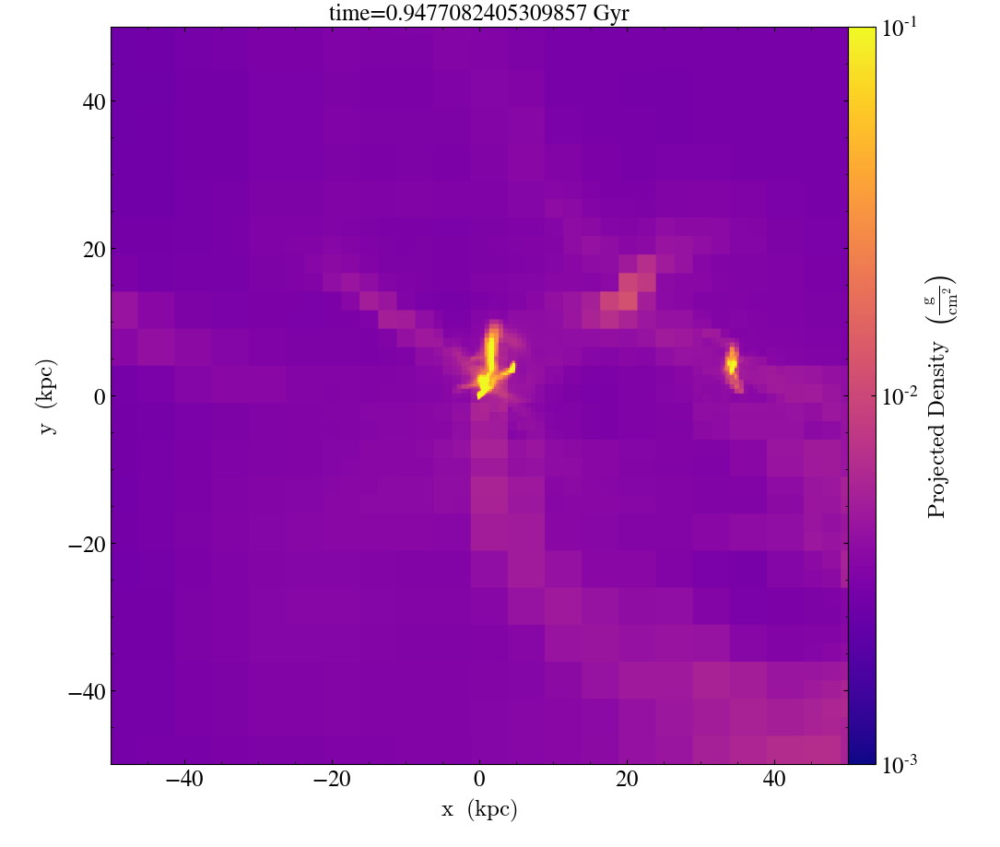

In [2]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

def dark_matter(pfilter, data):
    filter = (data["all", "particle_type"] == 1)
    return filter
add_particle_filter("stars", function=dark_matter, filtered_type='all',
                    requires=["particle_type"])
for n in range(22,23):
    fn='%04d'%n
    fd='/RD'+str(fn)
    ff='/RD'+str(fn)
    fpath = '/mnt/scratch/deovratd/Cosmological'+fd+ff
    data_ds = yt.load(fpath)
    data_ds.add_particle_filter('dark_matter')
    ad = data_ds.all_data() 
    time = data_ds.current_time.in_units('Gyr') 
    #0.1056936 0.4289028 0.5357428
    slc = yt.ProjectionPlot(data_ds, "z", "density",center=[0.1056936,0.4289028,0.5357428], width=(100,'kpc'))
    colorbar = slc.set_cmap(field='density', cmap='plasma')
    slc.set_zlim('density', 1.0e-3,1.0e-1)
    #slc.hide_colorbar()
    #slc.hide_axes()
    #slc.set_zlim('entropy', 1.0e-2,1.0e4)
    #slc.annotate_title("Narrow AGN JET")
    slc.annotate_title("time="+str(time))
    slc.save("/mnt/scratch/deovratd/Cosmological/zax_100kpc_"+str(fn))
    slc.show()

In [ ]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

def dark_matter(pfilter, data):
    filter = (data["all", "particle_type"] == 1)
    return filter
add_particle_filter("stars", function=dark_matter, filtered_type='all',
                    requires=["particle_type"])
for n in range(165,172):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath = '/mnt/scratch/deovratd/stellar_st2_5'+fd+ff
    data_ds = yt.load(fpath)
    data_ds.add_particle_filter('dark_matter')
    ad = data_ds.all_data() 
    time = data_ds.current_time.in_units('Gyr') 
    slc = yt.ProjectionPlot(data_ds, "z", "density",center=("max","Dark_Matter_Density"), width=(100,'kpc'))
    colorbar = slc.set_cmap(field='density', cmap='plasma')
    slc.set_zlim('density', 1.0e-3,1.0e-1)
    #slc.hide_colorbar()
    #slc.hide_axes()
    #slc.set_zlim('entropy', 1.0e-2,1.0e4)
    #slc.annotate_title("Narrow AGN JET")
    slc.annotate_title("time="+str(time))
    slc.save("/mnt/scratch/deovratd/stellar_st2_5/z_"+str(fn))
    slc.show()

yt : [WARNING  ] 2021-10-18 18:10:45,210 The stars particle filter already exists. Overriding.
yt : [INFO     ] 2021-10-18 18:10:45,247 Parameters: current_time              = 165.81660281079
yt : [INFO     ] 2021-10-18 18:10:45,250 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 18:10:45,252 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 18:10:45,254 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 18:10:45,256 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 18:10:45,258 Parameters: current_redshift          = 1.8614169312397
yt : [INFO     ] 2021-10-18 18:10:45,260 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 18:10:45,262 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 18:10:45,264 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 18:10:45,266 Parameters: hubble_constant           = 0.695
Parsi

In [5]:
import numpy as np
import yt
import matplotlib.pyplot as plt

Nfile = 210
time = np.zeros(Nfile)
cold_ph = np.zeros(Nfile)
int_ph = np.zeros(Nfile)
f = open("/mnt/scratch/deovratd/stellar_st2_5/gas_phase_vs_time_3", "w")
for n in range(187,Nfile):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/stellar_st2_5'+fd+ff    
    ds = yt.load(fpath)
    time[n] = ds.current_time.in_units('Gyr')
    d, c = ds.find_max("Dark_Matter_Density")
    sp = ds.sphere(c, (50.0, "kpc"))
    #ad = ds.all_data()
    cold = sp.cut_region(["obj['temperature'] < 1e4"])
    cool = sp.cut_region(["obj['temperature'] < 1e5"])
    warm = sp.cut_region(["obj['temperature'] < 1e6"])
    hot = sp.cut_region(["obj['temperature'] > 1e6"])
    cold_ph = cold.quantities.total_quantity(["cell_mass"])
    cool_ph = cool.quantities.total_quantity(["cell_mass"])
    warm_ph = warm.quantities.total_quantity(["cell_mass"])
    hot_ph = hot.quantities.total_quantity(["cell_mass"])
    f.write("%.7e %.7e %.7e %.7e %.7e\n"%(time[n], cold_ph/2.0e33, cool_ph/2.0e33, warm_ph/2.0e33, hot_ph/2.0e33))
f.close()

yt : [INFO     ] 2021-11-02 11:00:09,940 Parameters: current_time              = 187.81660281079
yt : [INFO     ] 2021-11-02 11:00:09,942 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-11-02 11:00:09,943 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-11-02 11:00:09,944 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-11-02 11:00:09,945 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-11-02 11:00:09,947 Parameters: current_redshift          = 1.6248712968
yt : [INFO     ] 2021-11-02 11:00:09,948 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-11-02 11:00:09,949 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-11-02 11:00:09,950 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-11-02 11:00:09,951 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3373/3373 [00:00<00:00, 5542.05it/s]
yt : [INFO     ] 2021-11-02 1

yt : [INFO     ] 2021-11-02 11:06:02,630 Max Value is 4.01598e+08 at 0.5092945098876953 0.5110149383544922 0.4872493743896484
yt : [INFO     ] 2021-11-02 11:06:11,766 Parameters: current_time              = 194.81660281079
yt : [INFO     ] 2021-11-02 11:06:11,768 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-11-02 11:06:11,769 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-11-02 11:06:11,770 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-11-02 11:06:11,771 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-11-02 11:06:11,772 Parameters: current_redshift          = 1.558774103901
yt : [INFO     ] 2021-11-02 11:06:11,773 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-11-02 11:06:11,774 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-11-02 11:06:11,776 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-11-02 11:06:11,777 Parameters: hubble_co

yt : [INFO     ] 2021-11-02 11:19:20,466 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3528/3528 [00:00<00:00, 11957.92it/s]
yt : [INFO     ] 2021-11-02 11:19:21,430 Gathering a field list (this may take a moment.)
yt : [INFO     ] 2021-11-02 11:20:22,385 Max Value is 3.88529e+08 at 0.5095806121826172 0.5117092132568359 0.4867229461669922
yt : [INFO     ] 2021-11-02 11:20:35,653 Parameters: current_time              = 208.81660281079
yt : [INFO     ] 2021-11-02 11:20:35,655 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-11-02 11:20:35,656 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-11-02 11:20:35,657 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-11-02 11:20:35,659 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-11-02 11:20:35,660 Parameters: current_redshift          = 1.4373749001417
yt : [INFO     ] 2021-11-02 11:20:35,661 Parameters: omega_lambda 

yt : [INFO     ] 2021-10-15 11:49:13,704 Parameters: current_time              = 123.81653315489
yt : [INFO     ] 2021-10-15 11:49:13,707 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 11:49:13,709 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 11:49:13,711 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 11:49:13,714 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 11:49:13,715 Parameters: current_redshift          = 2.4941699344802
yt : [INFO     ] 2021-10-15 11:49:13,717 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 11:49:13,719 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 11:49:13,721 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 11:49:13,723 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3225/3225 [00:00<00:00, 6163.86it/s]
yt : [INFO     ] 2021-10-1


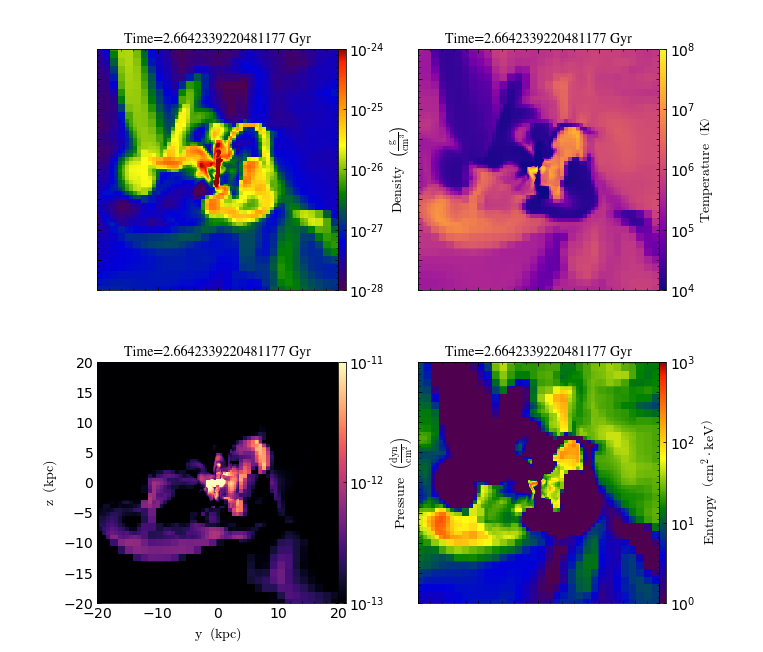
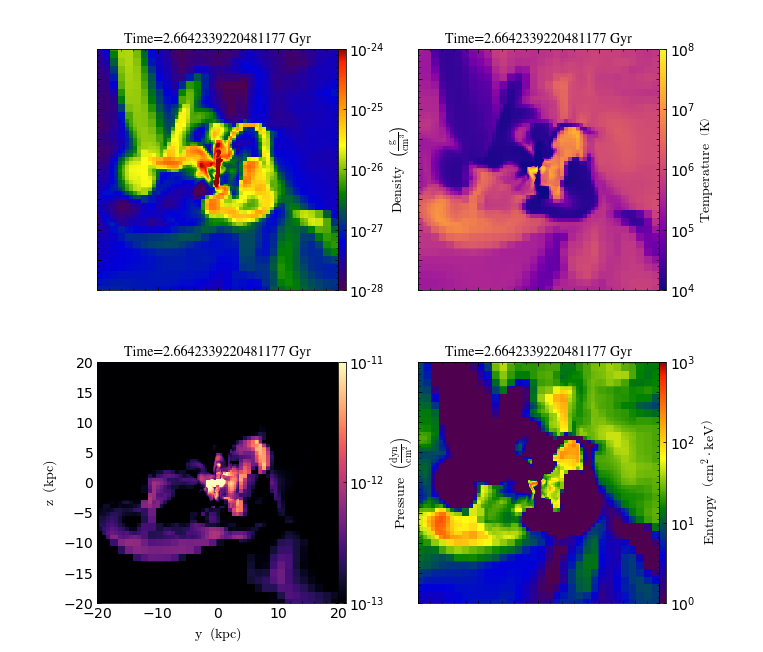
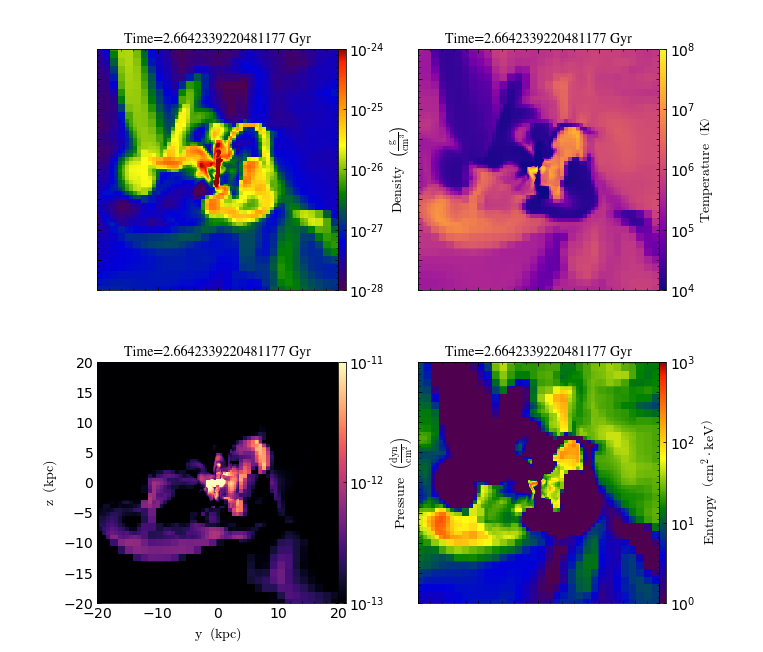
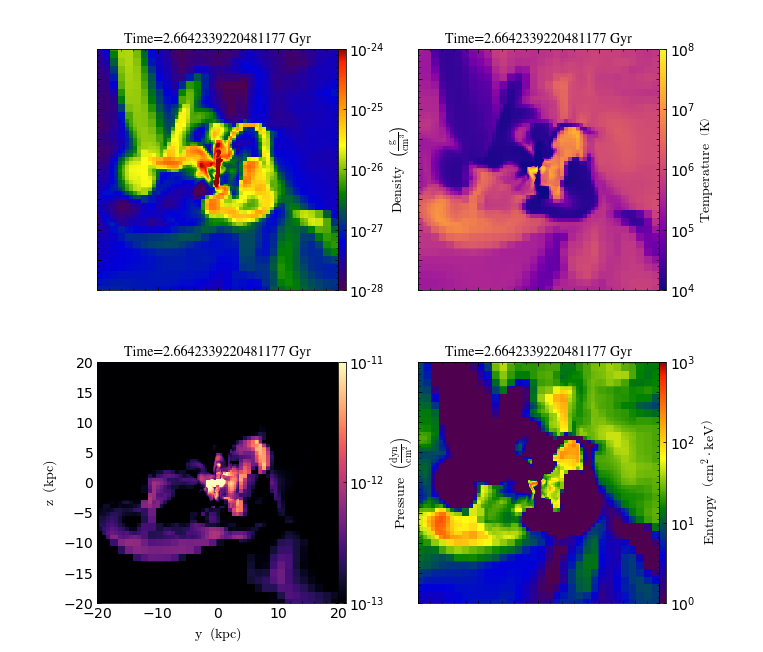

yt : [INFO     ] 2021-10-15 11:54:59,649 Parameters: current_time              = 124.81660281776
yt : [INFO     ] 2021-10-15 11:54:59,652 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 11:54:59,654 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 11:54:59,656 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 11:54:59,659 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 11:54:59,661 Parameters: current_redshift          = 2.4751240873046
yt : [INFO     ] 2021-10-15 11:54:59,663 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 11:54:59,665 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 11:54:59,667 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 11:54:59,669 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3181/3181 [00:00<00:00, 5349.07it/s]
yt : [INFO     ] 2021-10-1


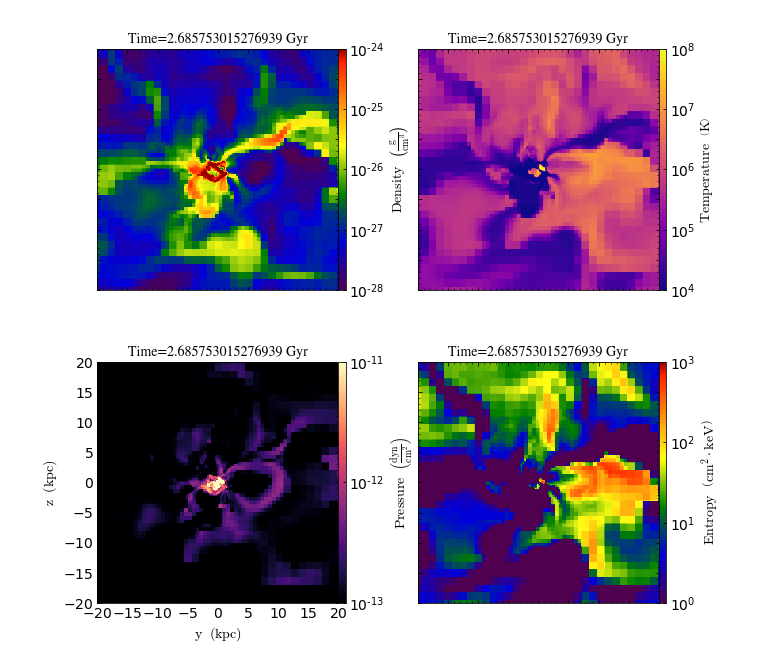
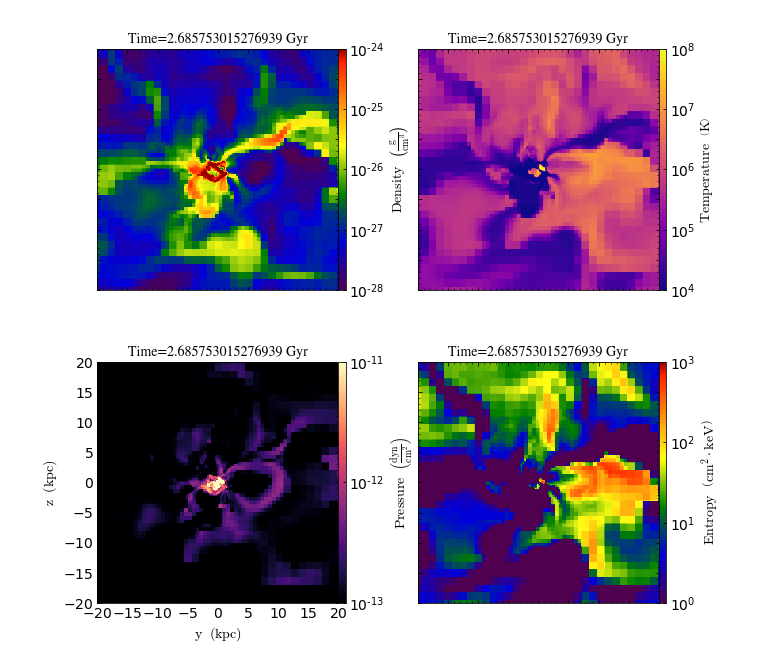
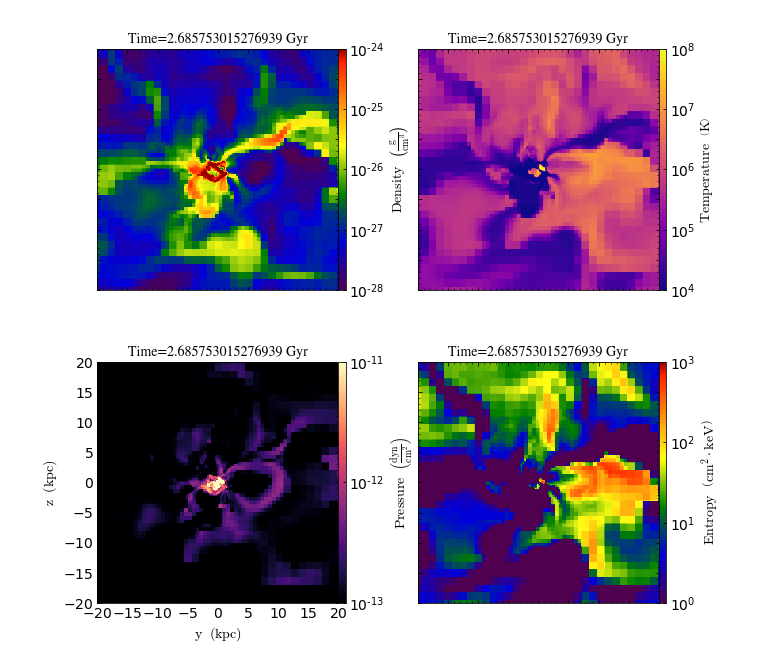
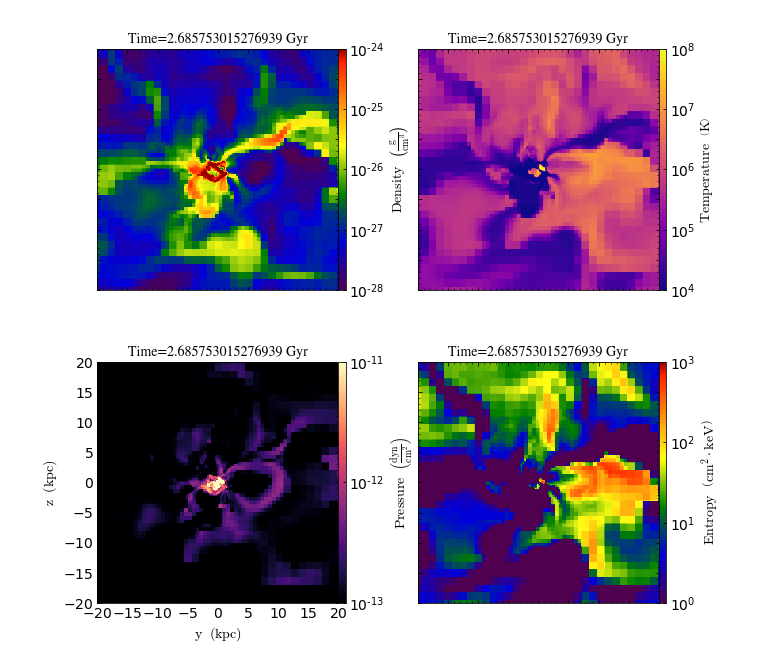

yt : [INFO     ] 2021-10-15 12:00:21,447 Parameters: current_time              = 125.81660281079
yt : [INFO     ] 2021-10-15 12:00:21,449 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 12:00:21,452 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 12:00:21,454 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 12:00:21,456 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 12:00:21,458 Parameters: current_redshift          = 2.4563222146479
yt : [INFO     ] 2021-10-15 12:00:21,460 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 12:00:21,462 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 12:00:21,464 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 12:00:21,466 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3200/3200 [00:00<00:00, 4314.81it/s]
yt : [INFO     ] 2021-10-1


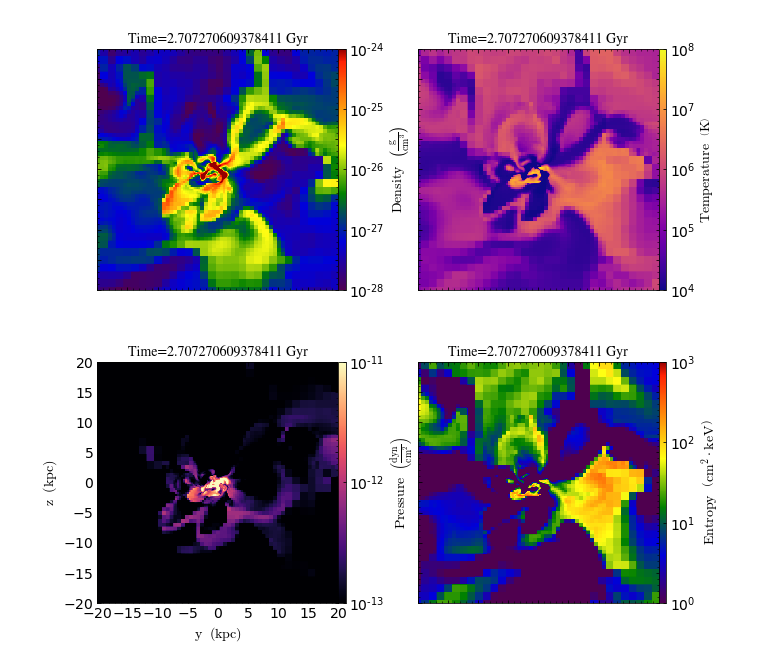
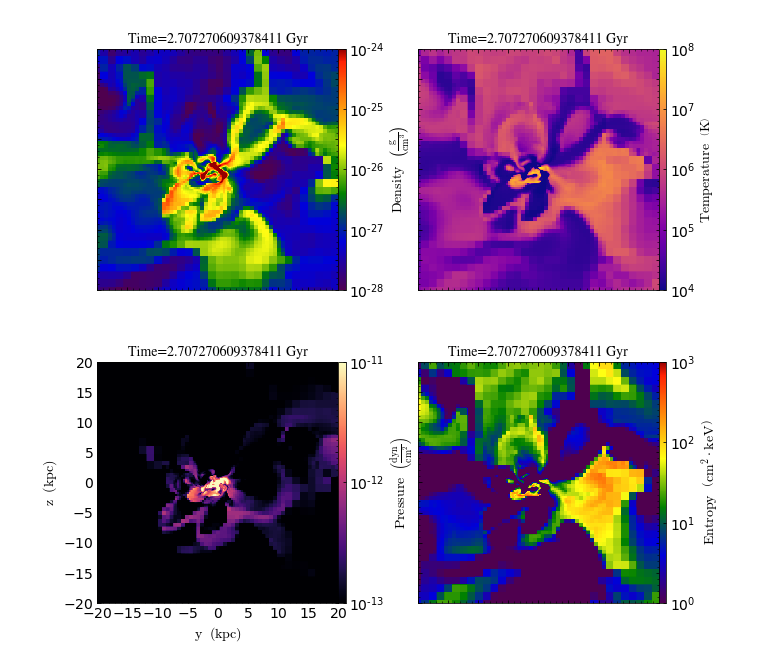
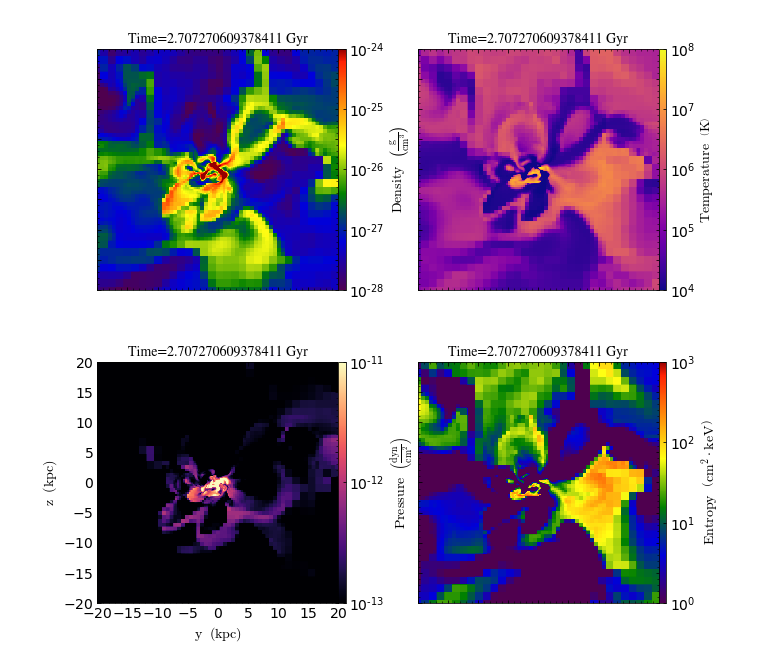
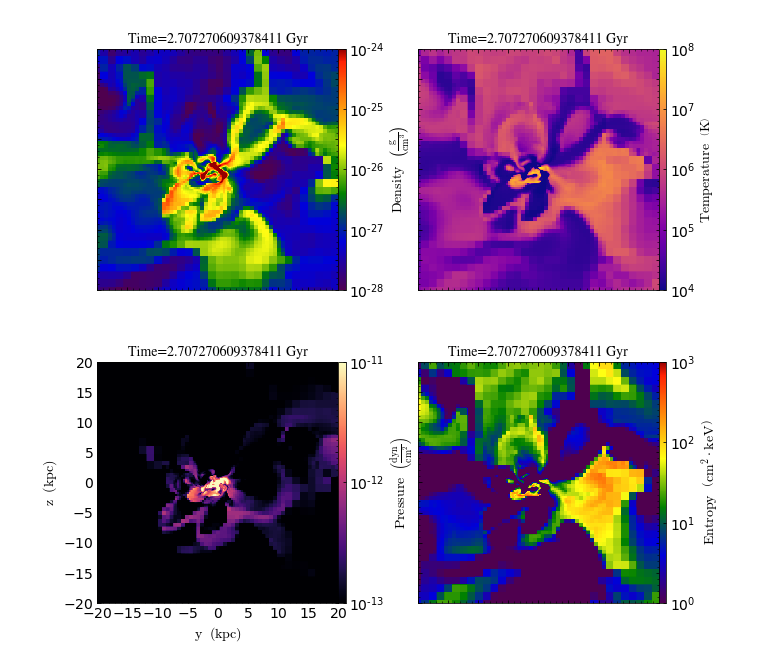

yt : [INFO     ] 2021-10-15 12:05:15,203 Parameters: current_time              = 126.81660281079
yt : [INFO     ] 2021-10-15 12:05:15,205 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 12:05:15,207 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 12:05:15,210 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 12:05:15,212 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 12:05:15,214 Parameters: current_redshift          = 2.437767092246
yt : [INFO     ] 2021-10-15 12:05:15,216 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 12:05:15,218 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 12:05:15,220 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 12:05:15,222 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3245/3245 [00:00<00:00, 3333.90it/s]
yt : [INFO     ] 2021-10-15


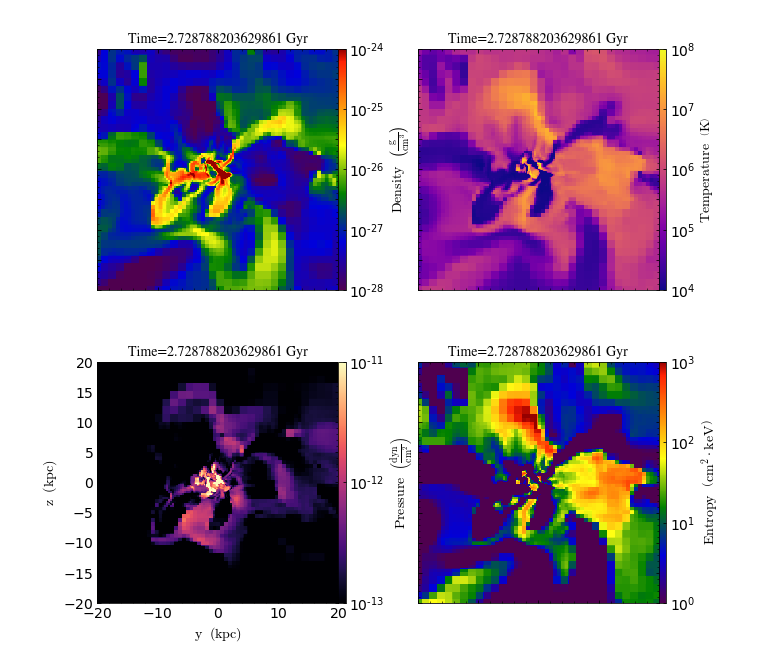
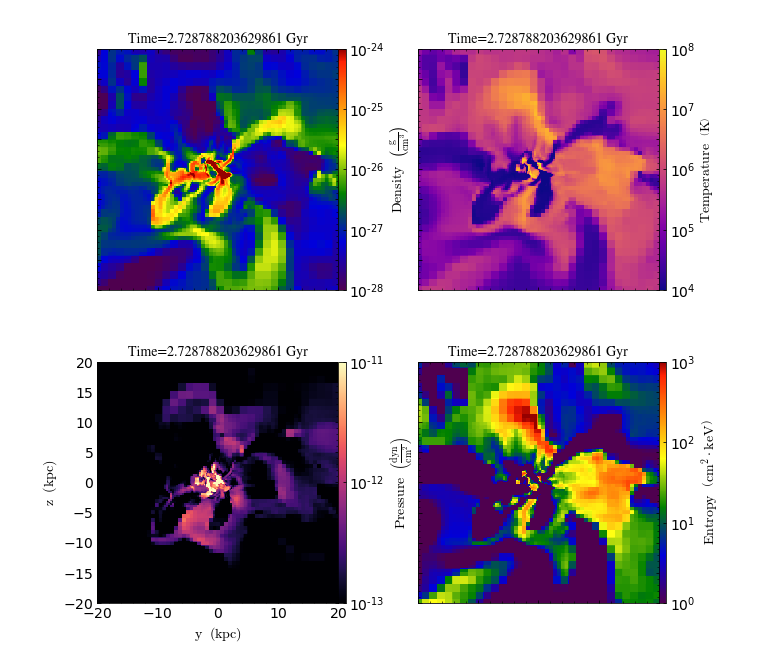
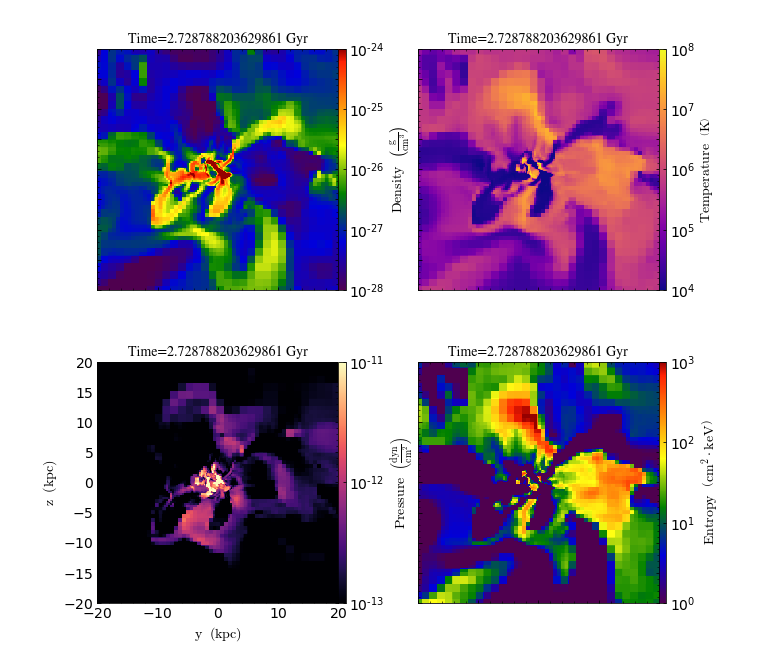
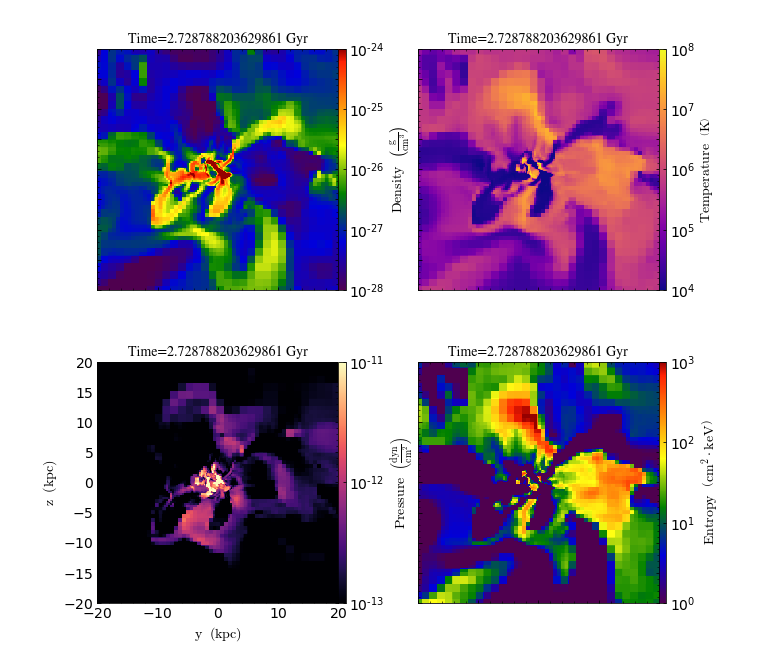

yt : [INFO     ] 2021-10-15 12:10:48,558 Parameters: current_time              = 127.81660281079
yt : [INFO     ] 2021-10-15 12:10:48,561 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 12:10:48,563 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 12:10:48,565 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 12:10:48,568 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 12:10:48,570 Parameters: current_redshift          = 2.4194524839203
yt : [INFO     ] 2021-10-15 12:10:48,571 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 12:10:48,573 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 12:10:48,575 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 12:10:48,577 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3239/3239 [00:00<00:00, 4679.68it/s]
yt : [INFO     ] 2021-10-1

In [ ]:
import yt
import numpy as np
import matplotlib.pyplot as plt
from yt import derived_field
from mpl_toolkits.axes_grid1 import AxesGrid
#import yt.visualization.eps_writer as eps

for n in range(123,140):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological_stellar_Feedback'+fd+ff  
    ds = yt.load(fpath)
    t = ds.current_time.in_units('Gyr')
    fig = plt.figure()
    grid = AxesGrid(fig, (0.075,0.075,0.85,0.85),
                nrows_ncols = (2, 2),
                axes_pad = 1.0,
                label_mode = "1",
                share_all = True,
                cbar_location="right",
                cbar_mode="each",
                cbar_size="3%",
                cbar_pad="0%")
    fields = ['density', 'temperature', 'pressure', 'entropy']
    slc = yt.SlicePlot(ds, 'x',fields,center=['max','Dark_Matter_Density'] ,width=(40,'kpc'))
        
    colorbar = slc.set_cmap(field='density', cmap='bds_highcontrast')
    colorbar = slc.set_cmap(field='temperature', cmap='plasma')
    colorbar = slc.set_cmap(field='pressure', cmap='magma')
    colorbar = slc.set_cmap(field='entropy', cmap='bds_highcontrast')
    slc.set_log('velocity_x', False)
    slc.set_log('velocity_y', False)
    slc.set_zlim('density', 1.0e-28,1.0e-24)
    slc.set_zlim('temperature', 1.0e4,1.0e8)
    slc.set_zlim('pressure', 1.0e-13,1.0e-11)
    slc.set_zlim('entropy', 1.0,1.0e3)
    slc.set_font({'family': 'sans-serif', 'style': 'normal',
                  'weight': 'normal', 'size': 14})
    slc.annotate_title('Time='+str(t))
    for i, field in enumerate(fields):
        plot = slc.plots[field]
        plot.figure = fig
        plot.axes = grid[i].axes
        plot.cax = grid.cbar_axes[i]
    slc._setup_plots()
    #slc._setup_plots();
    #slc.annotate_cell_edges()
    #slc.annotate_grids()
    #slc.plots['density'].figure
    slc.save('/mnt/scratch/deovratd/Cosmological_stellar_Feedback/combined_'+str(fn))
    slc.show()

yt : [INFO     ] 2021-10-18 13:27:34,538 Parameters: current_time              = 123.81653315489
yt : [INFO     ] 2021-10-18 13:27:34,541 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:27:34,543 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:27:34,545 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:27:34,547 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:27:34,549 Parameters: current_redshift          = 2.4941699344802
yt : [INFO     ] 2021-10-18 13:27:34,551 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:27:34,553 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:27:34,555 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:27:34,557 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3225/3225 [00:00<00:00, 3742.96it/s]
yt : [INFO     ] 2021-10-1


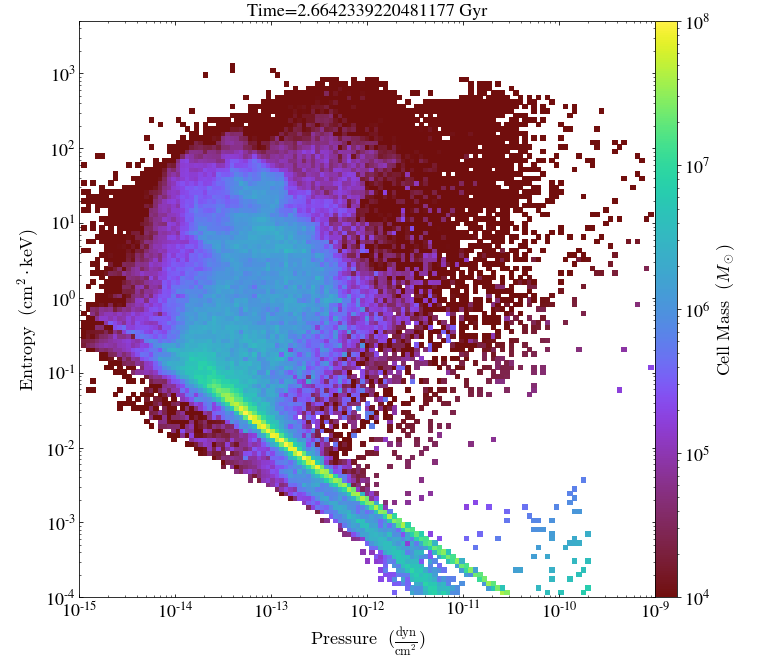

yt : [INFO     ] 2021-10-18 13:29:15,068 Parameters: current_time              = 124.81660281776
yt : [INFO     ] 2021-10-18 13:29:15,070 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:29:15,072 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:29:15,075 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:29:15,077 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:29:15,079 Parameters: current_redshift          = 2.4751240873046
yt : [INFO     ] 2021-10-18 13:29:15,081 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:29:15,082 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:29:15,084 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:29:15,086 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3182/3182 [00:00<00:00, 3634.71it/s]
yt : [INFO     ] 2021-10-1


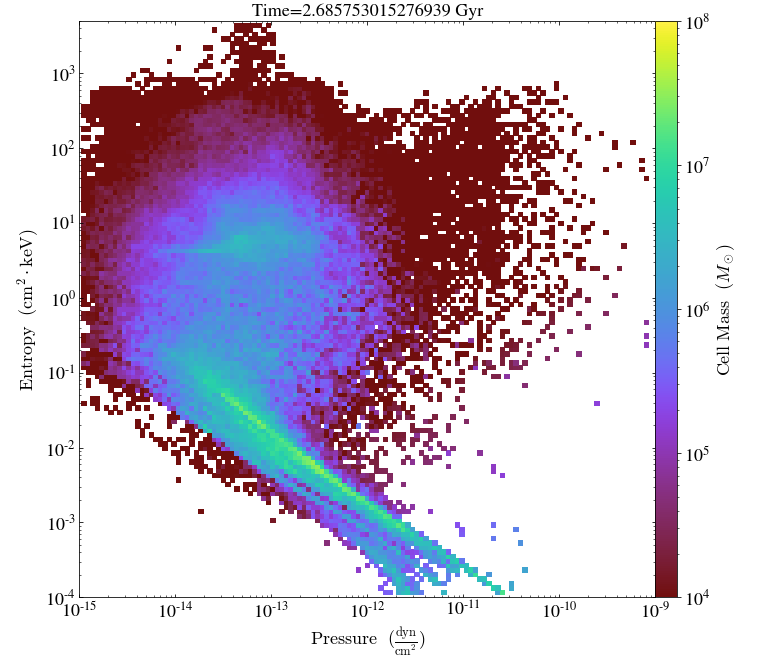

yt : [INFO     ] 2021-10-18 13:30:53,521 Parameters: current_time              = 125.81660281079
yt : [INFO     ] 2021-10-18 13:30:53,550 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:30:53,552 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:30:53,554 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:30:53,557 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:30:53,559 Parameters: current_redshift          = 2.4563222146479
yt : [INFO     ] 2021-10-18 13:30:53,560 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:30:53,562 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:30:53,564 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:30:53,566 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3203/3203 [00:00<00:00, 4326.03it/s]
yt : [INFO     ] 2021-10-1


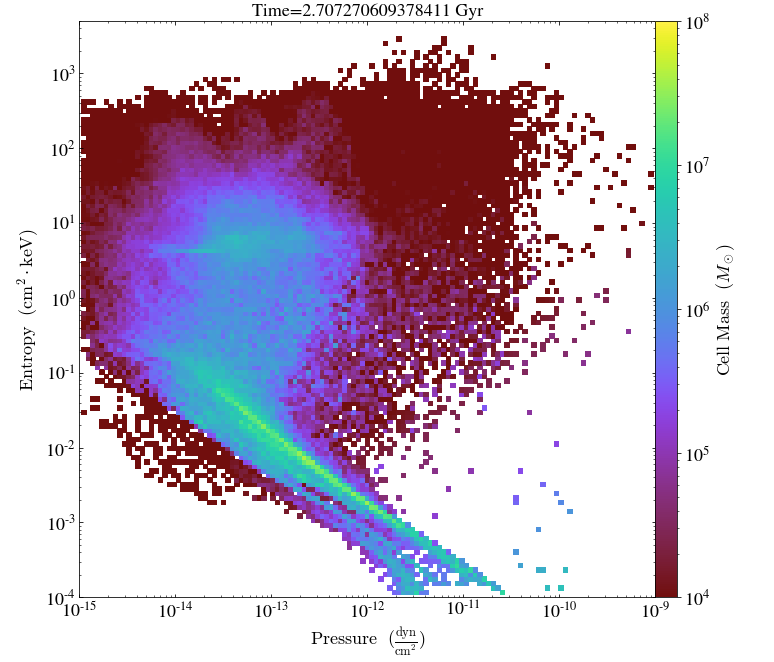

yt : [INFO     ] 2021-10-18 13:32:30,202 Parameters: current_time              = 126.81660281079
yt : [INFO     ] 2021-10-18 13:32:30,204 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:32:30,206 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:32:30,209 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:32:30,211 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:32:30,213 Parameters: current_redshift          = 2.437767092246
yt : [INFO     ] 2021-10-18 13:32:30,215 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:32:30,217 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:32:30,218 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:32:30,220 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3243/3243 [00:00<00:00, 4533.28it/s]
yt : [INFO     ] 2021-10-18


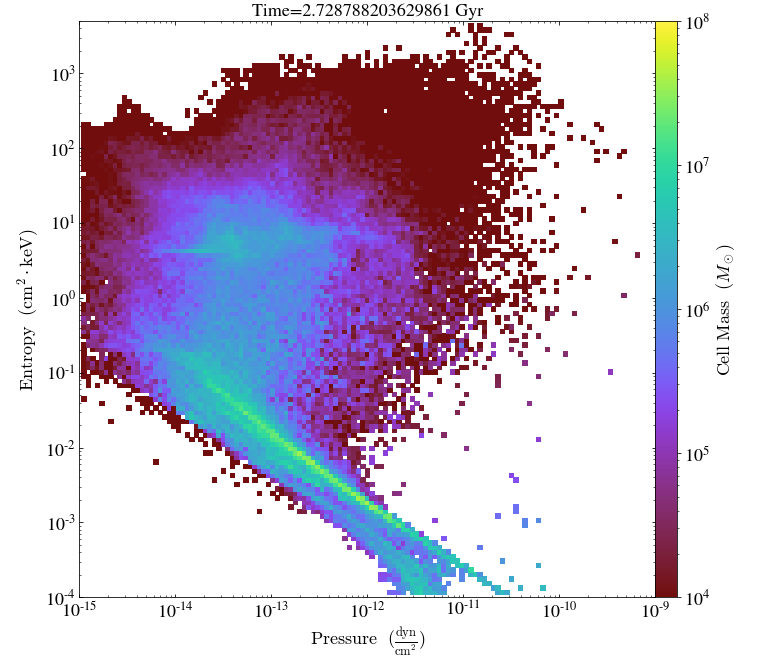

yt : [INFO     ] 2021-10-18 13:34:07,531 Parameters: current_time              = 127.81660281079
yt : [INFO     ] 2021-10-18 13:34:07,533 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:34:07,535 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:34:07,538 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:34:07,540 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:34:07,542 Parameters: current_redshift          = 2.4194524839203
yt : [INFO     ] 2021-10-18 13:34:07,544 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:34:07,546 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:34:07,548 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:34:07,549 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3236/3236 [00:01<00:00, 2965.19it/s]
yt : [INFO     ] 2021-10-1


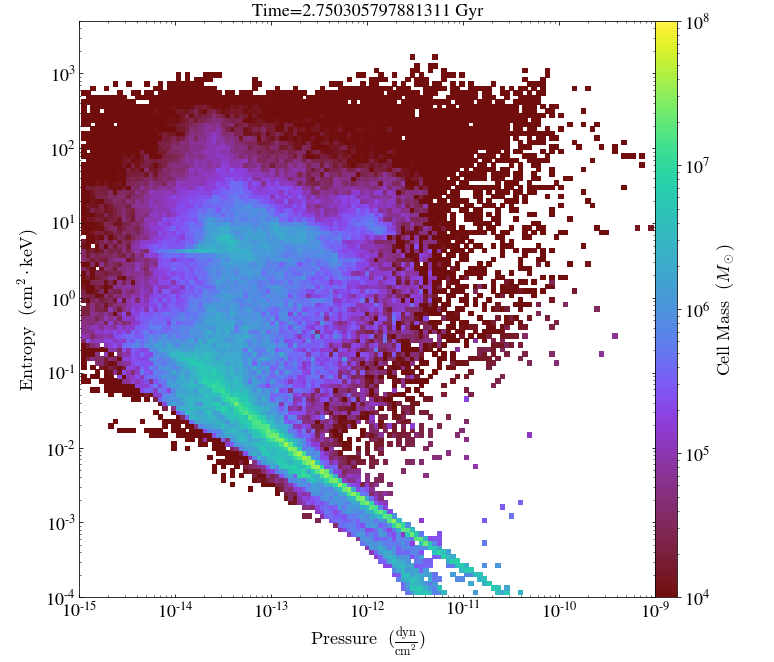

yt : [INFO     ] 2021-10-18 13:35:33,136 Parameters: current_time              = 128.81660281079
yt : [INFO     ] 2021-10-18 13:35:33,139 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:35:33,141 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:35:33,143 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:35:33,145 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:35:33,147 Parameters: current_redshift          = 2.4013661135391
yt : [INFO     ] 2021-10-18 13:35:33,149 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:35:33,151 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:35:33,153 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:35:33,155 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3205/3205 [00:00<00:00, 3779.94it/s]
yt : [INFO     ] 2021-10-1


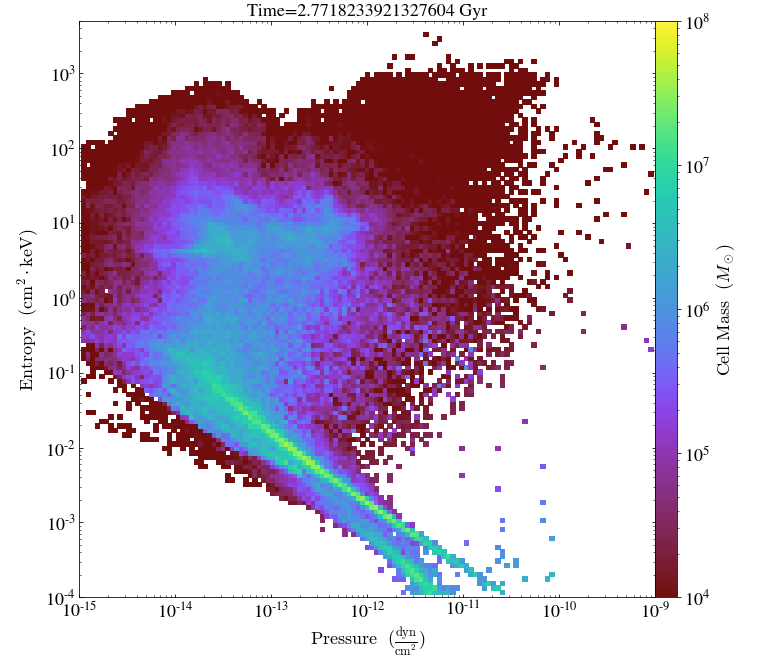

yt : [INFO     ] 2021-10-18 13:37:02,418 Parameters: current_time              = 129.81660281079
yt : [INFO     ] 2021-10-18 13:37:02,420 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:37:02,435 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:37:02,438 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:37:02,440 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:37:02,442 Parameters: current_redshift          = 2.3835141637171
yt : [INFO     ] 2021-10-18 13:37:02,444 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:37:02,446 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:37:02,448 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:37:02,450 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3248/3248 [00:01<00:00, 3209.56it/s]
yt : [INFO     ] 2021-10-1


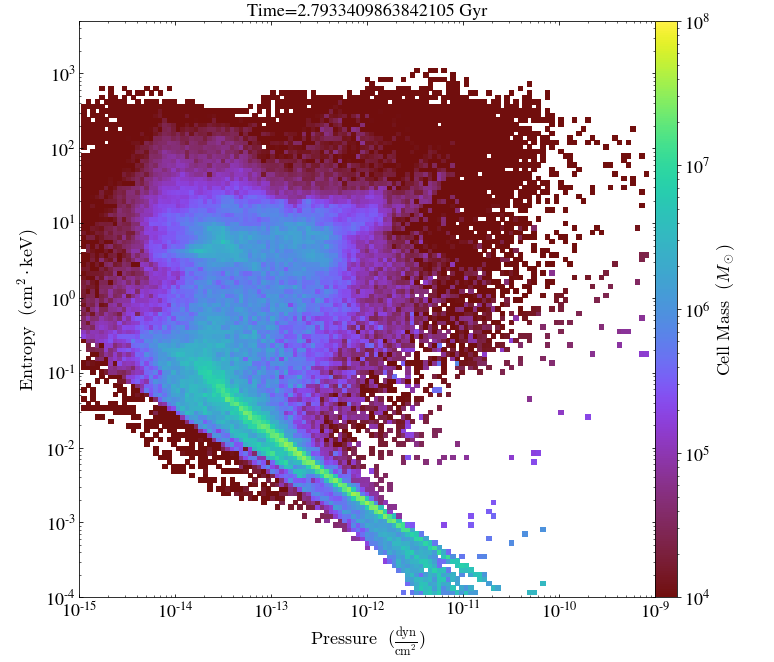

yt : [INFO     ] 2021-10-18 13:38:31,919 Parameters: current_time              = 130.81660281079
yt : [INFO     ] 2021-10-18 13:38:31,921 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:38:31,923 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:38:31,925 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:38:31,940 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:38:31,942 Parameters: current_redshift          = 2.365882535888
yt : [INFO     ] 2021-10-18 13:38:31,944 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:38:31,946 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:38:31,948 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:38:31,950 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3215/3215 [00:01<00:00, 2901.12it/s]
yt : [INFO     ] 2021-10-18


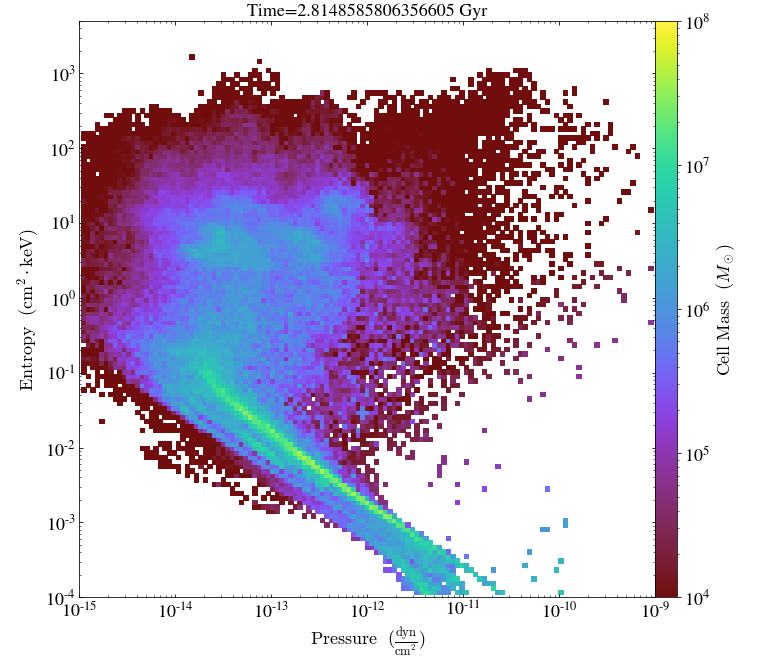

yt : [INFO     ] 2021-10-18 13:40:01,124 Parameters: current_time              = 131.81660281079
yt : [INFO     ] 2021-10-18 13:40:01,127 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:40:01,129 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:40:01,131 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:40:01,133 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:40:01,135 Parameters: current_redshift          = 2.3484706211048
yt : [INFO     ] 2021-10-18 13:40:01,137 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:40:01,139 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:40:01,141 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:40:01,143 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3221/3221 [00:01<00:00, 3144.45it/s]
yt : [INFO     ] 2021-10-1


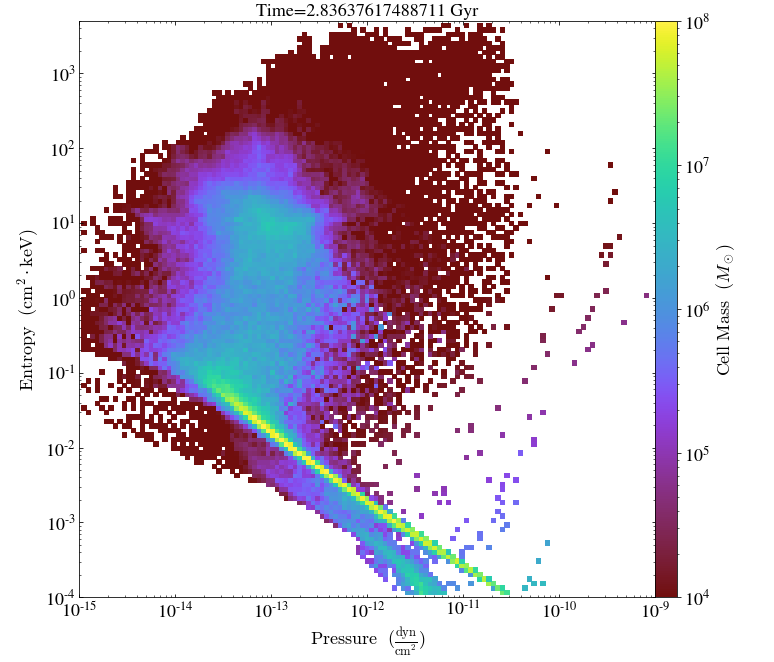

yt : [INFO     ] 2021-10-18 13:41:42,127 Parameters: current_time              = 132.81660281079
yt : [INFO     ] 2021-10-18 13:41:42,129 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:41:42,131 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:41:42,133 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:41:42,136 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:41:42,138 Parameters: current_redshift          = 2.3312793559092
yt : [INFO     ] 2021-10-18 13:41:42,139 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:41:42,150 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:41:42,153 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:41:42,154 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3290/3290 [00:01<00:00, 3242.87it/s]
yt : [INFO     ] 2021-10-1


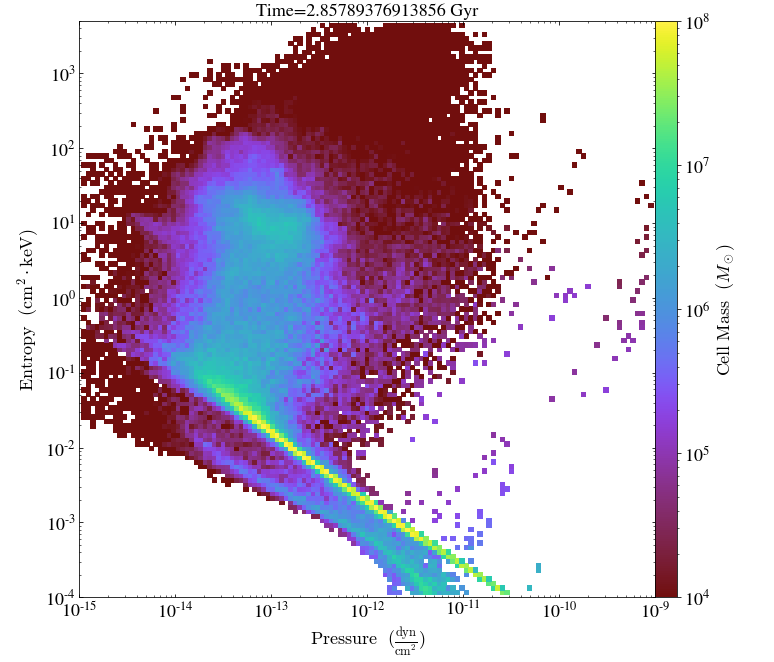

yt : [INFO     ] 2021-10-18 13:43:35,821 Parameters: current_time              = 133.81660281079
yt : [INFO     ] 2021-10-18 13:43:35,824 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:43:35,826 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:43:35,828 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:43:35,830 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:43:35,832 Parameters: current_redshift          = 2.3142901370438
yt : [INFO     ] 2021-10-18 13:43:35,834 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:43:35,836 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:43:35,838 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:43:35,840 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3234/3234 [00:01<00:00, 3172.94it/s]
yt : [INFO     ] 2021-10-1


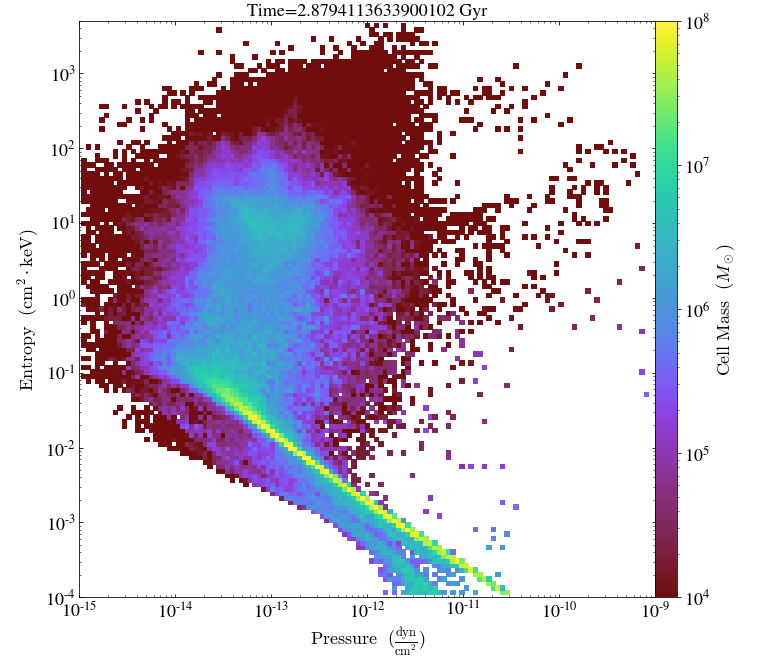

yt : [INFO     ] 2021-10-18 13:45:13,960 Parameters: current_time              = 134.81660281079
yt : [INFO     ] 2021-10-18 13:45:13,962 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:45:13,964 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:45:13,990 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:45:13,992 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:45:13,994 Parameters: current_redshift          = 2.2975125031782
yt : [INFO     ] 2021-10-18 13:45:13,996 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:45:13,998 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:45:14,000 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:45:14,002 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3268/3268 [00:00<00:00, 3298.95it/s]
yt : [INFO     ] 2021-10-1


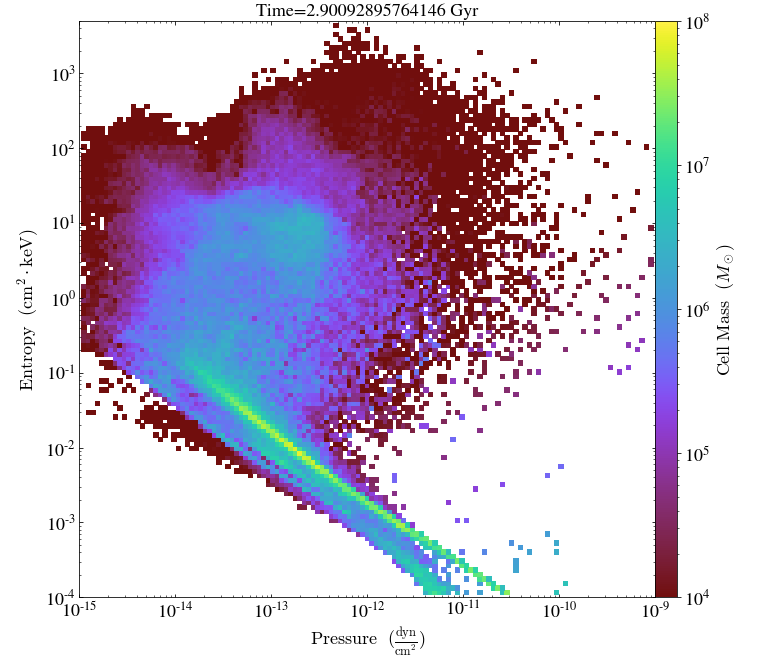

yt : [INFO     ] 2021-10-18 13:46:50,044 Parameters: current_time              = 135.81660281079
yt : [INFO     ] 2021-10-18 13:46:50,046 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:46:50,048 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:46:50,050 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:46:50,053 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:46:50,055 Parameters: current_redshift          = 2.2809393066147
yt : [INFO     ] 2021-10-18 13:46:50,056 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:46:50,058 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:46:50,060 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:46:50,062 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3283/3283 [00:00<00:00, 3429.51it/s]
yt : [INFO     ] 2021-10-1


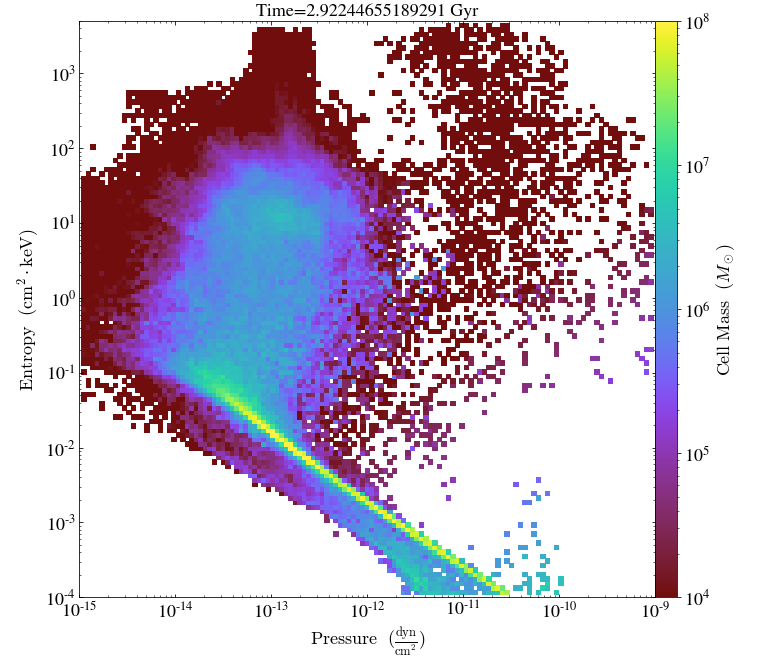

yt : [INFO     ] 2021-10-18 13:48:36,150 Parameters: current_time              = 136.81660281079
yt : [INFO     ] 2021-10-18 13:48:36,153 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:48:36,158 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:48:36,160 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:48:36,175 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:48:36,179 Parameters: current_redshift          = 2.2645587797422
yt : [INFO     ] 2021-10-18 13:48:36,181 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:48:36,183 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:48:36,185 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:48:36,186 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3279/3279 [00:00<00:00, 3505.36it/s]
yt : [INFO     ] 2021-10-1


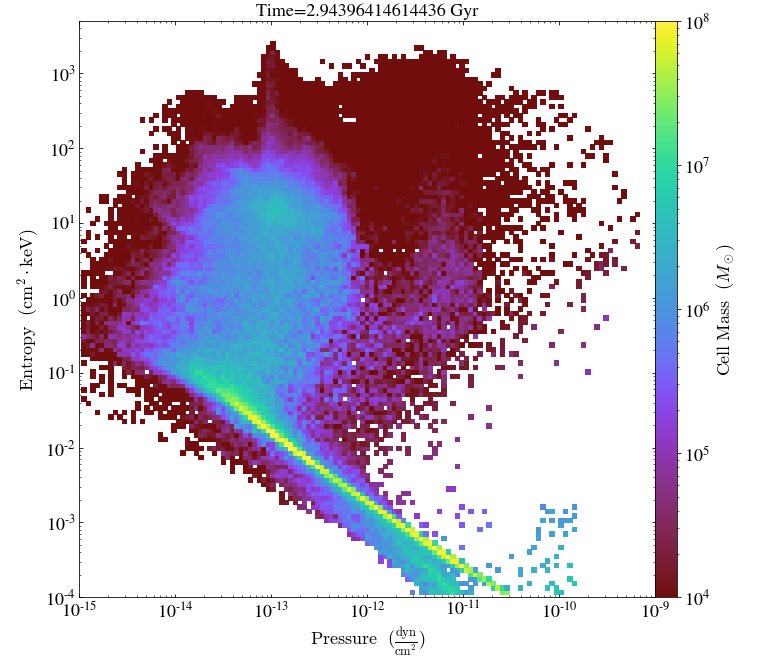

yt : [INFO     ] 2021-10-18 13:50:37,591 Parameters: current_time              = 137.81651287898
yt : [INFO     ] 2021-10-18 13:50:37,594 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:50:37,596 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:50:37,598 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:50:37,600 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:50:37,602 Parameters: current_redshift          = 2.2483798821333
yt : [INFO     ] 2021-10-18 13:50:37,604 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:50:37,606 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:50:37,608 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:50:37,610 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3320/3320 [00:01<00:00, 2533.94it/s]
yt : [INFO     ] 2021-10-1


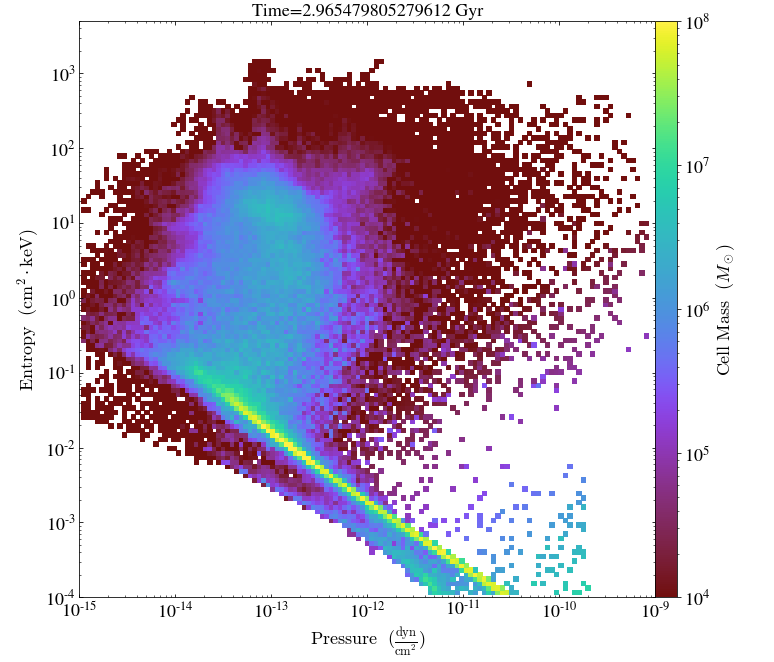

yt : [INFO     ] 2021-10-18 13:52:36,528 Parameters: current_time              = 138.81660281978
yt : [INFO     ] 2021-10-18 13:52:36,542 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:52:36,544 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:52:36,547 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:52:36,549 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:52:36,551 Parameters: current_redshift          = 2.2323874903534
yt : [INFO     ] 2021-10-18 13:52:36,553 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:52:36,554 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:52:36,556 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:52:36,558 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3279/3279 [00:00<00:00, 4467.19it/s]
yt : [INFO     ] 2021-10-1


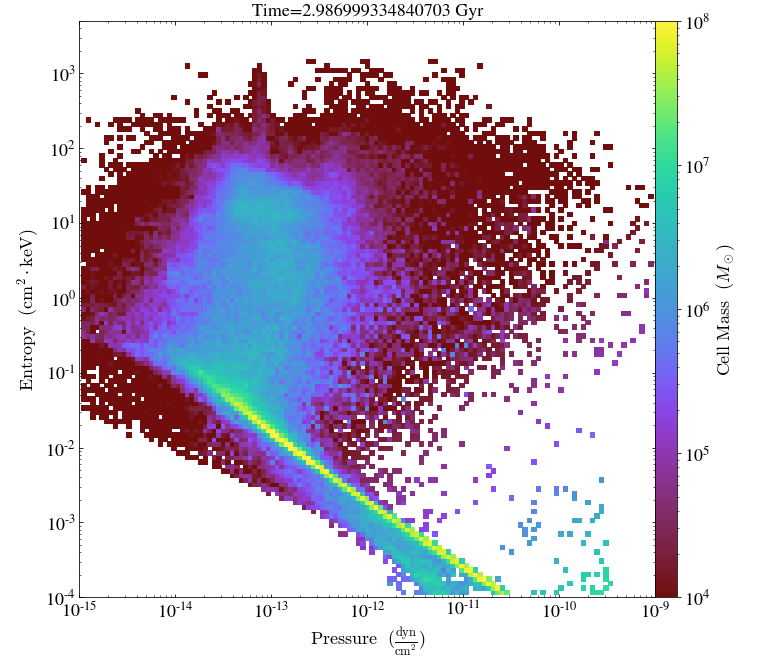

yt : [INFO     ] 2021-10-18 13:54:38,258 Parameters: current_time              = 139.81660281079
yt : [INFO     ] 2021-10-18 13:54:38,260 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:54:38,262 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:54:38,264 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:54:38,267 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:54:38,268 Parameters: current_redshift          = 2.2165811964659
yt : [INFO     ] 2021-10-18 13:54:38,270 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:54:38,272 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:54:38,274 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:54:38,276 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3286/3286 [00:00<00:00, 3515.11it/s]
yt : [INFO     ] 2021-10-1


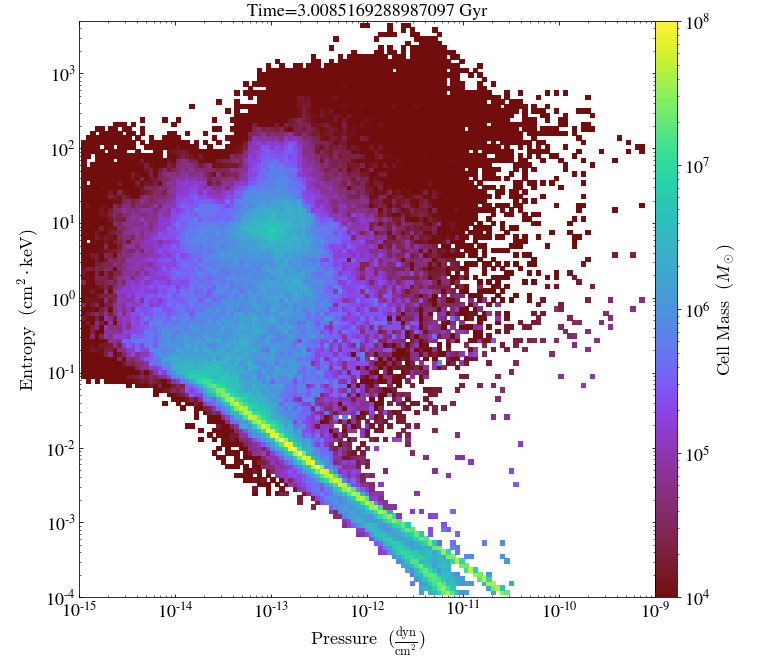

yt : [INFO     ] 2021-10-18 13:56:23,913 Parameters: current_time              = 140.81660281079
yt : [INFO     ] 2021-10-18 13:56:23,916 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:56:23,918 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:56:23,920 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:56:23,922 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:56:23,924 Parameters: current_redshift          = 2.2009640197103
yt : [INFO     ] 2021-10-18 13:56:23,926 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:56:23,928 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:56:23,930 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:56:23,932 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3230/3230 [00:01<00:00, 2848.06it/s]
yt : [INFO     ] 2021-10-1


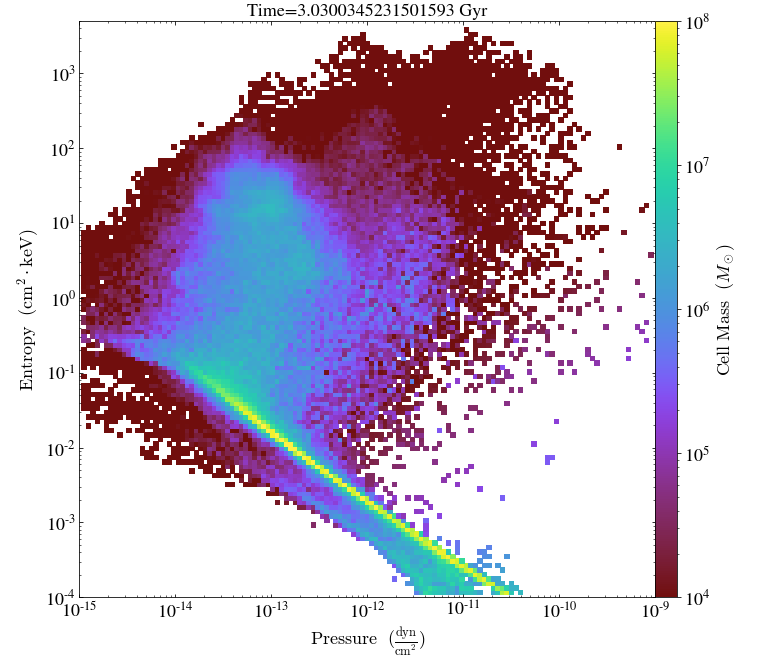

yt : [INFO     ] 2021-10-18 13:57:57,476 Parameters: current_time              = 141.81660281079
yt : [INFO     ] 2021-10-18 13:57:57,478 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:57:57,480 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:57:57,482 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:57:57,485 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:57:57,486 Parameters: current_redshift          = 2.1855228877262
yt : [INFO     ] 2021-10-18 13:57:57,489 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:57:57,491 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:57:57,493 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:57:57,495 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3221/3221 [00:01<00:00, 3094.78it/s]
yt : [INFO     ] 2021-10-1


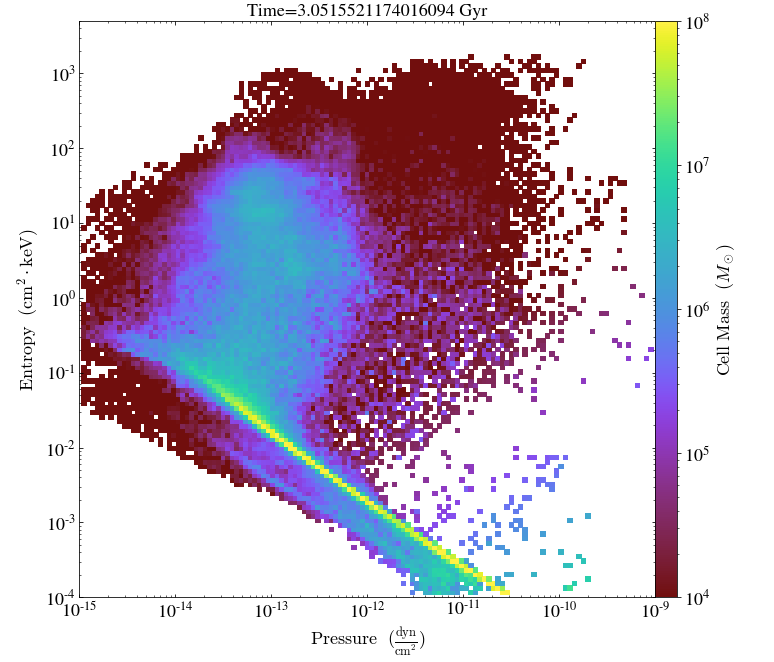

yt : [INFO     ] 2021-10-18 13:59:29,792 Parameters: current_time              = 142.81660281079
yt : [INFO     ] 2021-10-18 13:59:29,794 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 13:59:29,813 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 13:59:29,816 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 13:59:29,818 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 13:59:29,820 Parameters: current_redshift          = 2.1702584538354
yt : [INFO     ] 2021-10-18 13:59:29,822 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 13:59:29,824 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 13:59:29,825 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 13:59:29,827 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3250/3250 [00:01<00:00, 2451.31it/s]
yt : [INFO     ] 2021-10-1


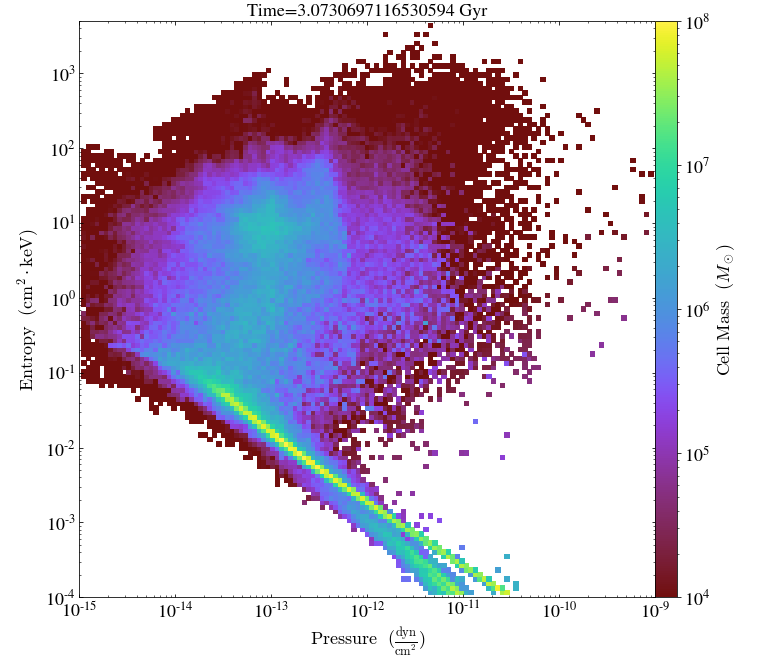

yt : [INFO     ] 2021-10-18 14:01:10,710 Parameters: current_time              = 143.81660281079
yt : [INFO     ] 2021-10-18 14:01:10,725 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:01:10,727 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:01:10,729 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:01:10,732 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:01:10,734 Parameters: current_redshift          = 2.1551729106547
yt : [INFO     ] 2021-10-18 14:01:10,735 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:01:10,737 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:01:10,739 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:01:10,741 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3319/3319 [00:01<00:00, 3029.26it/s]
yt : [INFO     ] 2021-10-1


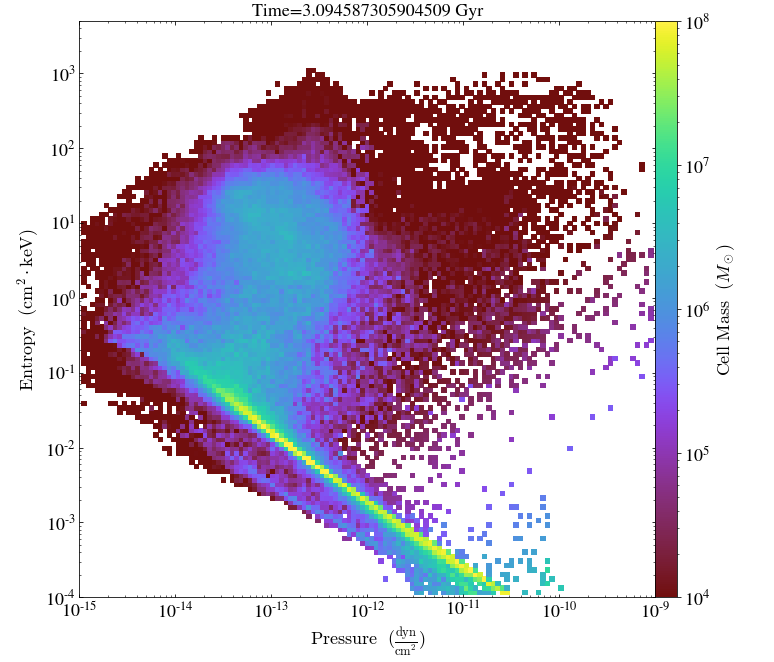

yt : [INFO     ] 2021-10-18 14:02:50,712 Parameters: current_time              = 144.81660281079
yt : [INFO     ] 2021-10-18 14:02:50,715 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:02:50,717 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:02:50,719 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:02:50,721 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:02:50,723 Parameters: current_redshift          = 2.1402516772525
yt : [INFO     ] 2021-10-18 14:02:50,725 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:02:50,727 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:02:50,729 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:02:50,731 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3344/3344 [00:00<00:00, 3420.57it/s]
yt : [INFO     ] 2021-10-1


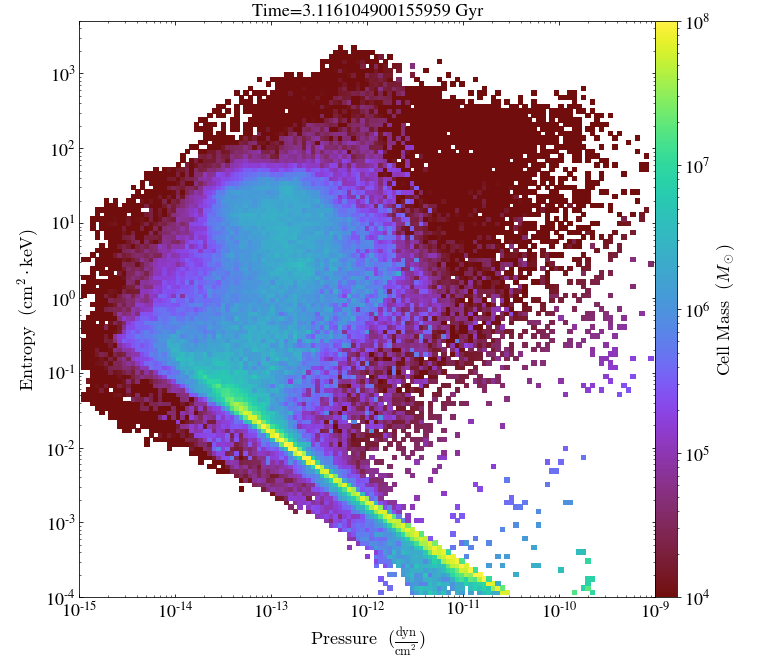

yt : [INFO     ] 2021-10-18 14:04:23,758 Parameters: current_time              = 145.81660281079
yt : [INFO     ] 2021-10-18 14:04:23,761 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:04:23,764 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:04:23,767 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:04:23,769 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:04:23,771 Parameters: current_redshift          = 2.1254991528018
yt : [INFO     ] 2021-10-18 14:04:23,773 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:04:23,775 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:04:23,790 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:04:23,792 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3273/3273 [00:01<00:00, 1987.01it/s]
yt : [INFO     ] 2021-10-1


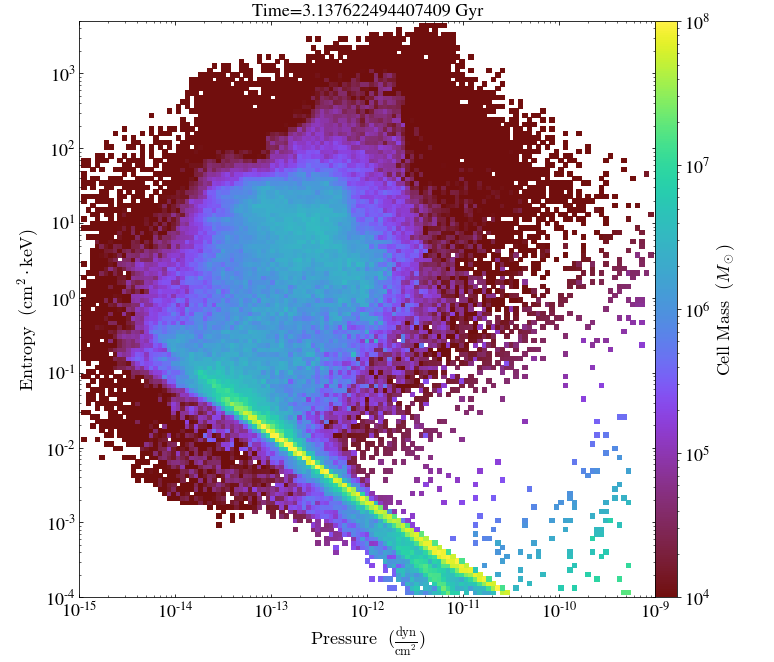

yt : [INFO     ] 2021-10-18 14:06:10,164 Parameters: current_time              = 146.81660281079
yt : [INFO     ] 2021-10-18 14:06:10,167 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:06:10,195 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:06:10,197 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:06:10,199 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:06:10,201 Parameters: current_redshift          = 2.1109160526139
yt : [INFO     ] 2021-10-18 14:06:10,203 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:06:10,205 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:06:10,207 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:06:10,209 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3255/3255 [00:01<00:00, 2344.60it/s]
yt : [INFO     ] 2021-10-1


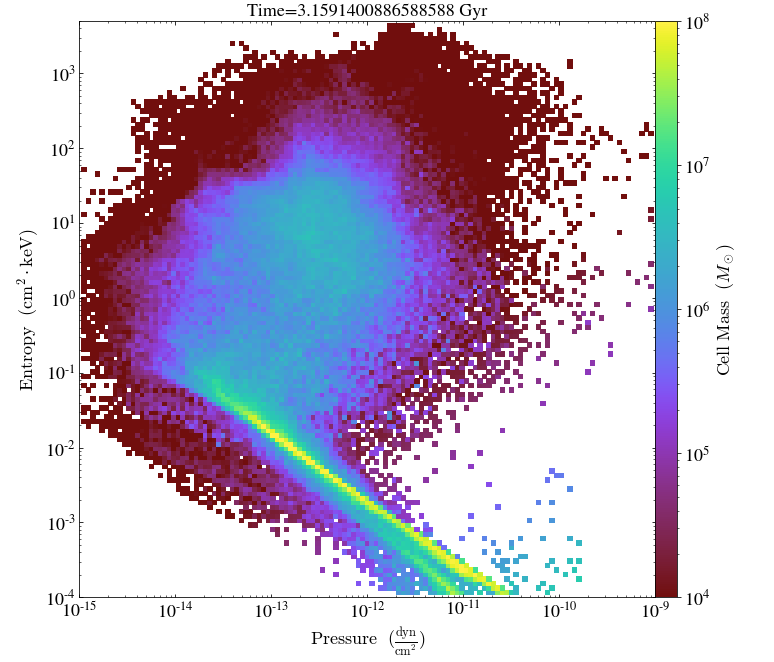

yt : [INFO     ] 2021-10-18 14:08:08,850 Parameters: current_time              = 147.81660281079
yt : [INFO     ] 2021-10-18 14:08:08,867 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:08:08,869 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:08:08,871 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:08:08,874 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:08:08,876 Parameters: current_redshift          = 2.0964870918747
yt : [INFO     ] 2021-10-18 14:08:08,877 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:08:08,879 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:08:08,881 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:08:08,883 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3363/3363 [00:01<00:00, 2311.04it/s]
yt : [INFO     ] 2021-10-1


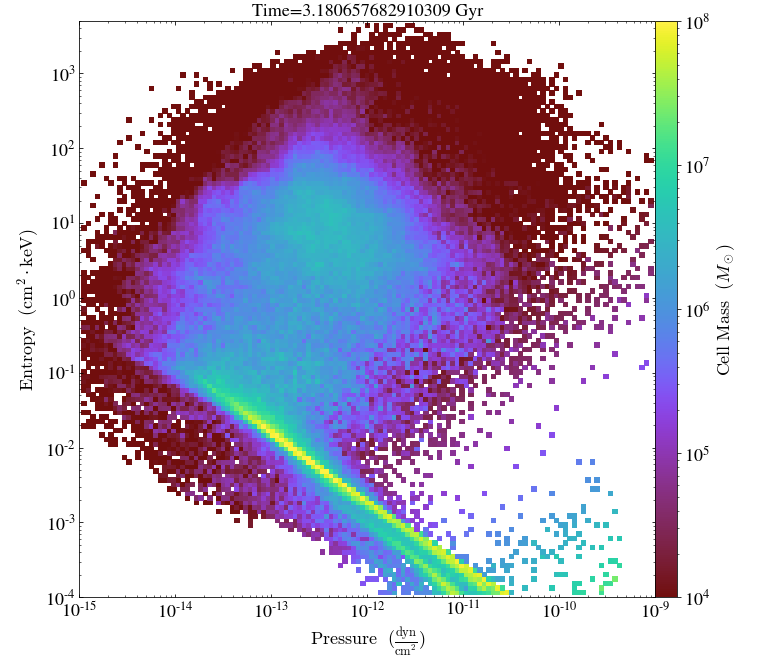

yt : [INFO     ] 2021-10-18 14:10:09,911 Parameters: current_time              = 148.81660281079
yt : [INFO     ] 2021-10-18 14:10:09,913 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:10:09,916 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:10:09,918 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:10:09,920 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:10:09,922 Parameters: current_redshift          = 2.0822187207024
yt : [INFO     ] 2021-10-18 14:10:09,924 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:10:09,926 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:10:09,928 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:10:09,930 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3356/3356 [00:01<00:00, 2672.28it/s]
yt : [INFO     ] 2021-10-1


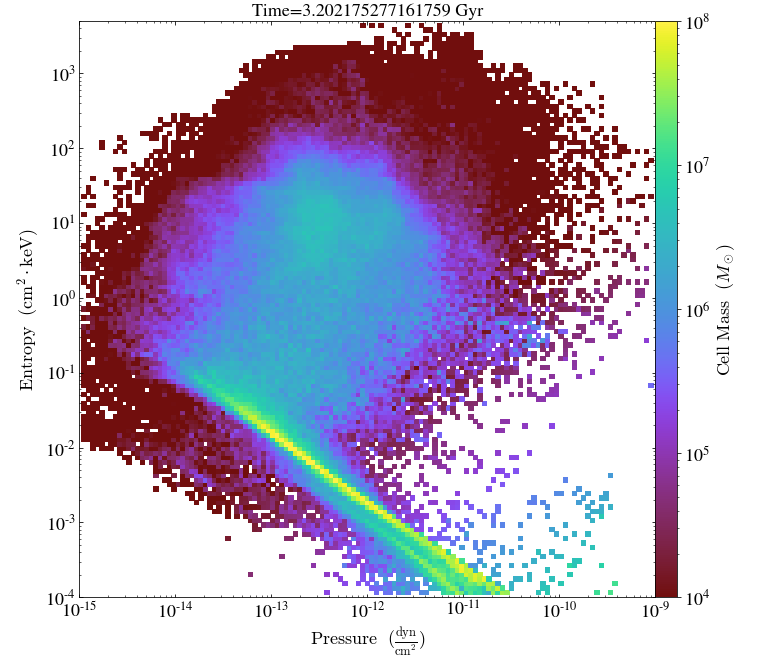

yt : [INFO     ] 2021-10-18 14:12:12,245 Parameters: current_time              = 149.81660281079
yt : [INFO     ] 2021-10-18 14:12:12,247 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:12:12,249 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:12:12,252 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:12:12,254 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:12:12,256 Parameters: current_redshift          = 2.0681109972786
yt : [INFO     ] 2021-10-18 14:12:12,258 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:12:12,260 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:12:12,262 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:12:12,264 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3325/3325 [00:01<00:00, 3187.34it/s]
yt : [INFO     ] 2021-10-1


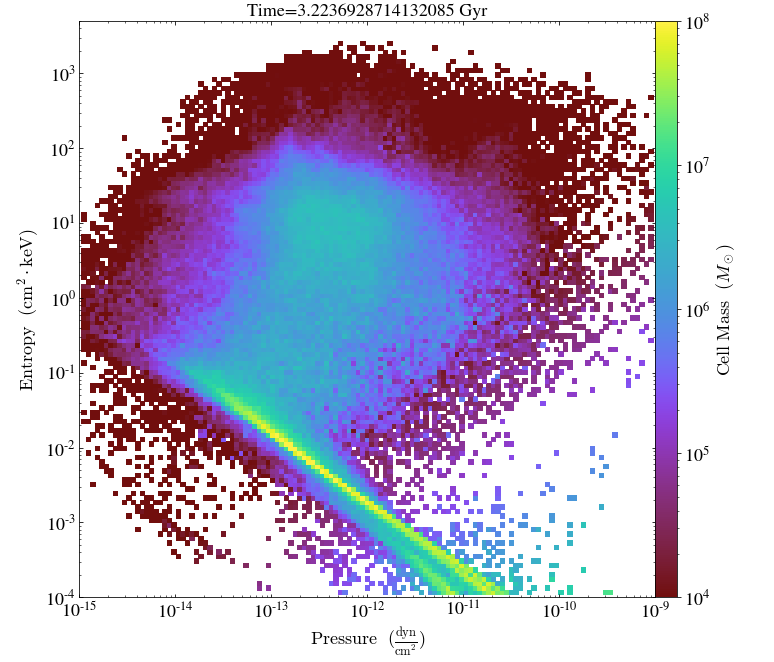

yt : [INFO     ] 2021-10-18 14:14:20,960 Parameters: current_time              = 150.81660281079
yt : [INFO     ] 2021-10-18 14:14:20,979 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:14:20,980 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:14:20,981 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:14:20,982 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:14:20,982 Parameters: current_redshift          = 2.0541487646327
yt : [INFO     ] 2021-10-18 14:14:20,983 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:14:20,984 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:14:20,984 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:14:20,985 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3376/3376 [00:02<00:00, 1147.35it/s]
yt : [INFO     ] 2021-10-1


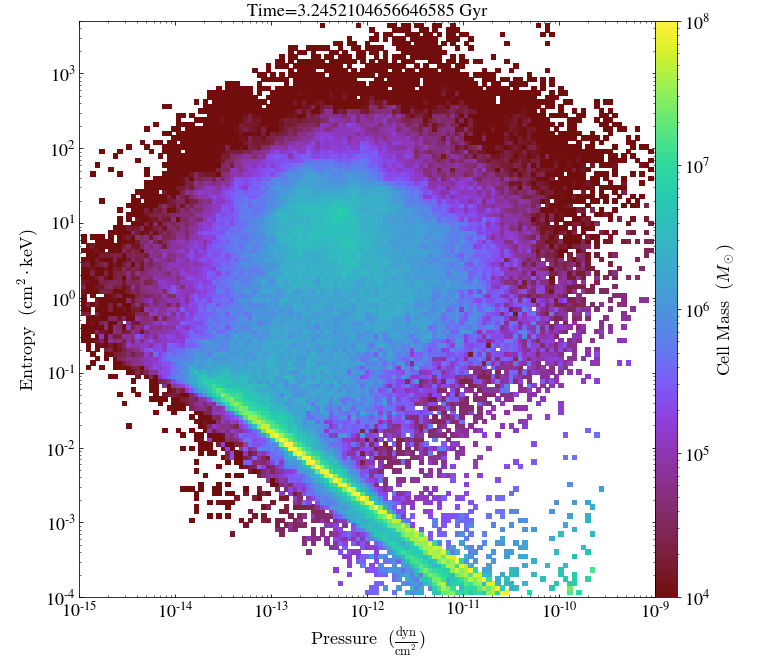

yt : [INFO     ] 2021-10-18 14:16:30,316 Parameters: current_time              = 151.81660281079
yt : [INFO     ] 2021-10-18 14:16:30,318 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:16:30,320 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:16:30,323 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:16:30,343 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:16:30,345 Parameters: current_redshift          = 2.0403387830303
yt : [INFO     ] 2021-10-18 14:16:30,347 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:16:30,349 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:16:30,363 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:16:30,365 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3333/3333 [00:01<00:00, 3006.70it/s]
yt : [INFO     ] 2021-10-1


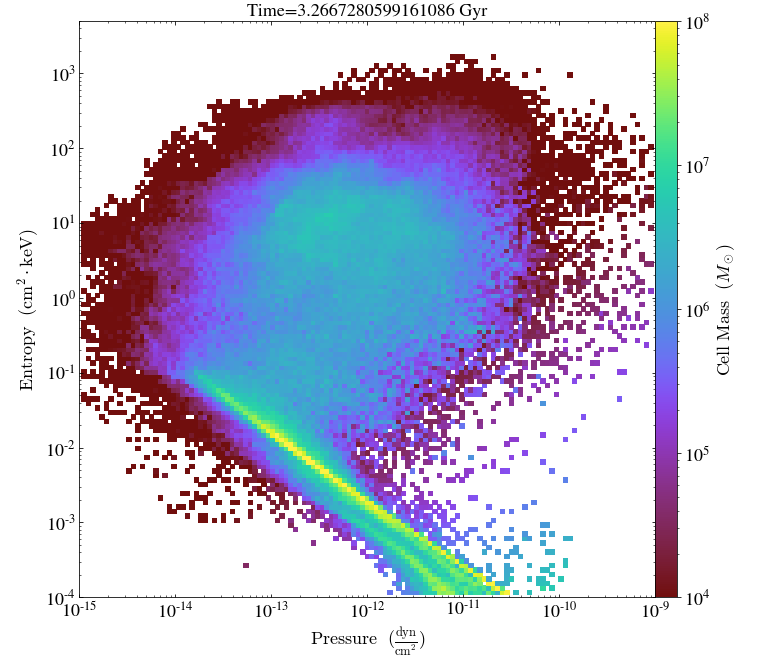

yt : [INFO     ] 2021-10-18 14:18:31,119 Parameters: current_time              = 152.81660281079
yt : [INFO     ] 2021-10-18 14:18:31,121 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:18:31,124 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:18:31,126 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:18:31,128 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:18:31,130 Parameters: current_redshift          = 2.0266813001388
yt : [INFO     ] 2021-10-18 14:18:31,132 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:18:31,134 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:18:31,136 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:18:31,159 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3263/3263 [00:01<00:00, 2384.83it/s]
yt : [INFO     ] 2021-10-1


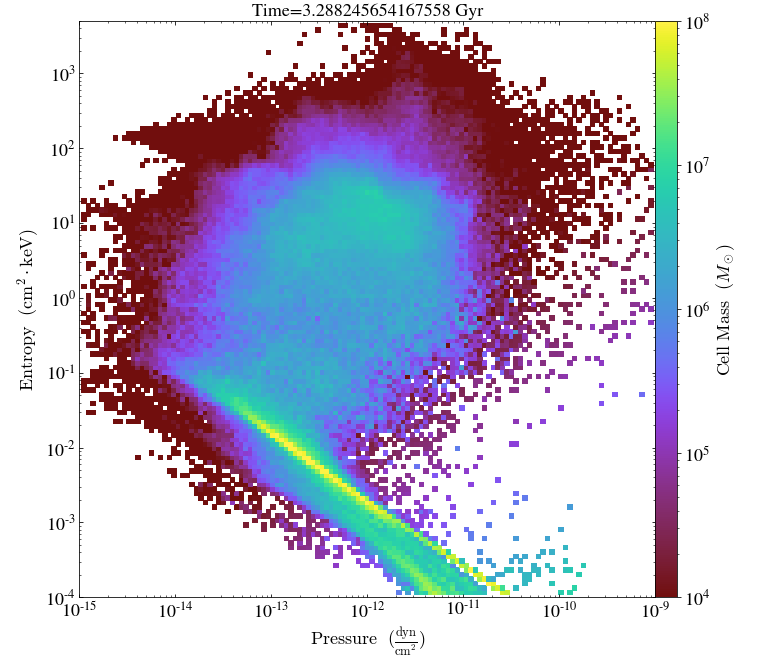

yt : [INFO     ] 2021-10-18 14:20:12,185 Parameters: current_time              = 153.81660281079
yt : [INFO     ] 2021-10-18 14:20:12,195 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:20:12,197 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:20:12,211 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:20:12,214 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:20:12,216 Parameters: current_redshift          = 2.0131621478425
yt : [INFO     ] 2021-10-18 14:20:12,218 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:20:12,220 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:20:12,222 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:20:12,224 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3416/3416 [00:01<00:00, 2208.46it/s]
yt : [INFO     ] 2021-10-1


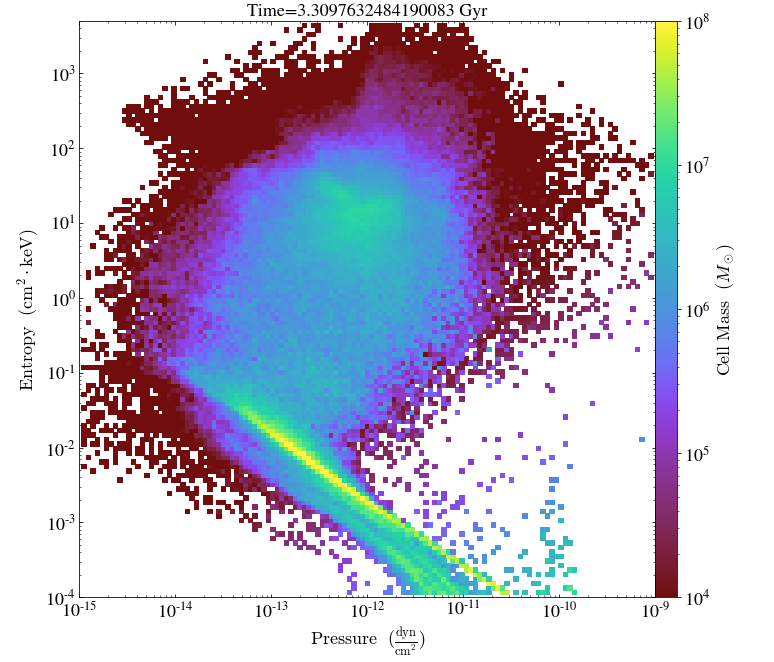

yt : [INFO     ] 2021-10-18 14:22:47,118 Parameters: current_time              = 154.81650440497
yt : [INFO     ] 2021-10-18 14:22:47,120 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:22:47,123 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:22:47,128 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:22:47,130 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:22:47,132 Parameters: current_redshift          = 1.999787913644
yt : [INFO     ] 2021-10-18 14:22:47,134 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:22:47,136 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:22:47,138 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:22:47,140 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3387/3387 [00:01<00:00, 2873.71it/s]
yt : [INFO     ] 2021-10-18


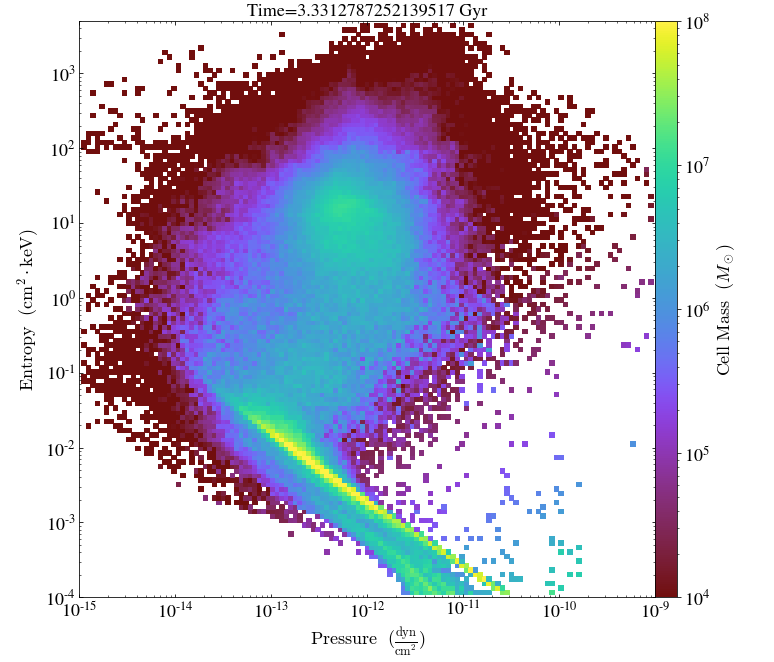

yt : [INFO     ] 2021-10-18 14:24:52,042 Parameters: current_time              = 155.81660282063
yt : [INFO     ] 2021-10-18 14:24:52,044 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:24:52,046 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:24:52,048 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:24:52,051 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:24:52,053 Parameters: current_redshift          = 1.9865559826355
yt : [INFO     ] 2021-10-18 14:24:52,054 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:24:52,056 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:24:52,058 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:24:52,060 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3410/3410 [00:00<00:00, 3805.31it/s]
yt : [INFO     ] 2021-10-1


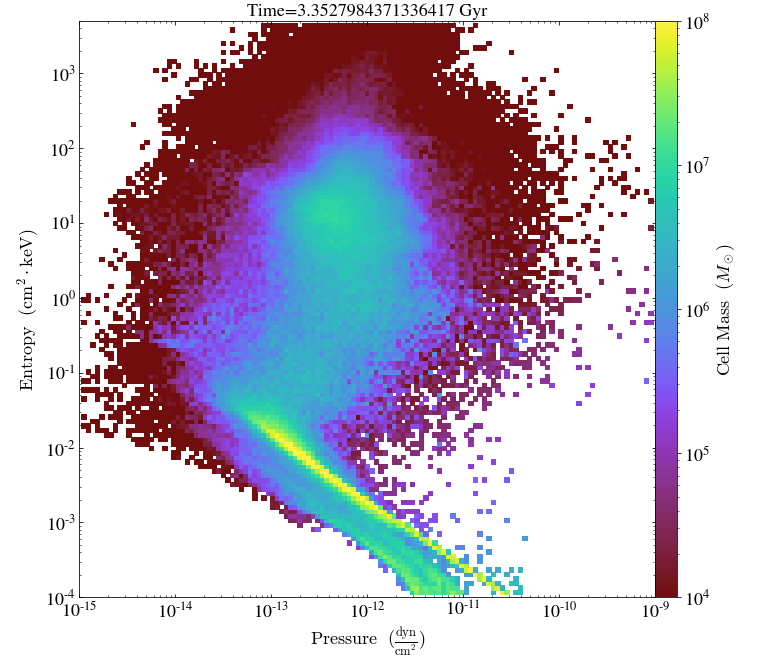

yt : [INFO     ] 2021-10-18 14:26:59,033 Parameters: current_time              = 156.81660281079
yt : [INFO     ] 2021-10-18 14:26:59,036 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:26:59,038 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:26:59,040 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:26:59,042 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:26:59,044 Parameters: current_redshift          = 1.9734579954793
yt : [INFO     ] 2021-10-18 14:26:59,046 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:26:59,048 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:26:59,050 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:26:59,052 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3381/3381 [00:00<00:00, 3841.60it/s]
yt : [INFO     ] 2021-10-1


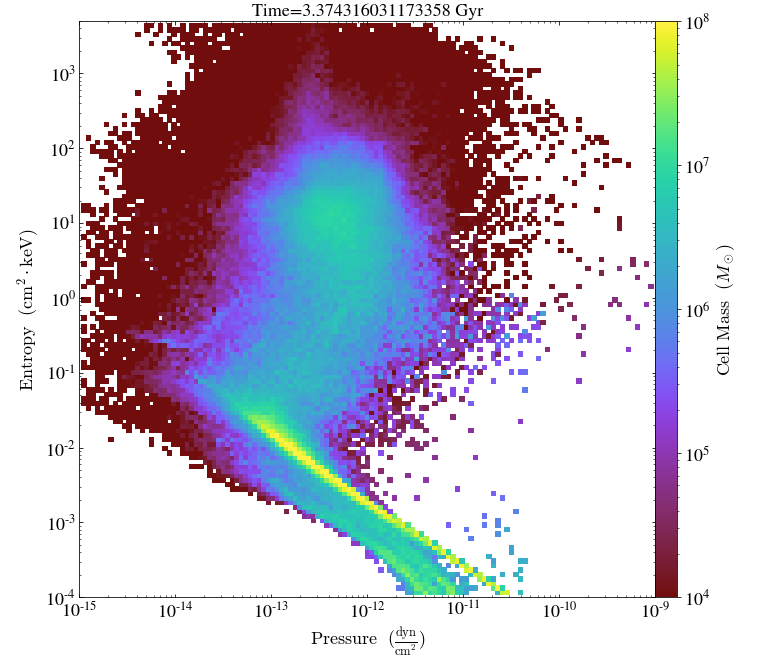

yt : [INFO     ] 2021-10-18 14:29:39,721 Parameters: current_time              = 157.81660281079
yt : [INFO     ] 2021-10-18 14:29:39,723 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:29:39,725 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:29:39,727 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:29:39,730 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:29:39,732 Parameters: current_redshift          = 1.9604945911687
yt : [INFO     ] 2021-10-18 14:29:39,733 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:29:39,735 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:29:39,737 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:29:39,739 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3373/3373 [00:02<00:00, 1312.69it/s]
yt : [INFO     ] 2021-10-1


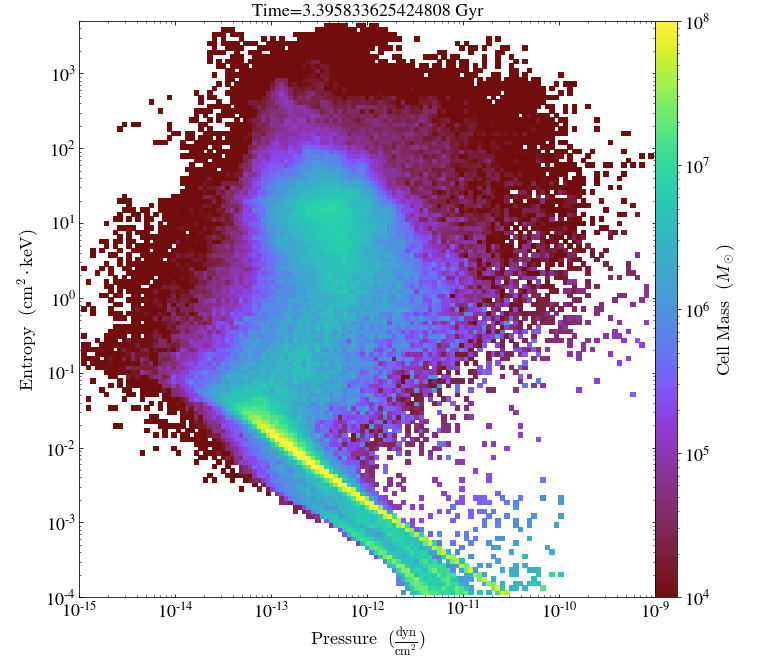

yt : [INFO     ] 2021-10-18 14:32:28,912 Parameters: current_time              = 158.81660281079
yt : [INFO     ] 2021-10-18 14:32:28,915 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:32:28,917 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:32:28,920 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:32:28,935 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:32:28,937 Parameters: current_redshift          = 1.9476690529888
yt : [INFO     ] 2021-10-18 14:32:28,939 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:32:28,945 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:32:28,947 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:32:28,949 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3369/3369 [00:01<00:00, 3194.69it/s]
yt : [INFO     ] 2021-10-1


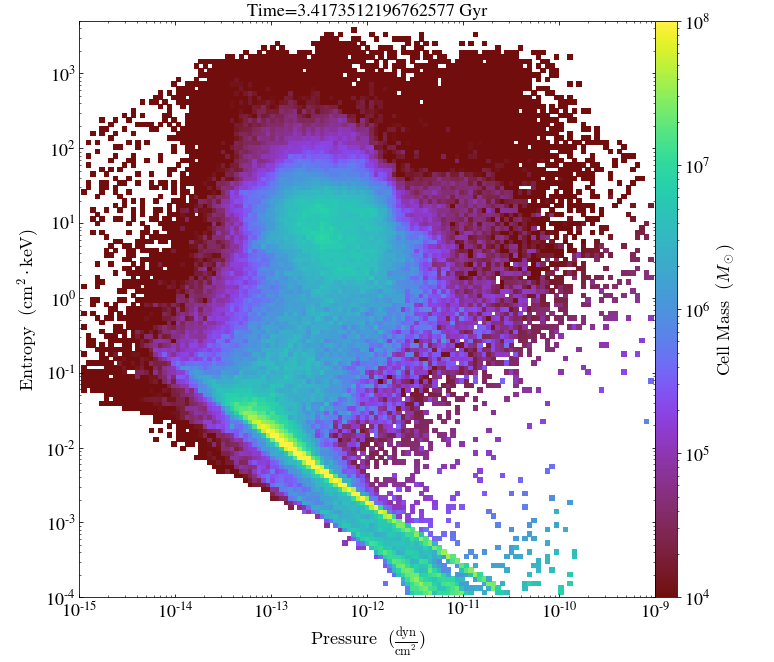

yt : [INFO     ] 2021-10-18 14:35:04,485 Parameters: current_time              = 159.81660281079
yt : [INFO     ] 2021-10-18 14:35:04,488 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:35:04,490 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:35:04,492 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:35:04,494 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:35:04,496 Parameters: current_redshift          = 1.9349719009497
yt : [INFO     ] 2021-10-18 14:35:04,498 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:35:04,500 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:35:04,502 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:35:04,504 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3459/3459 [00:00<00:00, 3536.70it/s]
yt : [INFO     ] 2021-10-1


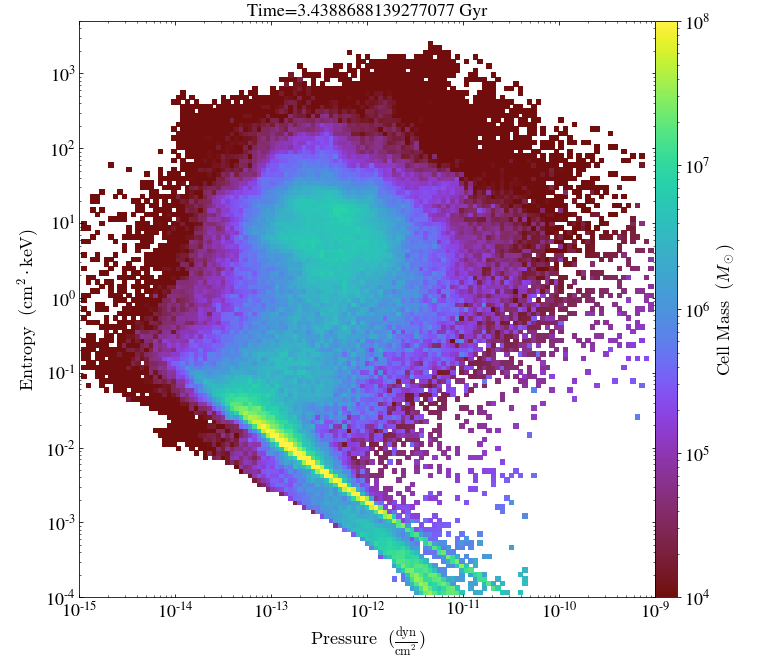

yt : [INFO     ] 2021-10-18 14:37:49,331 Parameters: current_time              = 160.81660281079
yt : [INFO     ] 2021-10-18 14:37:49,343 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:37:49,344 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:37:49,345 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:37:49,346 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:37:49,346 Parameters: current_redshift          = 1.9223998442962
yt : [INFO     ] 2021-10-18 14:37:49,347 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:37:49,348 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:37:49,348 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:37:49,349 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3354/3354 [00:02<00:00, 1280.19it/s]
yt : [INFO     ] 2021-10-1


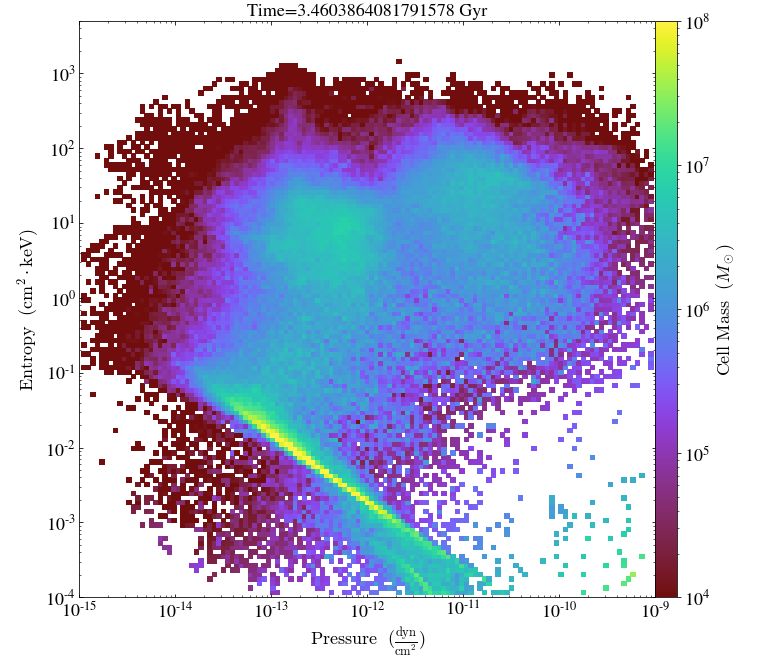

yt : [INFO     ] 2021-10-18 14:40:19,477 Parameters: current_time              = 161.81660281079
yt : [INFO     ] 2021-10-18 14:40:19,479 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:40:19,481 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:40:19,484 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:40:19,486 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:40:19,488 Parameters: current_redshift          = 1.9099590758029
yt : [INFO     ] 2021-10-18 14:40:19,490 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:40:19,492 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:40:19,494 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:40:19,496 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3381/3381 [00:01<00:00, 2017.33it/s]
yt : [INFO     ] 2021-10-1


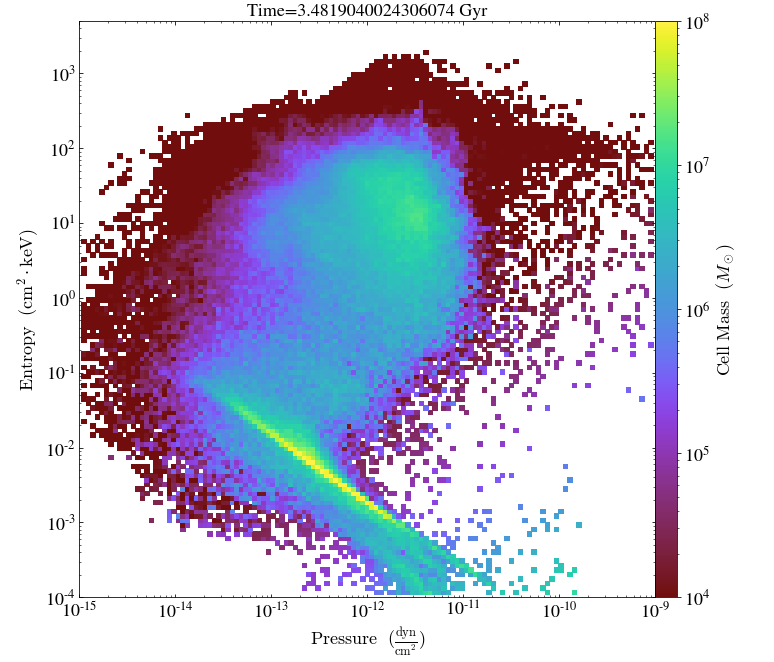

yt : [INFO     ] 2021-10-18 14:43:15,879 Parameters: current_time              = 162.81660281079
yt : [INFO     ] 2021-10-18 14:43:15,881 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:43:15,886 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:43:15,888 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:43:15,904 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:43:15,906 Parameters: current_redshift          = 1.8976438834237
yt : [INFO     ] 2021-10-18 14:43:15,920 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:43:15,922 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:43:15,924 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:43:15,926 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3337/3337 [00:01<00:00, 3127.17it/s]
yt : [INFO     ] 2021-10-1


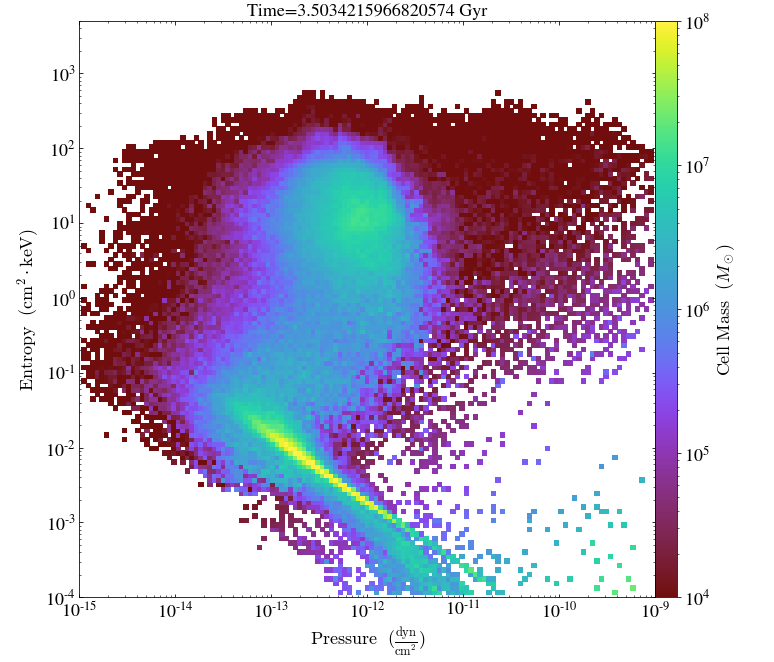

yt : [INFO     ] 2021-10-18 14:45:50,273 Parameters: current_time              = 163.81660281079
yt : [INFO     ] 2021-10-18 14:45:50,275 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:45:50,277 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:45:50,279 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:45:50,282 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:45:50,283 Parameters: current_redshift          = 1.8854437623787
yt : [INFO     ] 2021-10-18 14:45:50,285 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:45:50,288 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:45:50,290 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:45:50,292 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3413/3413 [00:01<00:00, 3267.22it/s]
yt : [INFO     ] 2021-10-1


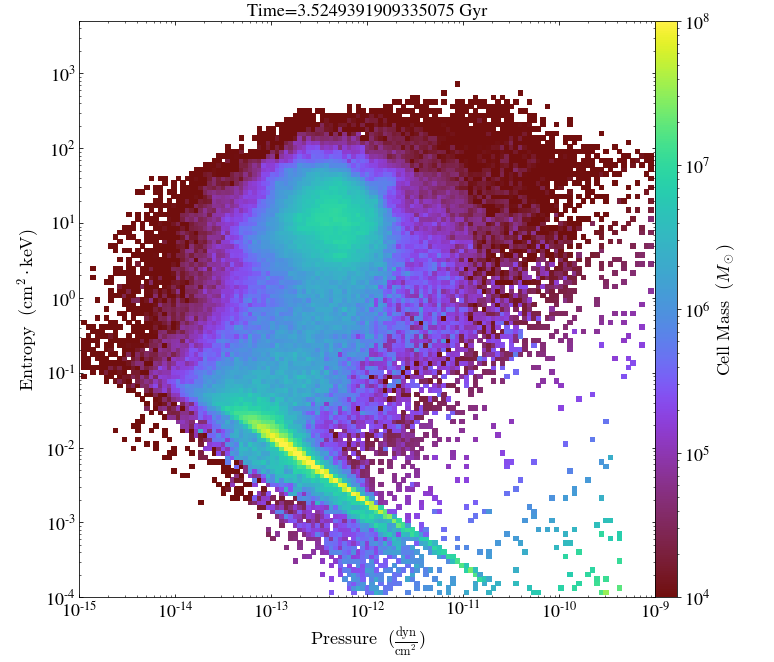

yt : [INFO     ] 2021-10-18 14:48:48,314 Parameters: current_time              = 164.81660281079
yt : [INFO     ] 2021-10-18 14:48:48,316 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:48:48,318 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:48:48,321 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:48:48,323 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:48:48,325 Parameters: current_redshift          = 1.8733687887993
yt : [INFO     ] 2021-10-18 14:48:48,341 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:48:48,343 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:48:48,345 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:48:48,347 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3387/3387 [00:00<00:00, 3691.18it/s]
yt : [INFO     ] 2021-10-1


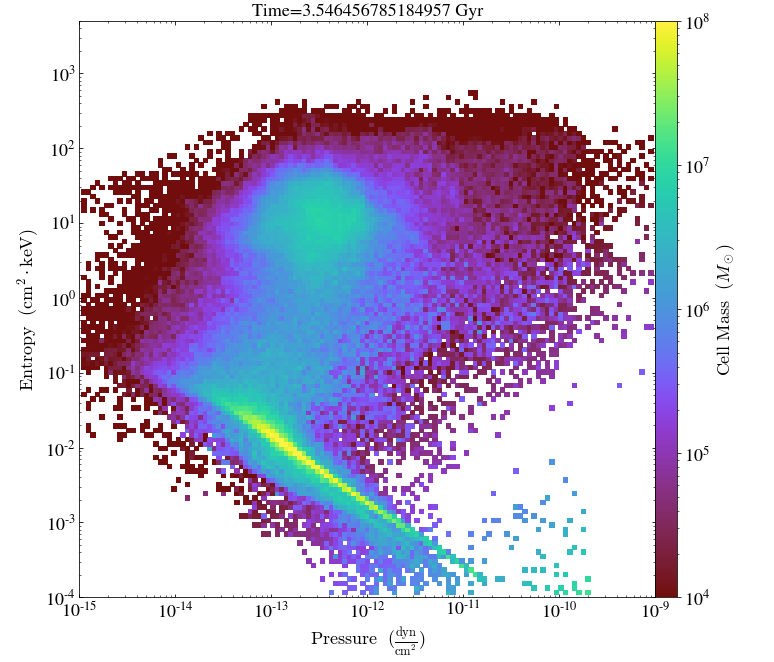

yt : [INFO     ] 2021-10-18 14:50:55,861 Parameters: current_time              = 165.81660281079
yt : [INFO     ] 2021-10-18 14:50:55,864 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:50:55,866 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:50:55,868 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:50:55,870 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:50:55,872 Parameters: current_redshift          = 1.8614169312397
yt : [INFO     ] 2021-10-18 14:50:55,874 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:50:55,876 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:50:55,878 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:50:55,892 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3394/3394 [00:01<00:00, 2673.05it/s]
yt : [INFO     ] 2021-10-1


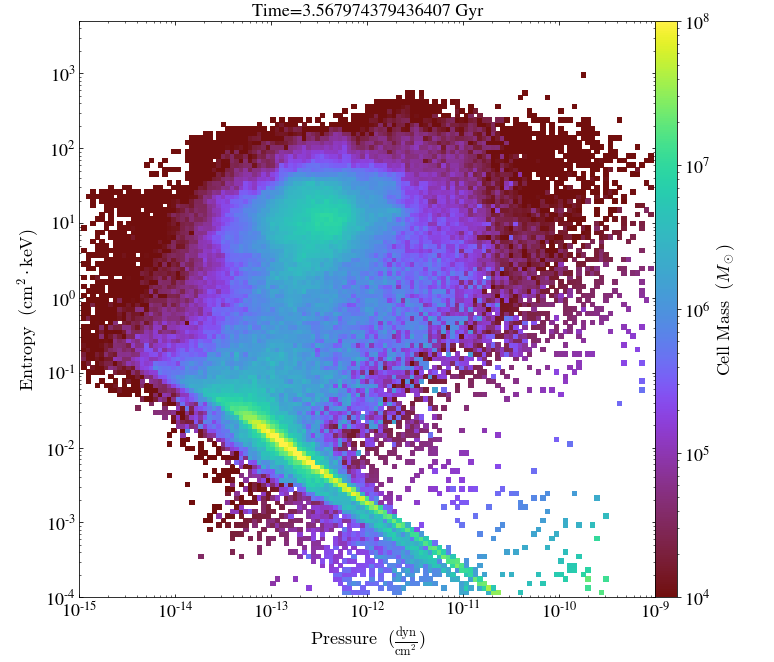

yt : [INFO     ] 2021-10-18 14:53:05,715 Parameters: current_time              = 166.81660281079
yt : [INFO     ] 2021-10-18 14:53:05,717 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:53:05,719 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:53:05,721 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:53:05,724 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:53:05,725 Parameters: current_redshift          = 1.8495716828282
yt : [INFO     ] 2021-10-18 14:53:05,727 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:53:05,729 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:53:05,731 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:53:05,733 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3419/3419 [00:01<00:00, 3240.89it/s]
yt : [INFO     ] 2021-10-1


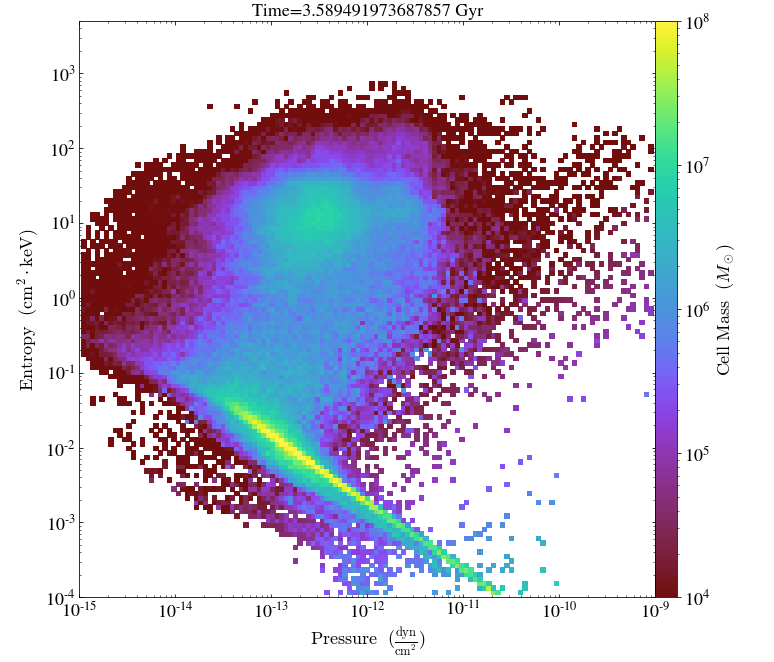

yt : [INFO     ] 2021-10-18 14:55:15,822 Parameters: current_time              = 167.81660281079
yt : [INFO     ] 2021-10-18 14:55:15,826 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:55:15,828 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:55:15,830 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:55:15,832 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:55:15,834 Parameters: current_redshift          = 1.837844756818
yt : [INFO     ] 2021-10-18 14:55:15,836 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:55:15,838 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:55:15,840 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:55:15,842 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3393/3393 [00:01<00:00, 2860.30it/s]
yt : [INFO     ] 2021-10-18


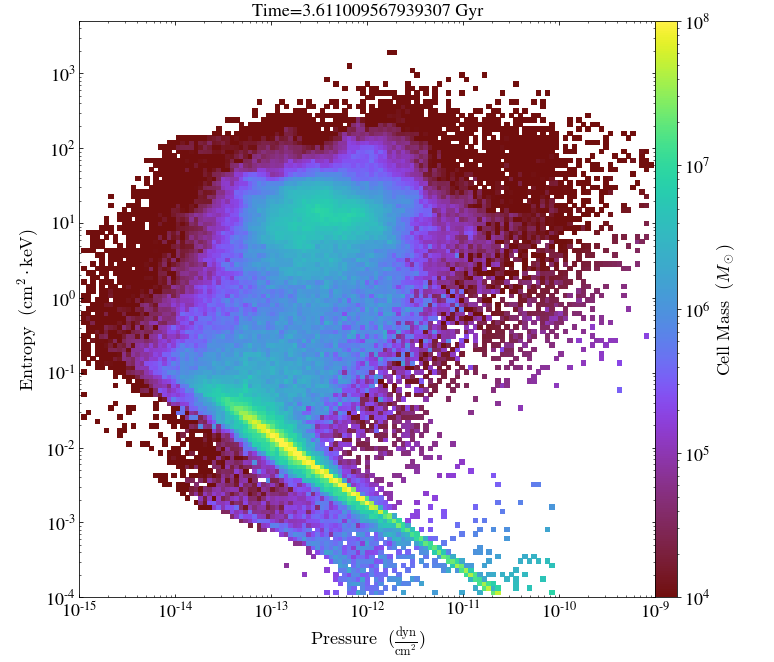

yt : [INFO     ] 2021-10-18 14:57:22,431 Parameters: current_time              = 168.81660281079
yt : [INFO     ] 2021-10-18 14:57:22,433 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:57:22,448 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:57:22,453 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:57:22,455 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:57:22,457 Parameters: current_redshift          = 1.826235334369
yt : [INFO     ] 2021-10-18 14:57:22,459 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:57:22,461 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:57:22,463 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:57:22,464 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3318/3318 [00:01<00:00, 2390.83it/s]
yt : [INFO     ] 2021-10-18


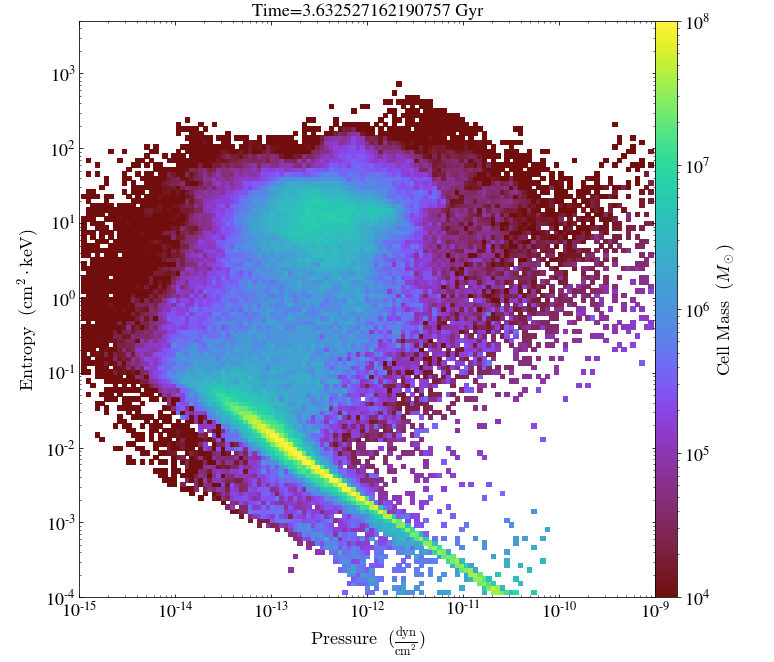

yt : [INFO     ] 2021-10-18 14:59:51,395 Parameters: current_time              = 169.81660281079
yt : [INFO     ] 2021-10-18 14:59:51,397 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 14:59:51,400 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 14:59:51,402 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 14:59:51,404 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 14:59:51,406 Parameters: current_redshift          = 1.8147325602179
yt : [INFO     ] 2021-10-18 14:59:51,420 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 14:59:51,422 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 14:59:51,424 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 14:59:51,426 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3339/3339 [00:00<00:00, 3666.18it/s]
yt : [INFO     ] 2021-10-1


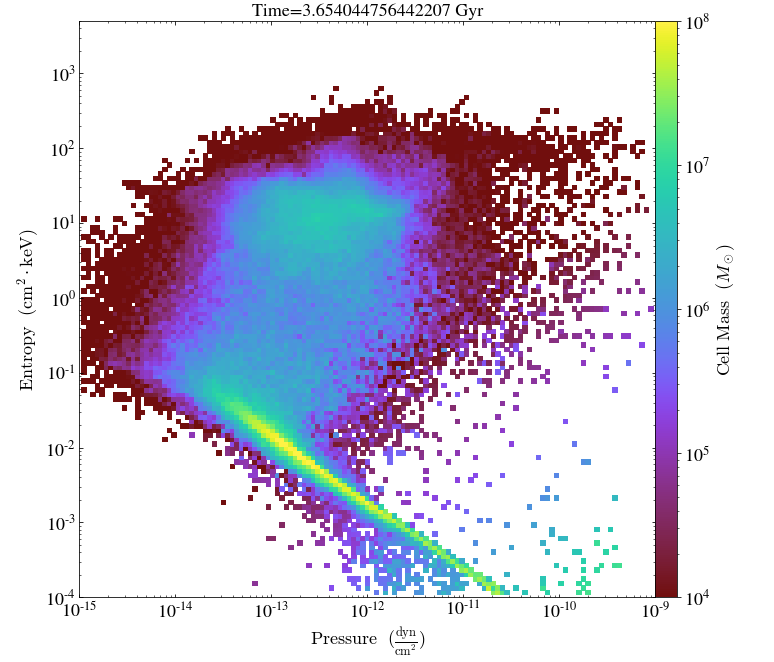

yt : [INFO     ] 2021-10-18 15:02:17,055 Parameters: current_time              = 170.81660281079
yt : [INFO     ] 2021-10-18 15:02:17,058 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-18 15:02:17,061 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-18 15:02:17,063 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-18 15:02:17,066 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-18 15:02:17,068 Parameters: current_redshift          = 1.8033370611939
yt : [INFO     ] 2021-10-18 15:02:17,070 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-18 15:02:17,073 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-18 15:02:17,075 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-18 15:02:17,077 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3381/3381 [00:00<00:00, 3938.45it/s]
yt : [INFO     ] 2021-10-1


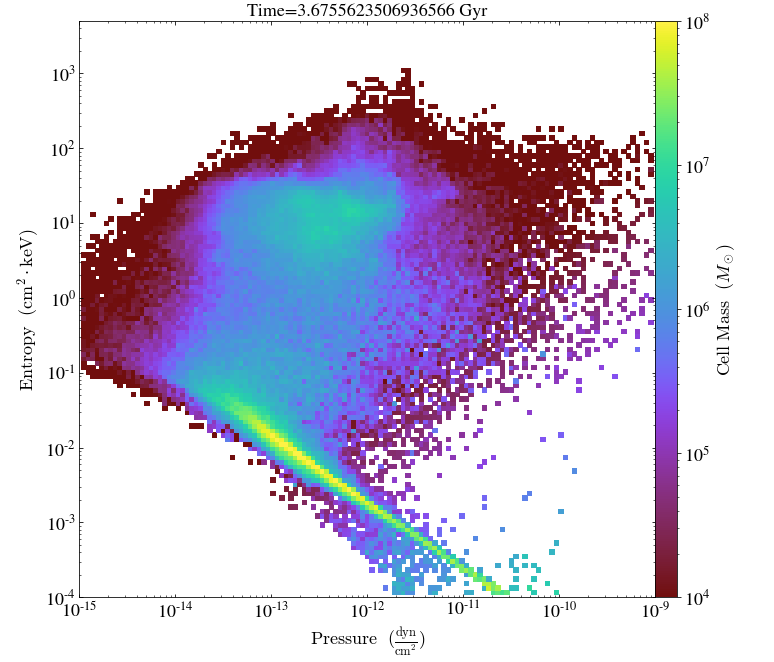

In [27]:
import yt
for n in range(123,171):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/stellar_st2_5'+fd+ff    
    ds = yt.load(fpath)
    time = ds.current_time.in_units('Gyr')
    d, c = ds.find_max("Dark_Matter_Density")
    sp = ds.sphere(c, (30, "kpc"))
    plot = yt.PhasePlot(sp, "pressure", "entropy", ["cell_mass"],
                    weight_field=None)
    #plot.set_unit("pressure", "km/s")
    plot.set_unit("cell_mass","msun")
    #plot.set_log('radius', False)
    #slc.set_log('entropy', False)
    plot.set_xlim(1.0e-15,1.0e-9)
    plot.set_ylim(0.0001,5000)
    plot.set_zlim('cell_mass',1.0e4,1.0e8)
    plot.annotate_title('Time='+str(time))
    plot.save('/mnt/scratch/deovratd/stellar_st2_5/pres_ent_'+str(fn))
    plot.show()

In [1]:
import matplotlib.pyplot as plt
import yt

for n in range(123,140,4):
    t = (n-1)*10
    fn='%04d'%n
    f = open("/mnt/scratch/deovratd/Cosmological/cosmo_agn_exp/no_jet/radial_Xprof_"+str(fn), "w")
    # Load the dataset.
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/cosmo_agn_exp/no_jet'+fd+ff  
    ds = yt.load(fpath)
    #xray_fields = yt.add_xray_emissivity_field(ds, 0.5, 7.0, table_type='cloudy', metallicity=1.0)
    #sp = ds.sphere("c", (200, "kpc"))
    d, c = ds.find_max("Dark_Matter_Density")
    sp = ds.sphere(c, (50, "kpc"))
    xray_gas= sp.cut_region(['(obj["temperature"] > 1e6) & (obj["temperature"] < 8e7)'])
    prof = yt.create_profile(xray_gas, 'radius', ('gas', 'entropy'),
                         units = {'radius': 'kpc'},
                         extrema = {'radius': ((0.1, 'kpc'), (50.0, 'kpc'))},
                         weight_field='cell_mass')
    rden = yt.create_profile(xray_gas, 'radius', ('gas', 'density'),
                         units = {'radius': 'kpc'},
                         extrema = {'radius': ((0.1, 'kpc'), (50.0, 'kpc'))},
                         weight_field='cell_mass')
    rprs = yt.create_profile(xray_gas, 'radius', ('gas', 'pressure'),
                         units = {'radius': 'kpc'},
                         extrema = {'radius': ((0.1, 'kpc'), (50.0, 'kpc'))},
                         weight_field='cell_mass')
    tcool = yt.create_profile(xray_gas, 'radius', ('gas', 'cooling_time'),
                         units = {'radius': 'kpc'},
                         extrema = {'radius': ((0.1, 'kpc'), (50.0, 'kpc'))},
                         weight_field='cell_mass')
    #radius = rden.x
    radius = prof.x
    ent = prof['gas', 'entropy']
    den = rden['gas', 'density']
    pres = rprs['gas', 'pressure']
    tcl = tcool['gas', 'cooling_time']
    
    for i in range(0,len(radius)):
        f.write("%.7e %.7e %.7e %.7e %.7e\n"%(radius[i], den[i], pres[i], tcl[i], ent[i]))
        #f.write("%.7e %.7e\n"%(radius[i], ent[i]))
    #plt.loglog(radius, mean, label='Mean')
    #plt.loglog(radius, std, label='Standard Deviation')
    #plt.xlabel('r [kpc]')
    #plt.ylabel('K [keV cm^2]')
    #plt.legend()
    #plt.savefig('entropy_profile.png')
    #plt.show()
    f.close()

yt : [INFO     ] 2021-04-12 23:19:39,265 Parameters: current_time              = 123.81653313164
yt : [INFO     ] 2021-04-12 23:19:39,267 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-04-12 23:19:39,269 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-04-12 23:19:39,270 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-04-12 23:19:39,271 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-04-12 23:19:39,273 Parameters: current_redshift          = 2.494169934926
yt : [INFO     ] 2021-04-12 23:19:39,274 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-04-12 23:19:39,275 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-04-12 23:19:39,276 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-04-12 23:19:39,278 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3341/3341 [00:00<00:00, 9296.79it/s]
yt : [INFO     ] 2021-04-12

In [7]:
import yt
from yt.analysis_modules.star_analysis.api import StarFormationRate
from yt.data_objects.particle_filters import add_particle_filter

def Stars(pfilter, data):
      return data[("all", "particle_type")] == 2
add_particle_filter("stars", function=Stars, filtered_type='all',
                    requires=["particle_type"])


ds = yt.load("/mnt/scratch/deovratd/stellar_st2_5/DD0209/DD0209")
ds.add_particle_filter('stars')
v, center = ds.find_max("Dark_Matter_Density")
sp = ds.sphere(center, (20, "kpc"))

# This puts the particle data for *all* the particles in the sphere sp
# into the arrays sm and ct.
mass = sp[("stars", "particle_mass")].in_units('Msun')
age = sp[("stars", "age")].in_units('Myr')
ct = sp[("stars", "creation_time")].in_units('Myr')

# Pick out only old stars using Numpy array fancy indexing.
threshold = ds.quan(10.0, "Myr")
mass_old = mass[age > threshold]
ct_old = ct[age > threshold]

#sfr = StarFormationRate(ds, star_mass=mass_old, star_creation_time=ct_old,
#                        volume=sp.volume())
sfr = StarFormationRate(ds, star_mass=mass, star_creation_time=ct,
                        volume=sp.volume())
sfr.write_out(name="/mnt/scratch/deovratd/stellar_st2_5/StarFormationRate_209.out")

yt : [WARNING  ] 2021-11-02 11:24:41,348 The stars particle filter already exists. Overriding.
yt : [INFO     ] 2021-11-02 11:24:41,372 Parameters: current_time              = 209.81660281079
yt : [INFO     ] 2021-11-02 11:24:41,373 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-11-02 11:24:41,375 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-11-02 11:24:41,376 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-11-02 11:24:41,377 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-11-02 11:24:41,378 Parameters: current_redshift          = 1.4292068609748
yt : [INFO     ] 2021-11-02 11:24:41,379 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-11-02 11:24:41,380 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-11-02 11:24:41,381 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-11-02 11:24:41,382 Parameters: hubble_constant           = 0.695
Parsi

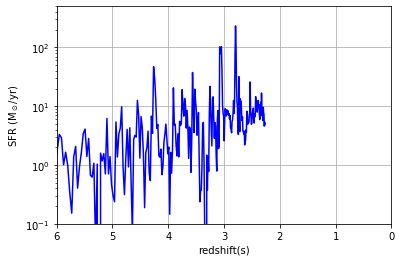

In [3]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots()
ax.semilogy(sfr.redshift,sfr.Msol_yr,'b-')
ax.set_xlim(6,0)
ax.set_ylim(0.1,500)
ax.set_xlabel('redshift(s)')
ax.set_ylabel('SFR (M$_\odot$/yr)')
#ax.set_title('Halo_002878; z=2.096')
ax.grid(True)

In [1]:
import yt

for n in range(127,140,4):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/no_jet'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    ad = data_ds.all_data()
 
    slc = yt.SlicePlot(data_ds, "x", "density", center=("max","Dark_Matter_Density"), width=(32,'kpc'))

    colorbar = slc.set_cmap(field='density', cmap='bds_highcontrast')
    slc.set_zlim('density', 1.0e-28,1.0e-23)
    #slc.set_zlim('temperature', 1.0e4,1.0e8)
    slc.annotate_title("time="+str(time))
    slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
                      plot_args={"color": "purple"})
    slc.save("/mnt/scratch/deovratd/Cosmological/no_jet/yz_"+str(fn))
    slc.show()

yt : [ERROR    ] 2021-04-12 23:37:09,310 None of the arguments provided to load() is a valid file
yt : [ERROR    ] 2021-04-12 23:37:09,312 Please check that you have used a correct path


YTOutputNotIdentified: Supplied ('/mnt/scratch/deovratd/Cosmological/no_jet/DD0127/DD0127',) {}, but could not load!

In [ ]:
import yt
for n in range(127,148):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/eff_test_z_2_5'+fd+ff    
    ds = yt.load(fpath)
    time = ds.current_time.in_units('Gyr')
    d, c = ds.find_max("Dark_Matter_Density")
    sp = ds.sphere(c, (50, "kpc"))
    plot = yt.PhasePlot(sp, "pressure", "entropy", ["cell_mass"],
                    weight_field=None)
    #plot.set_unit("radius", "kpc")
    plot.set_unit("cell_mass","msun")
    #plot.set_log('radius', False)
    #slc.set_log('entropy', False)
    plot.set_xlim(1.0e-15,1.0e-9)
    plot.set_ylim(0.0001,5000)
    plot.set_zlim('cell_mass',1.0e4,1.0e8)
    plot.annotate_title('Time='+str(time))
    plot.save('/mnt/scratch/deovratd/Cosmological/eff_test_z_2_5/pressure_entropy_'+str(fn))
    plot.show()

yt : [INFO     ] 2021-01-11 23:46:42,272 Parameters: current_time              = 127.81660281079
yt : [INFO     ] 2021-01-11 23:46:42,274 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-01-11 23:46:42,275 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-01-11 23:46:42,276 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-01-11 23:46:42,277 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-01-11 23:46:42,279 Parameters: current_redshift          = 2.4194524839203
yt : [INFO     ] 2021-01-11 23:46:42,280 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-01-11 23:46:42,281 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-01-11 23:46:42,282 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-01-11 23:46:42,283 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3319/3319 [00:00<00:00, 8610.26it/s] 
yt : [INFO     ] 2021-01-

/mnt/home/deovratd/yt_cos_ap/lib/python3.7/site-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Development of the HaloCatalog module has been moved to the yt_astro_analysis package. This version is deprecated and will be removed from yt in a future release. See https://github.com/yt-project/yt_astro_analysis for further information.
  
/mnt/home/deovratd/yt_cos_ap/lib/python3.7/site-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Development of the halo_finding module has been moved to the yt_astro_analysis package. This version is deprecated and will be removed from yt in a future release. See https://github.com/yt-project/yt_astro_analysis for further information.
  This is separate from the ipykernel package so we can avoid doing imports until
yt : [INFO     ] 2021-02-24 13:54:19,759 Parameters: current_time              = 126.81660281079
yt : [INFO     ] 2021-02-24 13:54:19,761 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-02


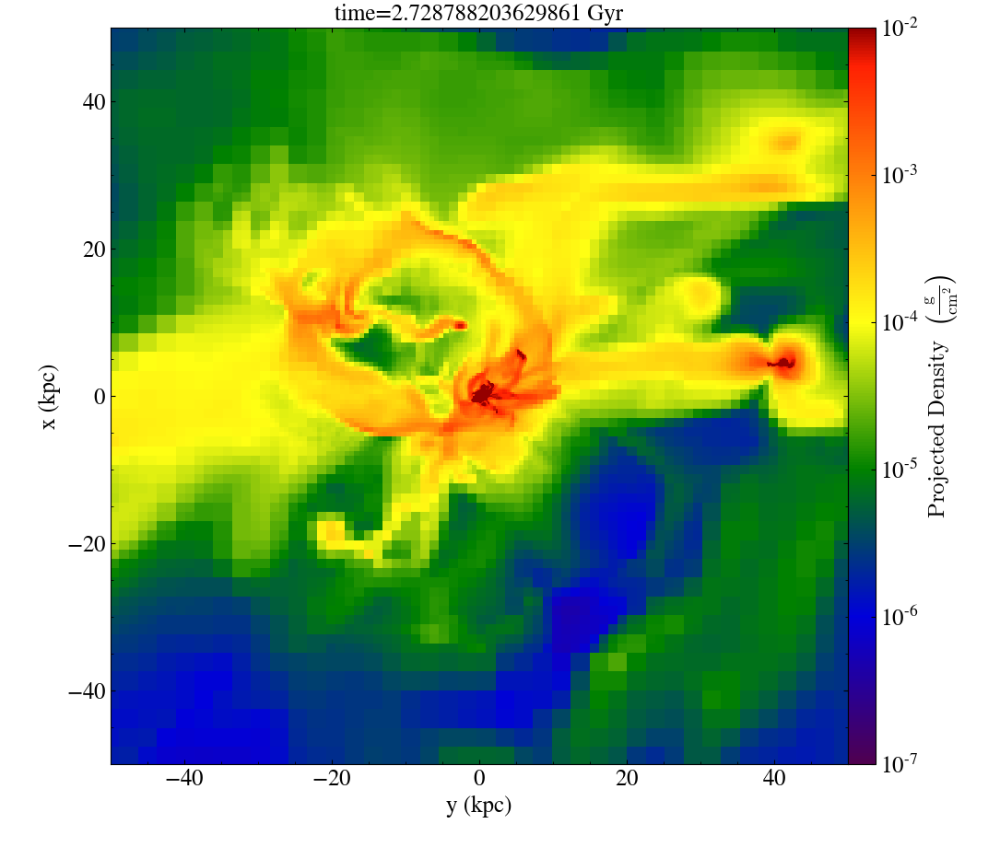

In [1]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

for n in range(135,136):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological_stellar_Feedback'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    L = [0,0,1] # vector normal to cutting plane
    north_vector = [1,0,0]
    d, c = data_ds.find_max("Dark_Matter_Density") 
    prj = yt.OffAxisProjectionPlot(data_ds,L, "density",center=("max","Dark_Matter_Density"),
                            width=((100,'kpc'),(100,'kpc')), depth=(10,'kpc'), north_vector=north_vector)
    colorbar = prj.set_cmap(field='density', cmap='bds_highcontrast')
    prj.set_zlim('density', 1.0e-7,1.0e-2)
    prj.annotate_title("time="+str(time))
    prj.set_xlabel('y (kpc)')
    prj.set_ylabel('x (kpc)')
    #slc.annotate_text([-28,28], 'Cold mode FB, Self consistent jet axis, kinetic jet', coord_system='plot')
    #slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
    #                  plot_args={"color": "purple"})
    prj.save("/mnt/scratch/deovratd/Cosmological/cosmo_agn_exp/no_jet/xy100kpc_d10kpc_"+str(fn))
    prj.show()

In [7]:
halos_ds = yt.load('/mnt/home/deovratd/rockstar/halos_0.0.bin')

yt : [ERROR    ] 2020-04-17 09:07:49,133 None of the arguments provided to load() is a valid file
yt : [ERROR    ] 2020-04-17 09:07:49,134 Please check that you have used a correct path


YTOutputNotIdentified: Supplied ('/mnt/home/deovratd/rockstar/halos_0.0.bin',) {}, but could not load!

yt : [INFO     ] 2020-12-18 15:45:30,981 Parameters: current_time              = 123.81653313164
yt : [INFO     ] 2020-12-18 15:45:30,983 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-12-18 15:45:30,984 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-12-18 15:45:30,985 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-12-18 15:45:30,986 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-12-18 15:45:30,987 Parameters: current_redshift          = 2.494169934926
yt : [INFO     ] 2020-12-18 15:45:30,988 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-12-18 15:45:30,989 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-12-18 15:45:30,990 Parameters: omega_radiation           = 0
yt : [INFO     ] 2020-12-18 15:45:30,992 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3341/3341 [00:00<00:00, 9086.77it/s] 
yt : [INFO     ] 2020-12-1


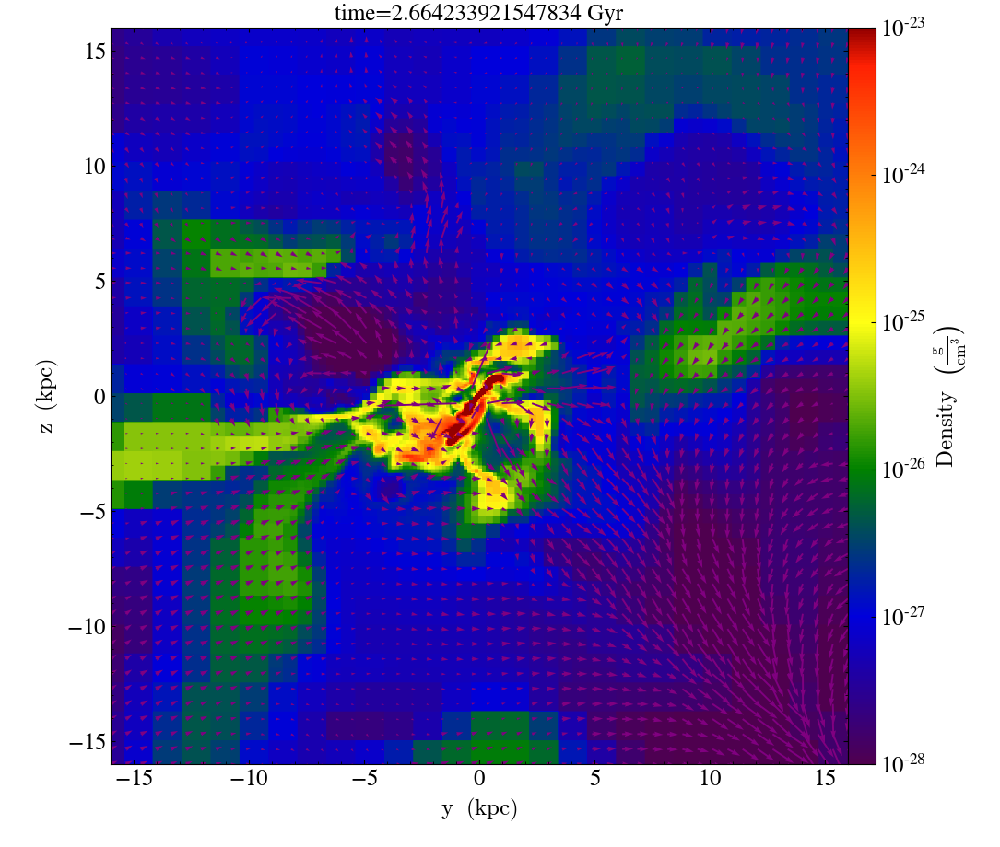

yt : [INFO     ] 2020-12-18 15:49:34,730 Parameters: current_time              = 124.81660281776
yt : [INFO     ] 2020-12-18 15:49:34,732 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-12-18 15:49:34,733 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-12-18 15:49:34,734 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-12-18 15:49:34,735 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-12-18 15:49:34,736 Parameters: current_redshift          = 2.4751240873046
yt : [INFO     ] 2020-12-18 15:49:34,737 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-12-18 15:49:34,738 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-12-18 15:49:34,739 Parameters: omega_radiation           = 0
yt : [INFO     ] 2020-12-18 15:49:34,740 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3257/3257 [00:00<00:00, 7352.16it/s]
yt : [INFO     ] 2020-12-1


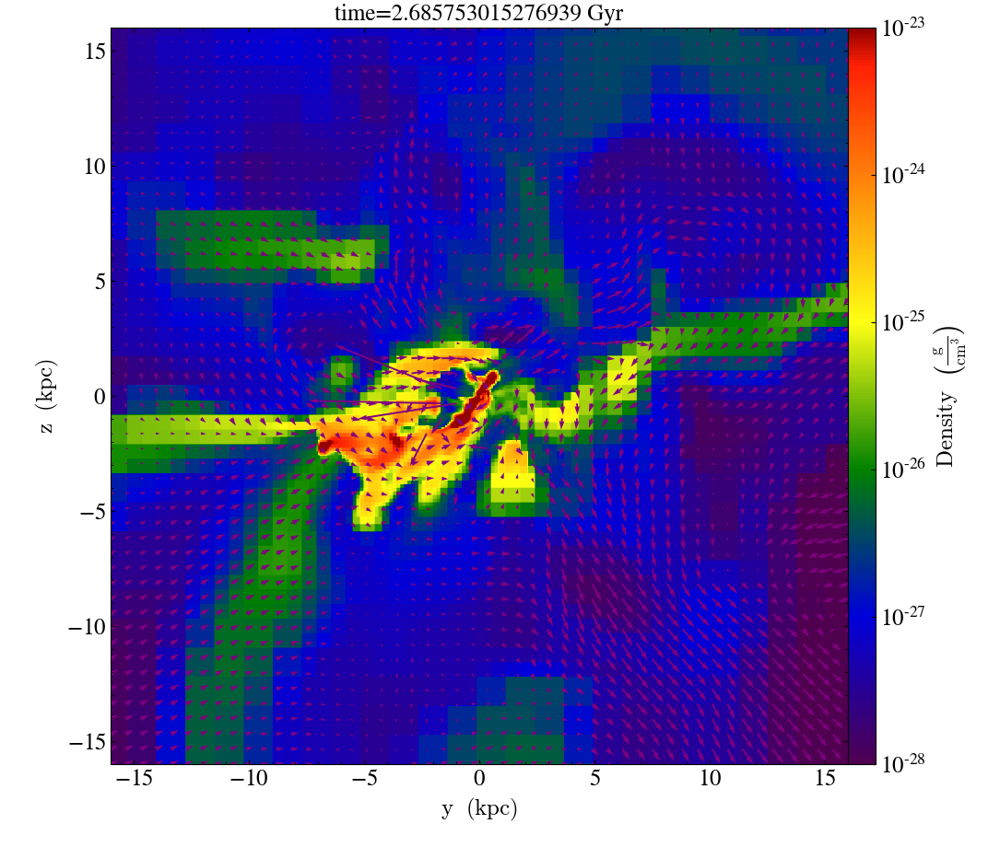

yt : [INFO     ] 2020-12-18 15:54:00,300 Parameters: current_time              = 125.81660281079
yt : [INFO     ] 2020-12-18 15:54:00,302 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-12-18 15:54:00,303 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-12-18 15:54:00,304 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-12-18 15:54:00,306 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-12-18 15:54:00,307 Parameters: current_redshift          = 2.4563222146479
yt : [INFO     ] 2020-12-18 15:54:00,308 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-12-18 15:54:00,309 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-12-18 15:54:00,310 Parameters: omega_radiation           = 0
yt : [INFO     ] 2020-12-18 15:54:00,320 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3233/3233 [00:00<00:00, 7216.35it/s] 
yt : [INFO     ] 2020-12-


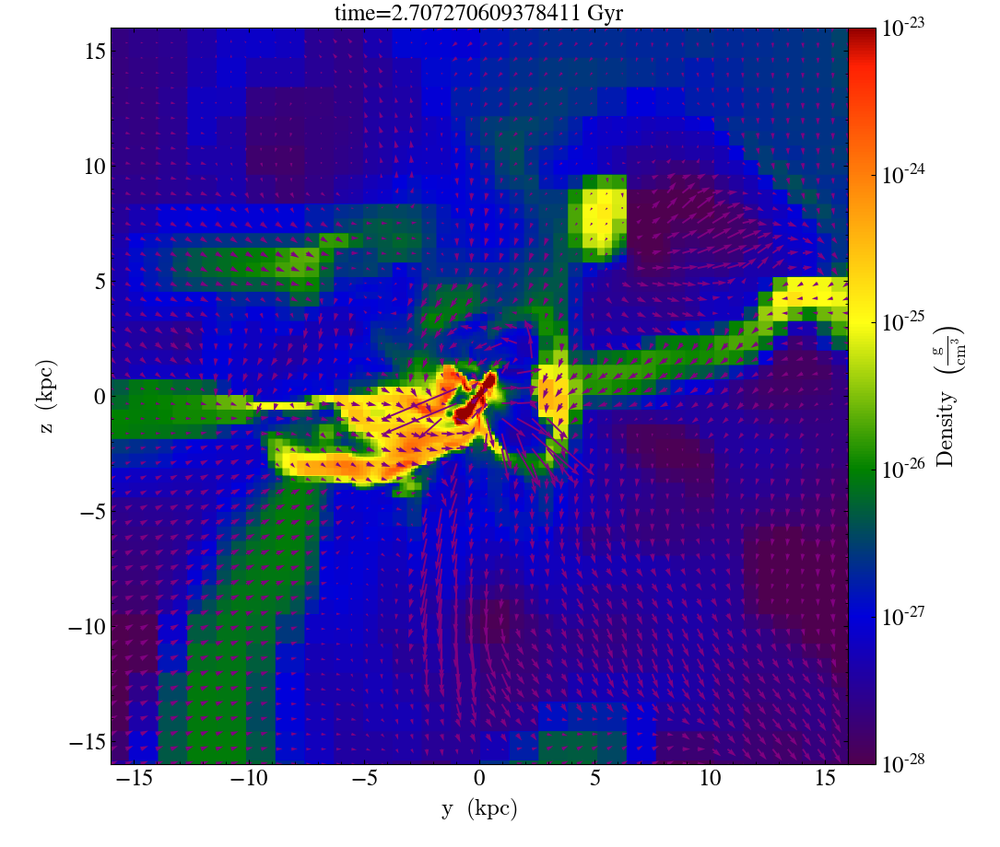

yt : [INFO     ] 2020-12-18 15:58:14,240 Parameters: current_time              = 126.81660281079
yt : [INFO     ] 2020-12-18 15:58:14,241 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-12-18 15:58:14,242 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-12-18 15:58:14,243 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-12-18 15:58:14,245 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-12-18 15:58:14,246 Parameters: current_redshift          = 2.437767092246
yt : [INFO     ] 2020-12-18 15:58:14,247 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-12-18 15:58:14,248 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-12-18 15:58:14,249 Parameters: omega_radiation           = 0
yt : [INFO     ] 2020-12-18 15:58:14,250 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3331/3331 [00:00<00:00, 5233.13it/s]
yt : [INFO     ] 2020-12-18


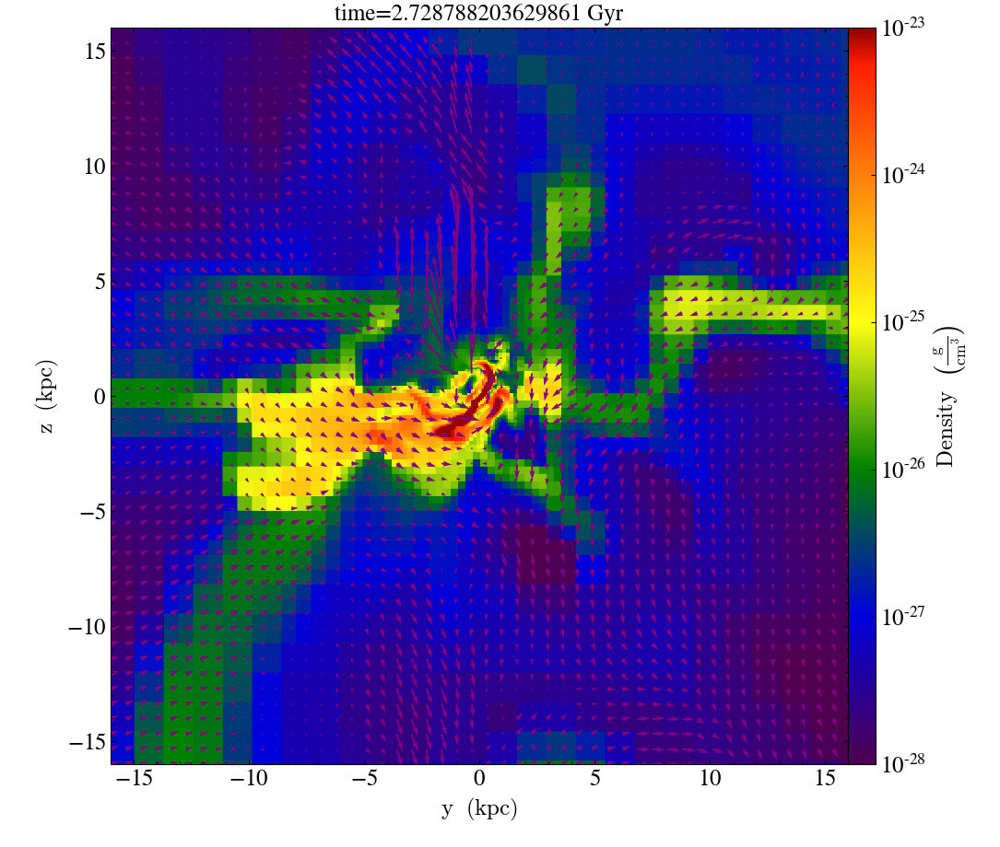

In [1]:
import yt

for n in range(123,127):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/no_jet'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    ad = data_ds.all_data()
 
    slc = yt.SlicePlot(data_ds, "x", "density", center=("max","Dark_Matter_Density"), width=(32,'kpc'))

    colorbar = slc.set_cmap(field='density', cmap='bds_highcontrast')
    slc.set_zlim('density', 1.0e-28,1.0e-23)
    #slc.set_zlim('temperature', 1.0e4,1.0e8)
    slc.annotate_title("time="+str(time))
    slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
                      plot_args={"color": "purple"})
    slc.save("/mnt/scratch/deovratd/Cosmological/no_jet/yz_"+str(fn))
    slc.show()

In [10]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.data_objects.particle_filters import add_particle_filter

data_ds = yt.load('/mnt/scratch/deovratd/Cosmological/halo_002878/old/DD0275')
#data_ds.field_list

yt : [INFO     ] 2019-12-03 15:52:28,254 Parameters: current_time              = 275.81654510603
yt : [INFO     ] 2019-12-03 15:52:28,256 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2019-12-03 15:52:28,258 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2019-12-03 15:52:28,260 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2019-12-03 15:52:28,262 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2019-12-03 15:52:28,263 Parameters: current_redshift          = 0.99776203477122
yt : [INFO     ] 2019-12-03 15:52:28,265 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2019-12-03 15:52:28,266 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2019-12-03 15:52:28,268 Parameters: omega_radiation           = 0
yt : [INFO     ] 2019-12-03 15:52:28,270 Parameters: hubble_constant           = 0.695


In [11]:
hc = HaloCatalog(data_ds=data_ds, finder_method='hop')

In [12]:
hc.create()

Parsing Hierarchy : 100%|██████████| 3778/3778 [00:00<00:00, 4838.36it/s]
yt : [INFO     ] 2019-12-03 15:52:38,349 Gathering a field list (this may take a moment.)


KeyError: "Unable to open object (object 'ActiveParticles' doesn't exist)"

yt : [INFO     ] 2019-10-22 11:26:40,399 Projection completed
yt : [INFO     ] 2019-10-22 11:26:40,528 xlim = 0.000000 1.000000
yt : [INFO     ] 2019-10-22 11:26:40,530 ylim = 0.000000 1.000000
yt : [INFO     ] 2019-10-22 11:26:40,532 xlim = 0.000000 1.000000
yt : [INFO     ] 2019-10-22 11:26:40,533 ylim = 0.000000 1.000000
yt : [INFO     ] 2019-10-22 11:26:40,576 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



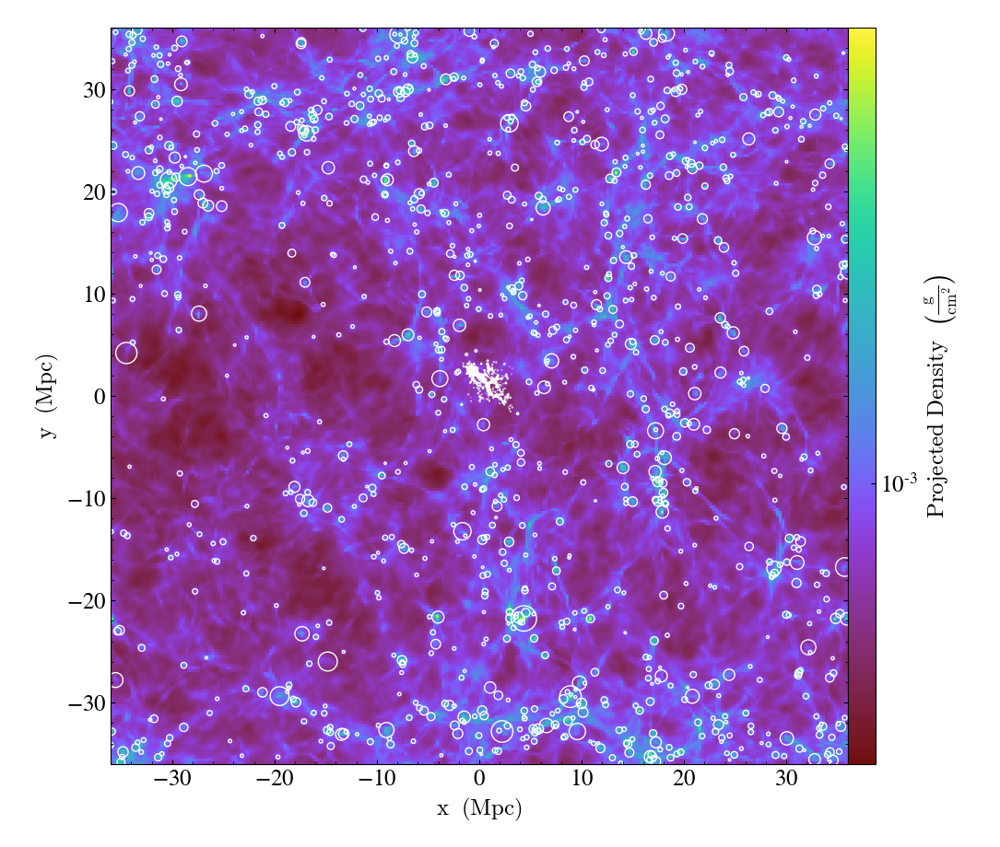

In [6]:
prj = yt.ProjectionPlot(data_ds, 'z', 'density')
prj.annotate_halos(hc)
prj.show()

In [4]:
def DarkMatter(pfilter, data):
    filter = data[("all", "particle_type")] == 1 # DM = 1, Stars = 2
    return filter

add_particle_filter("dark_matter", function=DarkMatter, filtered_type='all', \
                    requires=["particle_type"])


data_ds.add_particle_filter('dark_matter')
ad = data_ds.all_data()
min_dm_mass = ad.quantities.extrema(('dark_matter','particle_mass'))[0]

In [43]:
hc.add_quantity('center_of_mass')

In [40]:
pm = hc.add_filter("quantity_value", "particle_mass", ">", 1e14, "Msun")

In [41]:
pm

yt : [INFO     ] 2019-10-09 10:25:34,467 Max Value is 5.41914e+08 at 0.5109844207763672 0.5147457122802735 0.4841022491455079
yt : [INFO     ] 2019-10-09 10:25:41,977 Projection completed
yt : [INFO     ] 2019-10-09 10:25:42,141 xlim = 0.372140 0.649829
yt : [INFO     ] 2019-10-09 10:25:42,142 ylim = 0.375901 0.653590
yt : [INFO     ] 2019-10-09 10:25:42,143 xlim = 0.372140 0.649829
yt : [INFO     ] 2019-10-09 10:25:42,144 ylim = 0.375901 0.653590
yt : [INFO     ] 2019-10-09 10:25:42,180 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



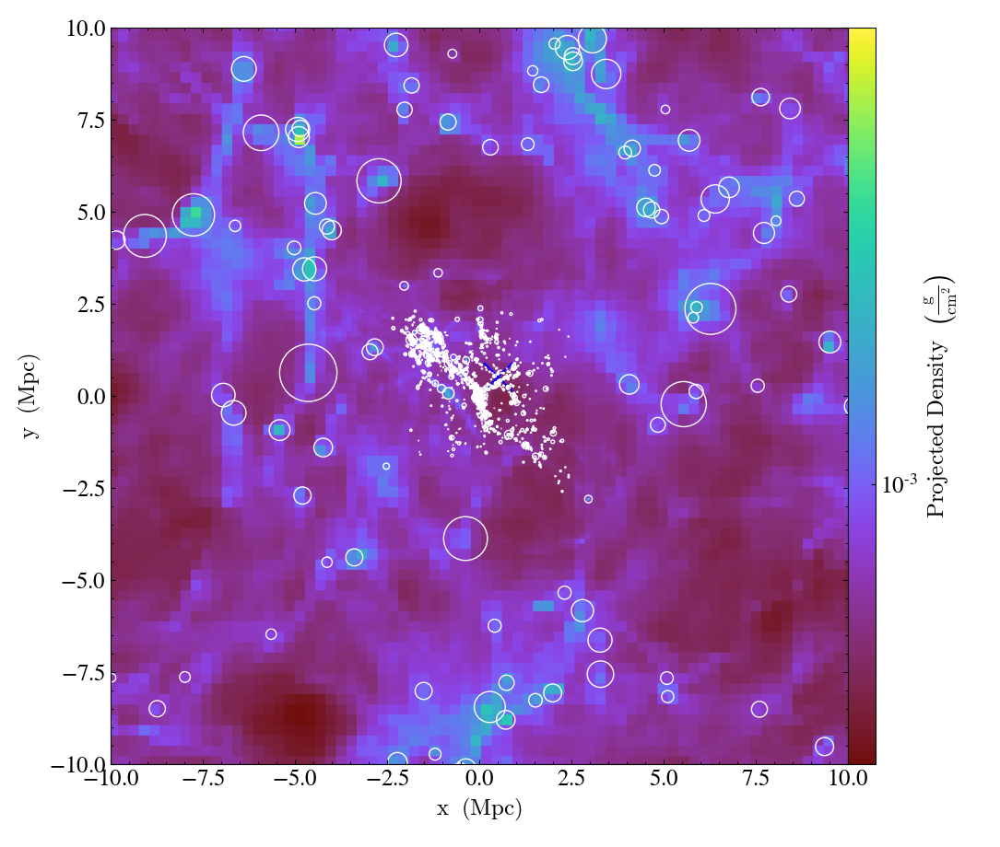

In [4]:
d, c = data_ds.find_max("Dark_Matter_Density")
prj = yt.ProjectionPlot(data_ds, 'z', 'density',center=[c[0],c[1],c[2]], width=(20,'Mpc'))
prj.annotate_halos(hc)
prj.annotate_marker((c[0],c[1]), coord_system='plot',
                  plot_args={'color':'blue','s':500})
prj.show()

yt : [INFO     ] 2019-10-09 10:26:00,645 Max Value is 1.37435e-22 at 0.5109615325927734 0.5147457122802735 0.4840908050537109
yt : [INFO     ] 2019-10-09 10:26:07,797 Projection completed
yt : [INFO     ] 2019-10-09 10:26:07,799 xlim = 0.372117 0.649806
yt : [INFO     ] 2019-10-09 10:26:07,801 ylim = 0.375901 0.653590
yt : [INFO     ] 2019-10-09 10:26:07,803 xlim = 0.372117 0.649806
yt : [INFO     ] 2019-10-09 10:26:07,805 ylim = 0.375901 0.653590
yt : [INFO     ] 2019-10-09 10:26:07,807 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



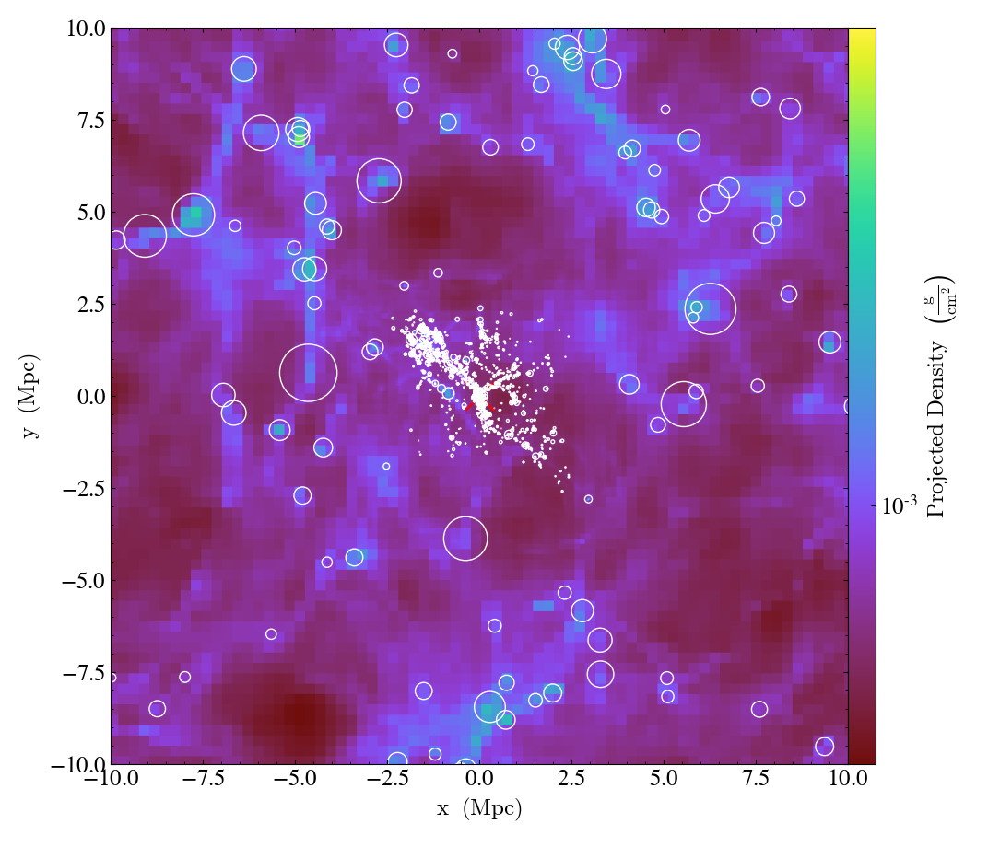

In [5]:
d1, c1 = data_ds.find_max("density")
prj = yt.ProjectionPlot(data_ds, 'z', 'density',center=[c1[0],c1[1],c1[2]], width=(20,'Mpc'))
prj.annotate_halos(hc)
prj.annotate_marker((c1[0],c1[1],c1[2]), coord_system='data',
                  plot_args={'color':'red','s':500})
prj.show()

yt : [INFO     ] 2019-10-09 10:28:24,025 Max Value is 1.37435e-22 at 0.5109615325927734 0.5147457122802735 0.4840908050537109
yt : [INFO     ] 2019-10-09 10:28:31,976 Projection completed
yt : [INFO     ] 2019-10-09 10:28:31,979 xlim = 0.510267 0.511656
yt : [INFO     ] 2019-10-09 10:28:31,981 ylim = 0.514051 0.515440
yt : [INFO     ] 2019-10-09 10:28:31,983 xlim = 0.510267 0.511656
yt : [INFO     ] 2019-10-09 10:28:31,985 ylim = 0.514051 0.515440
yt : [INFO     ] 2019-10-09 10:28:31,987 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



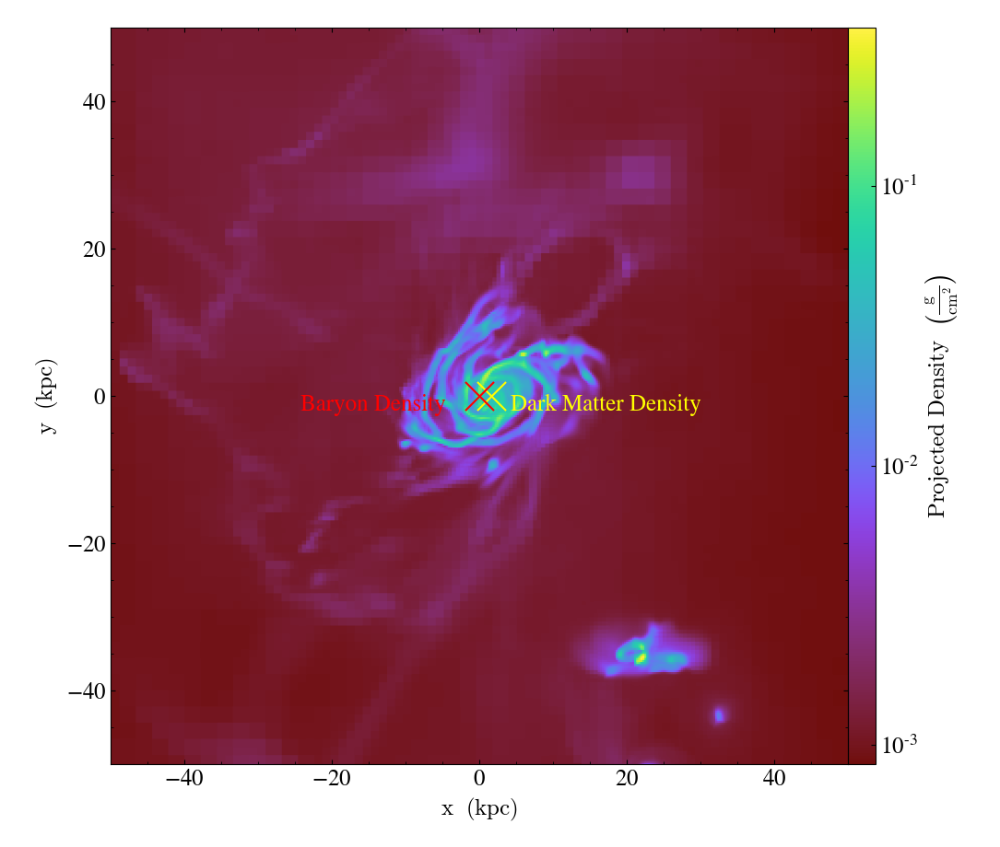

In [6]:
d1, c1 = data_ds.find_max("density")
prj = yt.ProjectionPlot(data_ds, 'z', 'density',center=[c1[0],c1[1],c1[2]], width=(100,'kpc'))
#prj.annotate_halos(hc)
prj.annotate_marker((c[0],c[1],c[2]), coord_system='data',
                  plot_args={'color':'yellow','s':500})
prj.annotate_marker((c1[0],c1[1],c1[2]), coord_system='data',
                  plot_args={'color':'red','s':500})
prj.annotate_text((c[0], c[1]), 'Dark Matter Density', coord_system='figure',
                text_args={'color':'yellow'})
prj.annotate_text((0.3, c1[1]), 'Baryon Density', coord_system='figure',
                text_args={'color':'red'})
prj.show()

yt : [INFO     ] 2019-10-09 10:29:47,585 Max Value is 1.37435e-22 at 0.5109615325927734 0.5147457122802735 0.4840908050537109
yt : [INFO     ] 2019-10-09 10:29:55,111 Projection completed
yt : [INFO     ] 2019-10-09 10:29:55,113 xlim = 0.514051 0.515440
yt : [INFO     ] 2019-10-09 10:29:55,115 ylim = 0.483397 0.484785
yt : [INFO     ] 2019-10-09 10:29:55,117 xlim = 0.514051 0.515440
yt : [INFO     ] 2019-10-09 10:29:55,118 ylim = 0.483397 0.484785
yt : [INFO     ] 2019-10-09 10:29:55,121 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



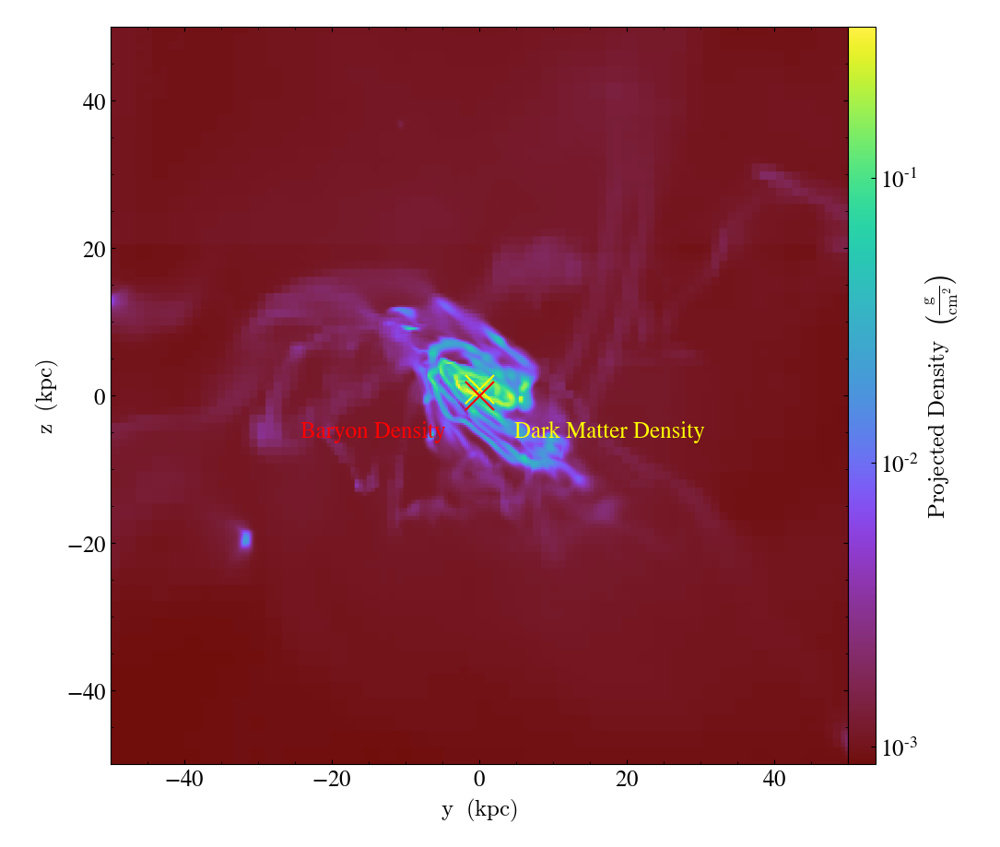

In [8]:
d1, c1 = data_ds.find_max("density")
prj = yt.ProjectionPlot(data_ds, 'x', 'density',center=[c1[0],c1[1],c1[2]], width=(100,'kpc'))
#prj.annotate_halos(hc)
prj.annotate_marker((c[0],c[1],c[2]), coord_system='data',
                  plot_args={'color':'yellow','s':500})
prj.annotate_marker((c1[0],c1[1],c1[2]), coord_system='data',
                  plot_args={'color':'red','s':500})
prj.annotate_text((c[1], c[2]), 'Dark Matter Density', coord_system='figure',
                text_args={'color':'yellow'})
prj.annotate_text((0.3, c1[2]), 'Baryon Density', coord_system='figure',
                text_args={'color':'red'})
prj.show()

yt : [INFO     ] 2019-10-09 10:30:43,064 Max Value is 1.37435e-22 at 0.5109615325927734 0.5147457122802735 0.4840908050537109
yt : [INFO     ] 2019-10-09 10:30:50,587 Projection completed
yt : [INFO     ] 2019-10-09 10:30:50,589 xlim = 0.483397 0.484785
yt : [INFO     ] 2019-10-09 10:30:50,591 ylim = 0.510267 0.511656
yt : [INFO     ] 2019-10-09 10:30:50,593 xlim = 0.483397 0.484785
yt : [INFO     ] 2019-10-09 10:30:50,595 ylim = 0.510267 0.511656
yt : [INFO     ] 2019-10-09 10:30:50,597 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800



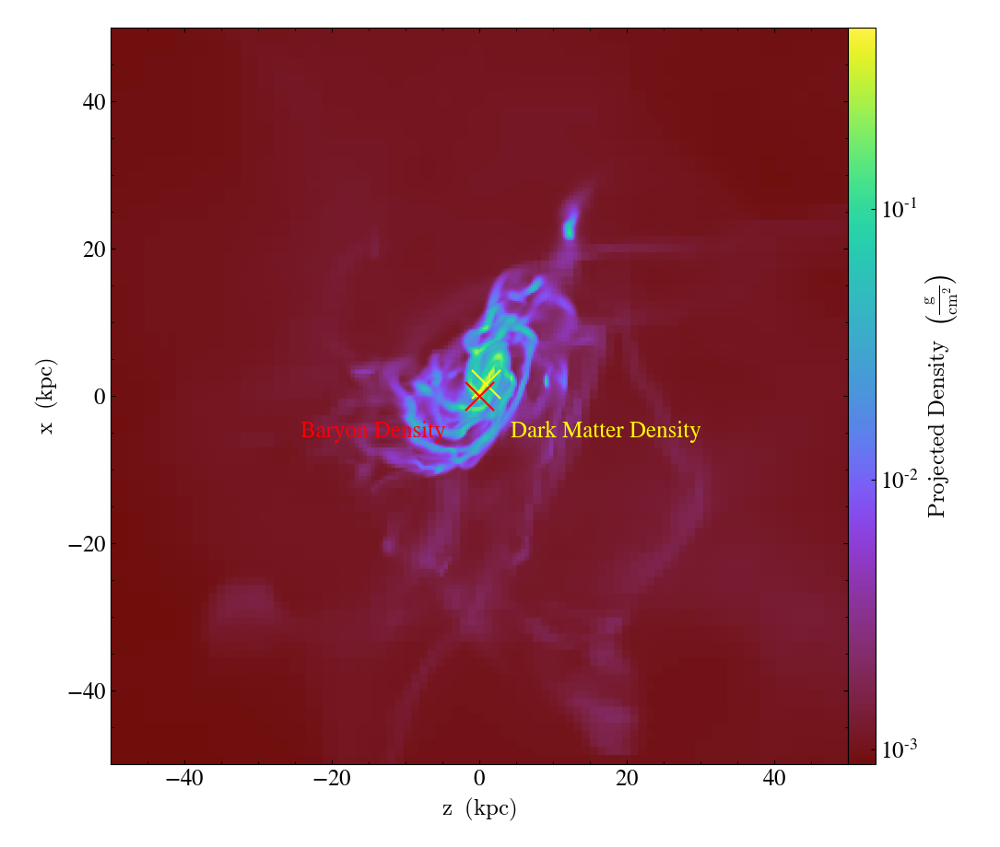

In [9]:
d1, c1 = data_ds.find_max("density")
prj = yt.ProjectionPlot(data_ds, 'y', 'density',center=[c1[0],c1[1],c1[2]], width=(100,'kpc'))
#prj.annotate_halos(hc)
prj.annotate_marker((c[0],c[1],c[2]), coord_system='data',
                  plot_args={'color':'yellow','s':500})
prj.annotate_marker((c1[0],c1[1],c1[2]), coord_system='data',
                  plot_args={'color':'red','s':500})
prj.annotate_text((c[0], c[2]), 'Dark Matter Density', coord_system='figure',
                text_args={'color':'yellow'})
prj.annotate_text((0.3, c1[2]), 'Baryon Density', coord_system='figure',
                text_args={'color':'red'})
prj.show()

In [18]:
pm = hc.add_quantity('center_of_mass')

In [23]:
import numpy as np
np.size(pm)

1

yt : [INFO     ] 2019-10-07 16:54:05,468 Max Value is 1.13075e+43 at 0.0019531250000000 0.0019531250000000 0.0019531250000000
yt : [INFO     ] 2019-10-07 16:54:14,992 Projection completed
yt : [INFO     ] 2019-10-07 16:54:14,995 xlim = -0.136891 0.140798
yt : [INFO     ] 2019-10-07 16:54:14,996 ylim = -0.136891 0.140798
yt : [INFO     ] 2019-10-07 16:54:14,998 xlim = -0.136891 0.140798
yt : [INFO     ] 2019-10-07 16:54:15,000 ylim = -0.136891 0.140798
yt : [INFO     ] 2019-10-07 16:54:15,002 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
yt : [WARNING  ] 2019-10-07 16:54:16,008 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 16:54:16,040 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 16:54:16,071 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 16:54:16,102 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 16:


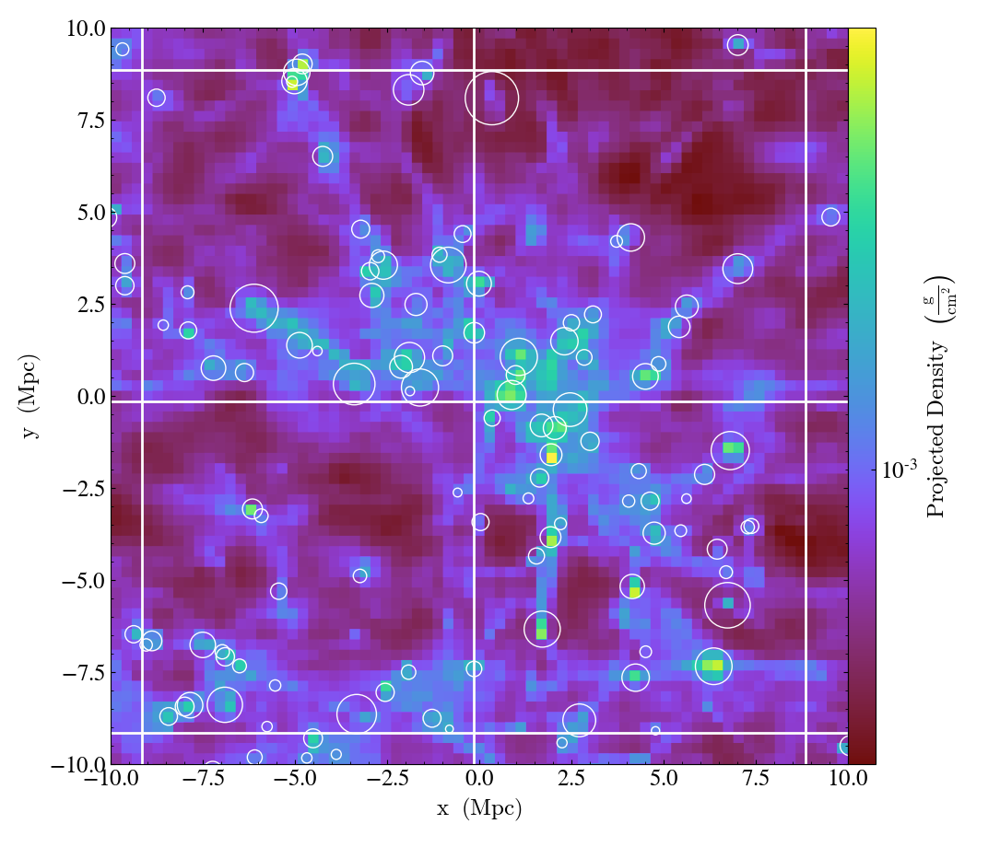

In [38]:
mass, c2 = data_ds.find_max("particle_mass")
prj = yt.ProjectionPlot(data_ds, 'z', 'density',center=[c2[0],c2[1],c2[2]], width=(20,'Mpc'))
prj.annotate_halos(hc)
prj.annotate_grids()
prj.show()

In [25]:
c2

YTArray([0.00195312, 0.00195312, 0.00195312]) code_length

yt : [INFO     ] 2019-10-07 17:01:12,017 Max Value is 1.37435e-22 at 0.5109615325927734 0.5147457122802735 0.4840908050537109
yt : [INFO     ] 2019-10-07 17:01:21,960 Projection completed
yt : [INFO     ] 2019-10-07 17:01:21,962 xlim = 0.510517 0.511406
yt : [INFO     ] 2019-10-07 17:01:21,964 ylim = 0.514301 0.515190
yt : [INFO     ] 2019-10-07 17:01:21,966 xlim = 0.510517 0.511406
yt : [INFO     ] 2019-10-07 17:01:21,967 ylim = 0.514301 0.515190
yt : [INFO     ] 2019-10-07 17:01:21,970 Making a fixed resolution buffer of (('gas', 'density')) 800 by 800
yt : [WARNING  ] 2019-10-07 17:01:22,441 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 17:01:22,485 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 17:01:22,530 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 17:01:22,575 Supplied id_loc but draw_ids is False. Not drawing grid ids
yt : [WARNING  ] 2019-10-07 17:01:2


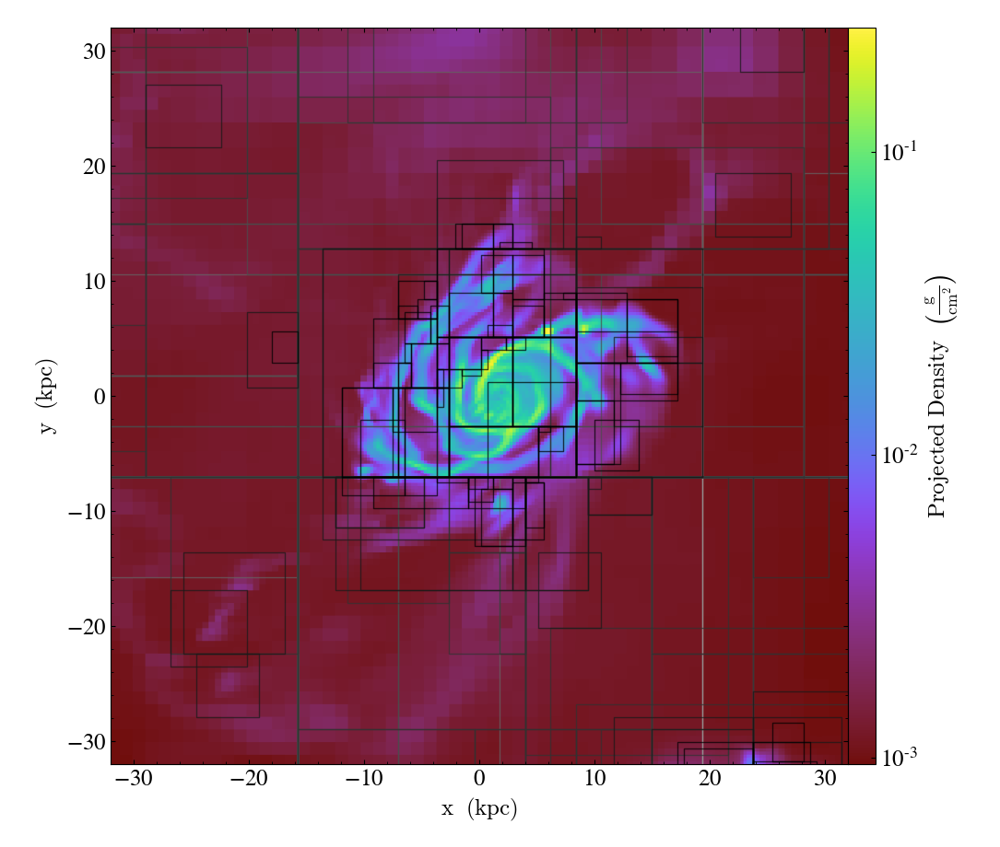

In [43]:
prj = yt.ProjectionPlot(data_ds, 'z', 'density',center='m', width=(64,'kpc'))
#prj.annotate_particles((64,'kpc'))
#prj.annotate_halos(hc)
prj.annotate_grids()
prj.show()

In [34]:
v1

1.3743546757721448e-22 g/cm**3

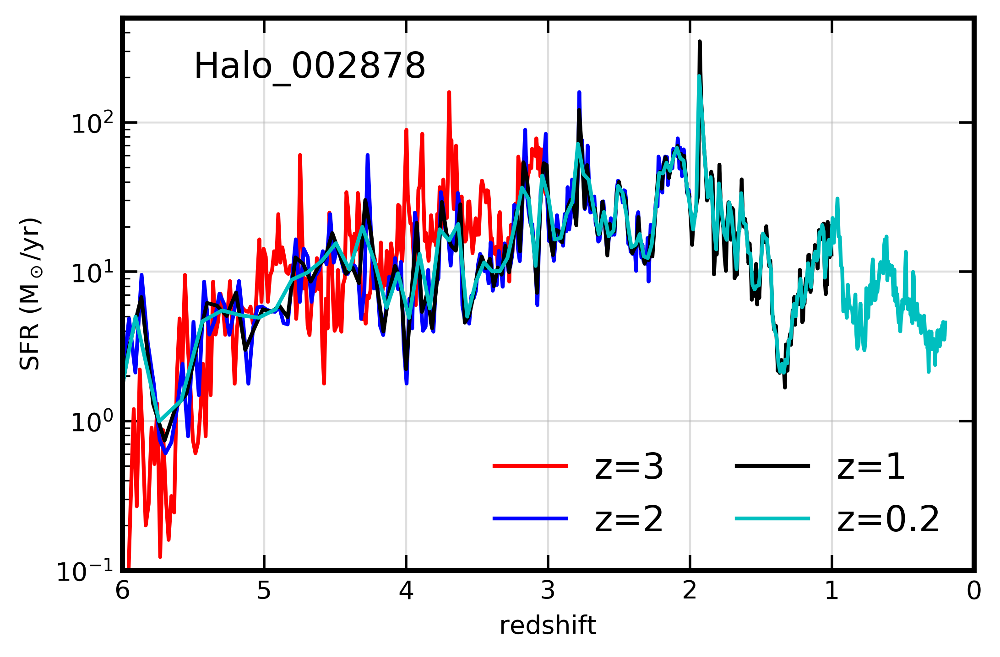

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

fort = np.loadtxt("/mnt/scratch/deovratd/Cosmological/halo_002878/StarFormationRate_16.out")
tm, radius = fort[:,2], fort[:,3]
fort = np.loadtxt("/mnt/scratch/deovratd/Cosmological/halo_002878/StarFormationRate_20.out")
tm1, radius1 = fort[:,2], fort[:,3]
fort = np.loadtxt("/mnt/scratch/deovratd/Cosmological/halo_002878/StarFormationRate_27.out")
tm2, radius2 = fort[:,2], fort[:,3]
fort = np.loadtxt("/mnt/scratch/deovratd/Cosmological/halo_002878/StarFormationRate_38.out")
tm3, radius3 = fort[:,2], fort[:,3]

fig, ax = plt.subplots(dpi=400)
ax.semilogy(tm, radius1, 'r-', label='z=3')
ax.semilogy(tm1, radius1, 'b-', label='z=2')
ax.semilogy(tm2, radius2, 'k-', label='z=1')
ax.semilogy(tm3, radius3, 'c-', label='z=0.2')
ax.legend(ncol=2,frameon=False, loc='lower right', fontsize=14)
ax.tick_params(bottom=True, top=True, left=True, right=True)
ax.tick_params(axis="x", direction="in", length=6, width=1)
ax.tick_params(axis="y", direction="in", length=6, width=1)
ax.tick_params(which='minor', axis="x", direction="in", length=3)
ax.tick_params(which='minor', axis="y", direction="in", length=3)
ax.spines['top'].set_linewidth(2.0)
ax.spines['bottom'].set_linewidth(2.0)
ax.spines['right'].set_linewidth(2.0)
ax.spines['left'].set_linewidth(2.0)
plt.xlim([6,0])
plt.ylim([0.1,500])
plt.xlabel('redshift')
plt.ylabel('SFR (M$_\odot$/yr)')
plt.text(5.5,200, 'Halo_002878', dict(size=14))
plt.grid(True,alpha=0.4,zorder=-10)
plt.savefig('/mnt/scratch/deovratd/Cosmological/halo_002878/SFR.pdf',dpi=400)
plt.show()

In [11]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

for n in range(170,171):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological_stellar_Feedback'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    ad = data_ds.all_data()
    d, c = data_ds.find_max("Dark_Matter_Density") 
    slc = yt.SlicePlot(data_ds, "x", "temperature",center=("max","Dark_Matter_Density"), width=(32,'kpc'))
    colorbar = slc.set_cmap(field='temperature', cmap='bds_highcontrast')
    #slc.set_zlim('density', 1.0e-30,1.0e-24)
    slc.set_zlim('temperature',1.0e4,1.0e8)
    #slc.annotate_grids()
    #slc.set_zlim('entropy', 1.0e-2,1.0e4)
    slc.annotate_title("$\epsilon=0.003$, time="+str(time))
    #slc.annotate_text([-28,28], 'Cold mode FB, Self consistent jet axis, kinetic jet', coord_system='plot')
    slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
                      plot_args={"color": "purple"})
    #slc.save("/mnt/scratch/deovratd/Cosmological/redshift_2_5_AGN/temp_"+str(fn))
    slc.show()

yt : [INFO     ] 2021-10-15 15:46:32,233 Parameters: current_time              = 170.81660281079
yt : [INFO     ] 2021-10-15 15:46:32,236 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2021-10-15 15:46:32,240 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2021-10-15 15:46:32,242 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2021-10-15 15:46:32,244 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2021-10-15 15:46:32,246 Parameters: current_redshift          = 1.8033370611939
yt : [INFO     ] 2021-10-15 15:46:32,248 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2021-10-15 15:46:32,250 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2021-10-15 15:46:32,252 Parameters: omega_radiation           = 0
yt : [INFO     ] 2021-10-15 15:46:32,253 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3443/3443 [00:00<00:00, 7152.67it/s]
yt : [INFO     ] 2021-10-1

KeyboardInterrupt: 

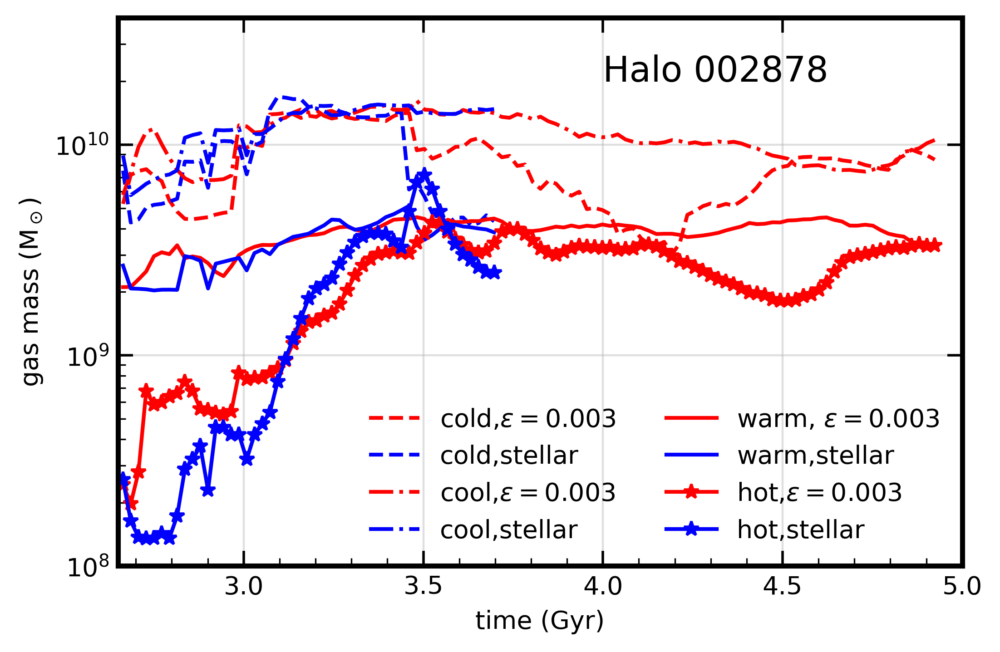

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

fort = np.loadtxt("/mnt/scratch/deovratd/Cosmological/eff_3-e3/gas_mass_phase_time")
tm, cold, cool, warm, hot = fort[:,0], fort[:,1], fort[:,2], fort[:,3], fort[:,4]
#fort1 = np.loadtxt("/mnt/scratch/deovratd/Cosmological_stellar_Feedback/gas_phase_vs_time")
#tm1, cold1, cool1, warm1, hot1 = fort1[:,0], fort1[:,1], fort1[:,2], fort1[:,3], fort1[:,4]
fort2 = np.loadtxt("/mnt/scratch/deovratd/stellar_st2_5/gas_phase_time")
tm2, cold2, cool2, warm2, hot2 = fort2[:,0], fort2[:,1], fort2[:,2], fort2[:,3], fort2[:,4]

fig, ax = plt.subplots(dpi=400)
ax.semilogy(tm, cold,'r--', label='cold,$\epsilon=0.003$')
ax.semilogy(tm2, cold2, 'b--', label='cold,stellar')
ax.semilogy(tm, cool-cold,'r-.', label='cool,$\epsilon=0.003$')
ax.semilogy(tm2, cool2-cold2, 'b-.', label='cool,stellar')
ax.semilogy(tm, warm-cool,'r-', label='warm, $\epsilon=0.003$')
#ax.semilogy(tm1, warm1, 'b-', label='stellar, run 1')
ax.semilogy(tm2, warm2-cool2, 'b-', label='warm,stellar')
ax.semilogy(tm, hot,'r-*', label='hot,$\epsilon=0.003$')
ax.semilogy(tm2, hot2, 'b-*', label='hot,stellar')
ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.legend(ncol=2,frameon=False, loc='lower right', fontsize=10)
ax.tick_params(bottom=True, top=True, left=True, right=True)
ax.tick_params(axis="x", direction="in", length=6, width=1)
ax.tick_params(axis="y", direction="in", length=6, width=1)
ax.tick_params(which='minor', axis="x", direction="in", length=3)
ax.tick_params(which='minor', axis="y", direction="in", length=3)
ax.spines['top'].set_linewidth(2.0)
ax.spines['bottom'].set_linewidth(2.0)
ax.spines['right'].set_linewidth(2.0)
ax.spines['left'].set_linewidth(2.0)
plt.xlim([2.65,5.0])
plt.ylim([1.0e8,4.0e10])
plt.xlabel('time (Gyr)')
plt.ylabel('gas mass (M$_\odot$)')
plt.text(4,2.0e10, 'Halo 002878', dict(size=14))
plt.grid(True,alpha=0.4,zorder=-10)
plt.savefig('/mnt/scratch/deovratd/Cosmological/eff_3-e3/gas_mass_1e6.pdf',dpi=400)
plt.show()

In [17]:
hot

array([[2.6642339e+00, 5.2356641e+09, 1.1000491e+10, 1.3107911e+10,
        2.4343849e+08],
       [2.6857530e+00, 7.5862974e+09, 1.6659314e+10, 1.9300522e+10,
        2.9990313e+08],
       [2.7072706e+00, 7.0045831e+09, 1.6571458e+10, 1.8912606e+10,
        2.7522385e+08],
       [2.7287882e+00, 7.7329034e+09, 1.7087764e+10, 1.9796086e+10,
        3.2060052e+08]])

yt : [INFO     ] 2020-11-20 21:38:56,349 Parameters: current_time              = 123.81653313164
yt : [INFO     ] 2020-11-20 21:38:56,350 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-11-20 21:38:56,351 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-11-20 21:38:56,352 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-11-20 21:38:56,354 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-11-20 21:38:56,355 Parameters: current_redshift          = 2.494169934926
yt : [INFO     ] 2020-11-20 21:38:56,356 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-11-20 21:38:56,357 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-11-20 21:38:56,358 Parameters: omega_radiation           = 0
yt : [INFO     ] 2020-11-20 21:38:56,359 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3366/3366 [00:00<00:00, 8566.51it/s] 
yt : [INFO     ] 2020-11-2


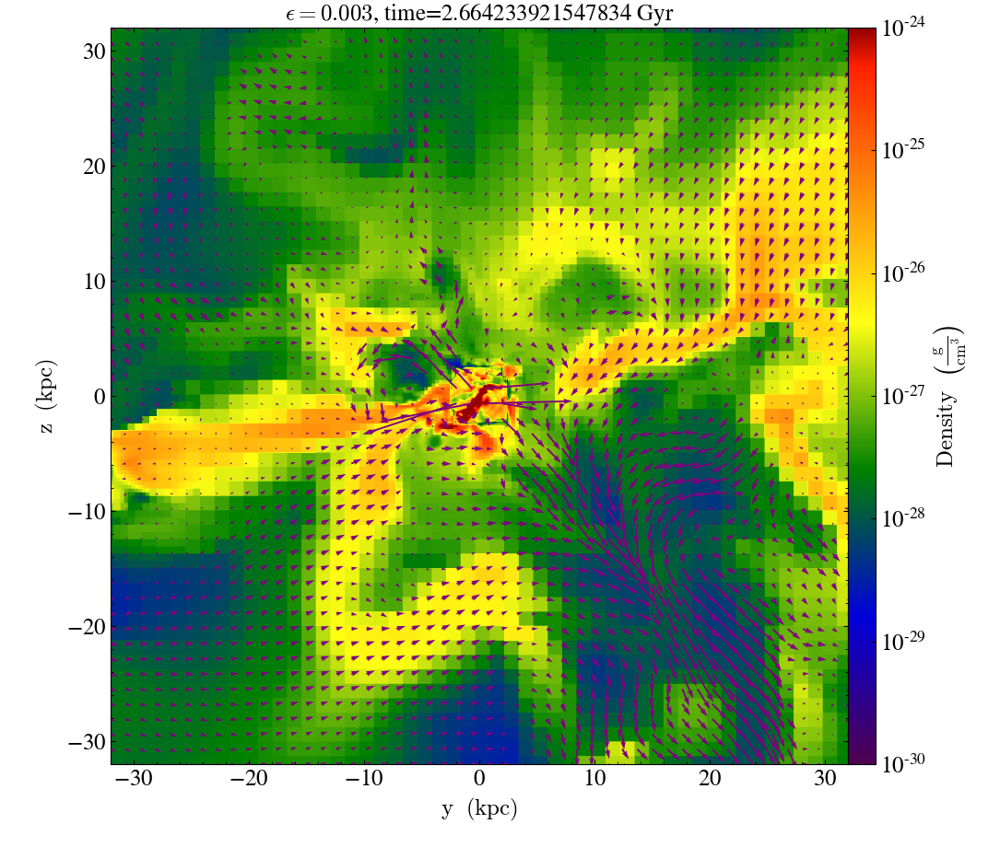

In [3]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

for n in range(123,124):
    fn='%04d'%n
    fd='/DD'+str(fn)
    ff='/DD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/redshift_2_5_AGN'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    ad = data_ds.all_data()
    d, c = data_ds.find_max("Dark_Matter_Density") 
    slc = yt.SlicePlot(data_ds, "x", "density",center=("max","Dark_Matter_Density"), width=(64,'kpc'))
    colorbar = slc.set_cmap(field='density', cmap='bds_highcontrast')
    slc.set_zlim('density', 1.0e-30,1.0e-24)
    #slc.set_zlim('temperature',1.0e4,1.0e8)
    #slc.annotate_grids()
    #slc.set_zlim('entropy', 1.0e-2,1.0e4)
    slc.annotate_title("$\epsilon=0.003$, time="+str(time))
    #slc.annotate_text([-28,28], 'Cold mode FB, Self consistent jet axis, kinetic jet', coord_system='plot')
    slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
                      plot_args={"color": "purple"})
    slc.save("/mnt/scratch/deovratd/Cosmological/redshift_2_5_AGN/dens_"+str(fn))
    slc.show()

yt : [INFO     ] 2020-11-20 22:28:15,577 Parameters: current_time              = 123.51339429792
yt : [INFO     ] 2020-11-20 22:28:15,579 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2020-11-20 22:28:15,580 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2020-11-20 22:28:15,581 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2020-11-20 22:28:15,582 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2020-11-20 22:28:15,583 Parameters: current_redshift          = 2.4999986587087
yt : [INFO     ] 2020-11-20 22:28:15,584 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2020-11-20 22:28:15,586 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2020-11-20 22:28:15,587 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2020-11-20 22:28:15,588 Parameters: hubble_constant           = 0.695
Parsing Hierarchy : 100%|██████████| 3351/3351 [00:00<00:00, 7619.64it/s] 
yt : [INFO     ] 2020-1


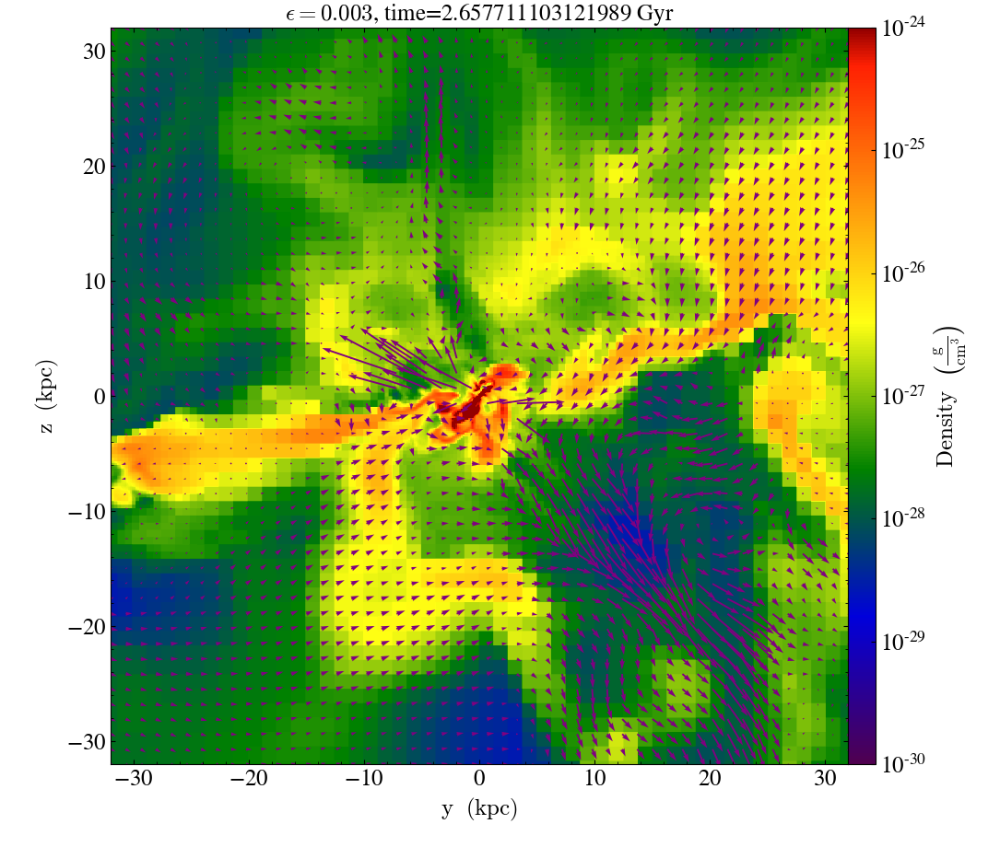

In [6]:
import yt
from yt.analysis_modules.halo_analysis.api import HaloCatalog
from yt.analysis_modules.halo_finding.api import HOPHaloFinder
from yt.data_objects.particle_filters import add_particle_filter

for n in range(18,19):
    fn='%04d'%n
    fd='/RD'+str(fn)
    ff='/RD'+str(fn)
    fpath='/mnt/scratch/deovratd/Cosmological/halo_002878'+fd+ff
    data_ds = yt.load(fpath)
    time = data_ds.current_time.in_units('Gyr')
    ad = data_ds.all_data()
    d, c = data_ds.find_max("Dark_Matter_Density") 
    slc = yt.SlicePlot(data_ds, "x", "density",center=("max","Dark_Matter_Density"), width=(64,'kpc'))
    colorbar = slc.set_cmap(field='density', cmap='bds_highcontrast')
    slc.set_zlim('density', 1.0e-30,1.0e-24)
    #slc.set_zlim('temperature',1.0e4,1.0e8)
    #slc.annotate_grids()
    #slc.set_zlim('entropy', 1.0e-2,1.0e4)
    slc.annotate_title("$\epsilon=0.003$, time="+str(time))
    #slc.annotate_text([-28,28], 'Cold mode FB, Self consistent jet axis, kinetic jet', coord_system='plot')
    slc.annotate_quiver('velocity_y', 'velocity_z', factor=16,
                      plot_args={"color": "purple"})
    slc.save("/mnt/scratch/deovratd/Cosmological/redshift_2_5_AGN/initial_z_2_5_"+str(fn))
    slc.show()